<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/main/CCADMACL_Project_Implementation_extracted_outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

Main Research Idea: How do income and expenditure patterns among Filipino households reflect socioeconomic disparities, and what insights can inform targeted financial and policy interventions?

Specific Research Questions:
1. What are the distinguishing characteristics of each cluster in terms of spending habits:
    - Family Composition
    - Household Head Characteristics
    - Income Sources
    - Expenditure Priorities (essential and non-essential spending)
    - Savings and Debt Behavior
2. How do income levels influence spending habits across different household clusters?
3. How can financial interventions (e.g., subsidies, tax incentives, financial education) be tailored to different household clusters?


In [240]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.cm as cm

from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize, PowerTransformer
from collections import Counter
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV, mutual_info_regression, SelectKBest, f_regression
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors


# Data Loading

In [241]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [242]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [243]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [244]:
df.isna().sum()

Total Household Income                              0
Region                                              0
Total Food Expenditure                              0
Main Source of Income                               0
Agricultural Household indicator                    0
Bread and Cereals Expenditure                       0
Total Rice Expenditure                              0
Meat Expenditure                                    0
Total Fish and  marine products Expenditure         0
Fruit Expenditure                                   0
Vegetables Expenditure                              0
Restaurant and hotels Expenditure                   0
Alcoholic Beverages Expenditure                     0
Tobacco Expenditure                                 0
Clothing, Footwear and Other Wear Expenditure       0
Housing and water Expenditure                       0
Imputed House Rental Value                          0
Medical Care Expenditure                            0
Transportation Expenditure  

In [245]:
df.duplicated().sum()

np.int64(0)

# Exploratory Data Analysis

In [246]:
df['Region'].value_counts()

Region
IVA - CALABARZON             4162
NCR                          4130
III - Central Luzon          3237
VI - Western Visayas         2851
VII - Central Visayas        2541
V - Bicol Region             2472
XI - Davao Region            2446
I - Ilocos Region            2348
VIII - Eastern Visayas       2337
 ARMM                        2248
II - Cagayan Valley          2219
XII - SOCCSKSARGEN           2122
X - Northern Mindanao        1887
IX - Zasmboanga Peninsula    1788
Caraga                       1782
CAR                          1725
IVB - MIMAROPA               1249
Name: count, dtype: int64

In [247]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [248]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [249]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [250]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [251]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [252]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


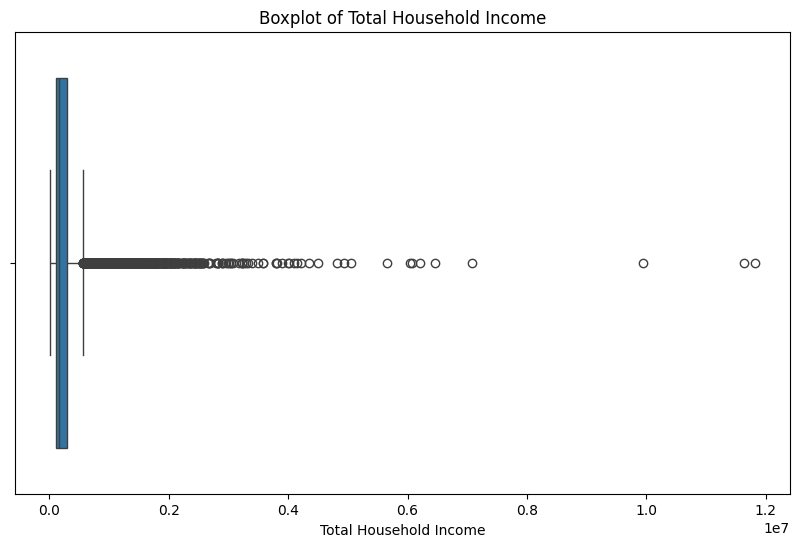

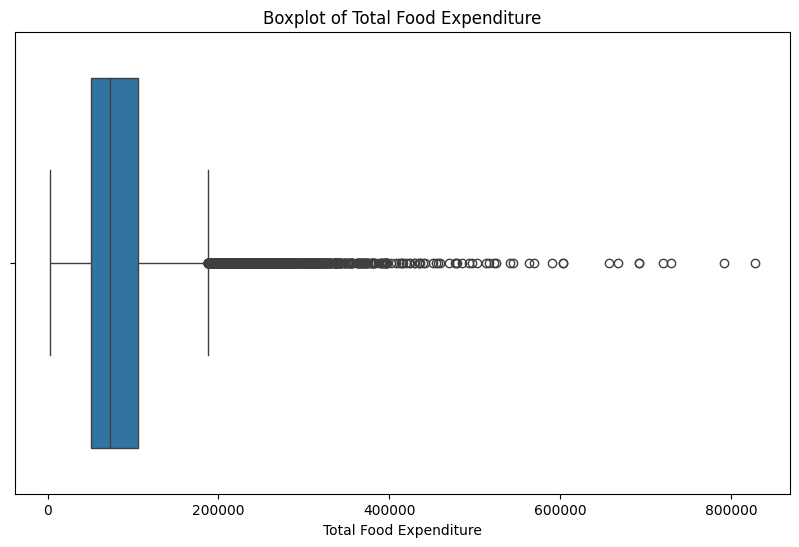

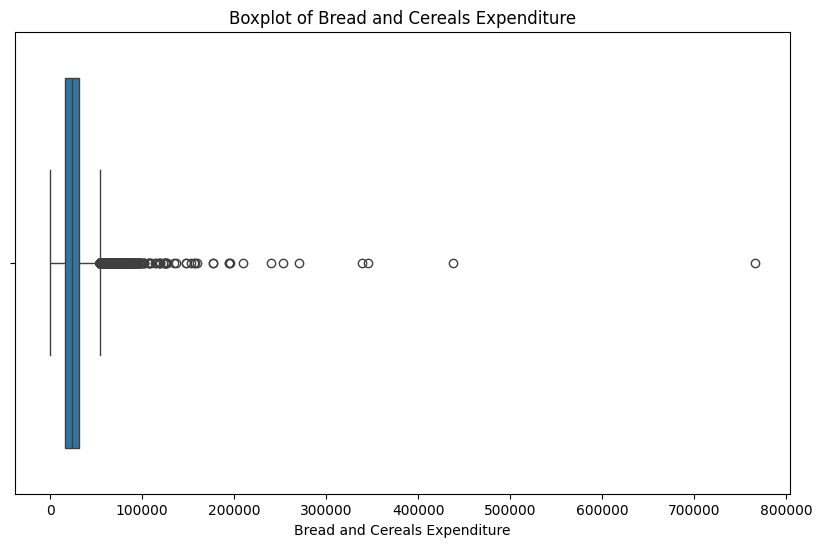

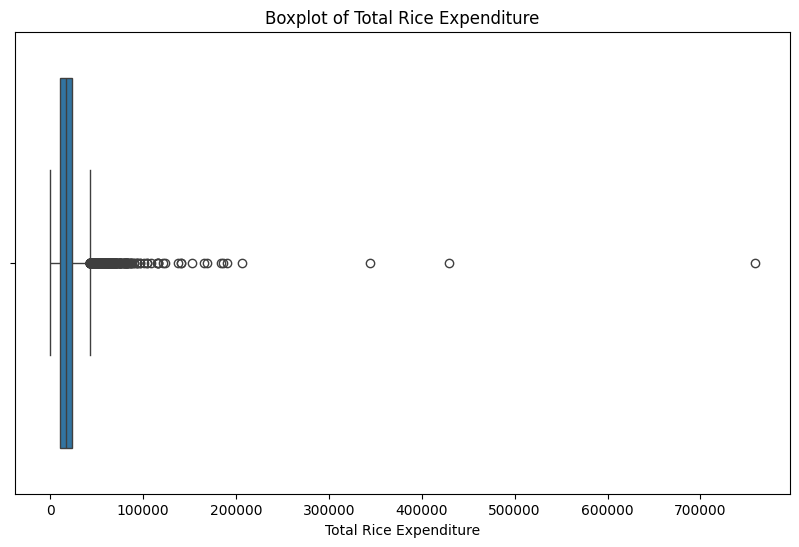

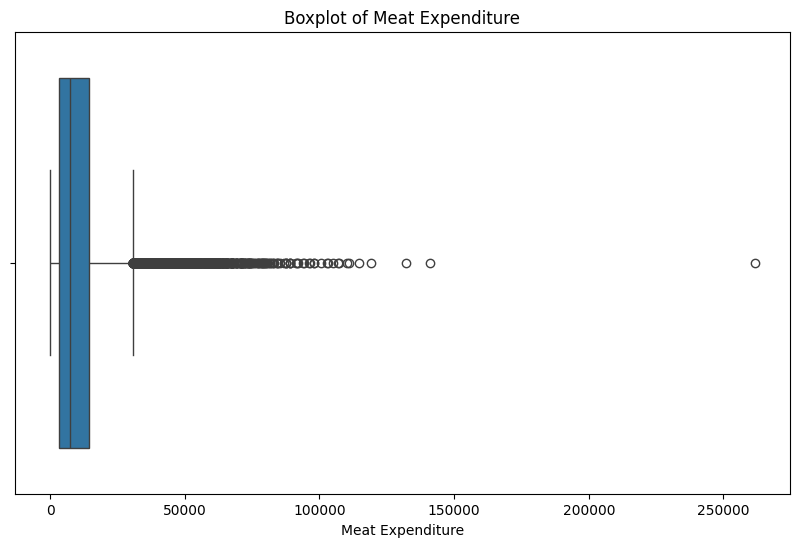

...

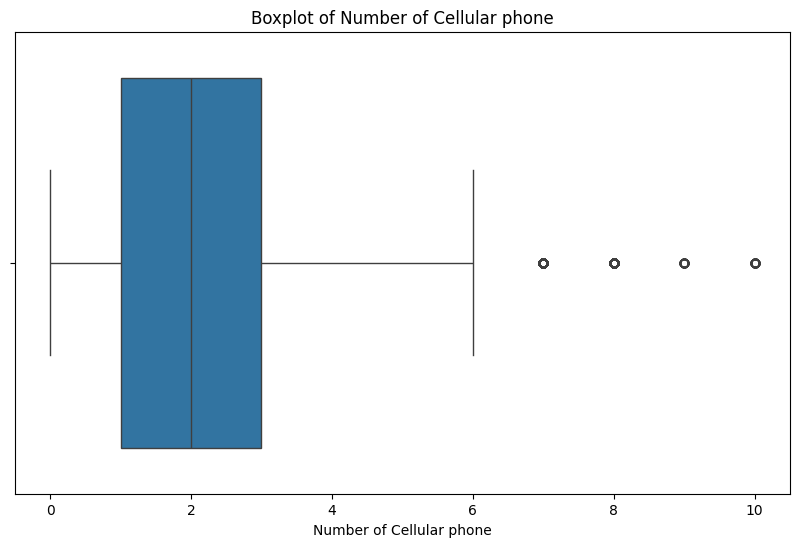

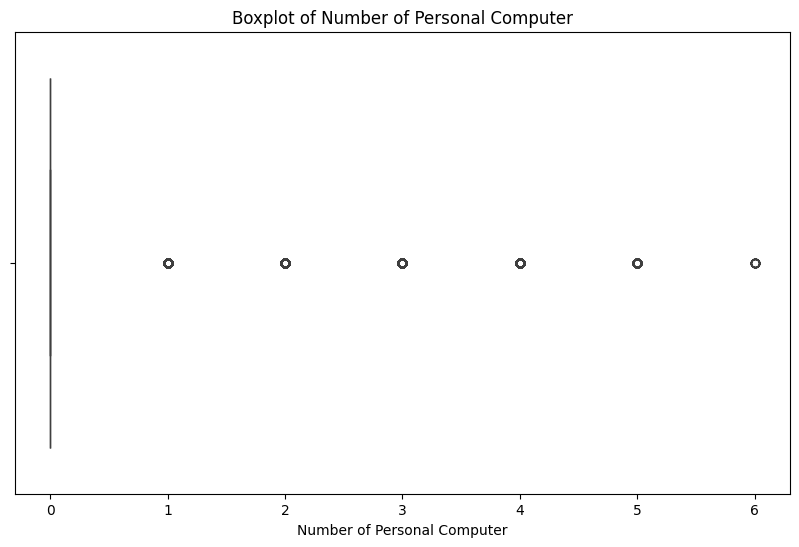

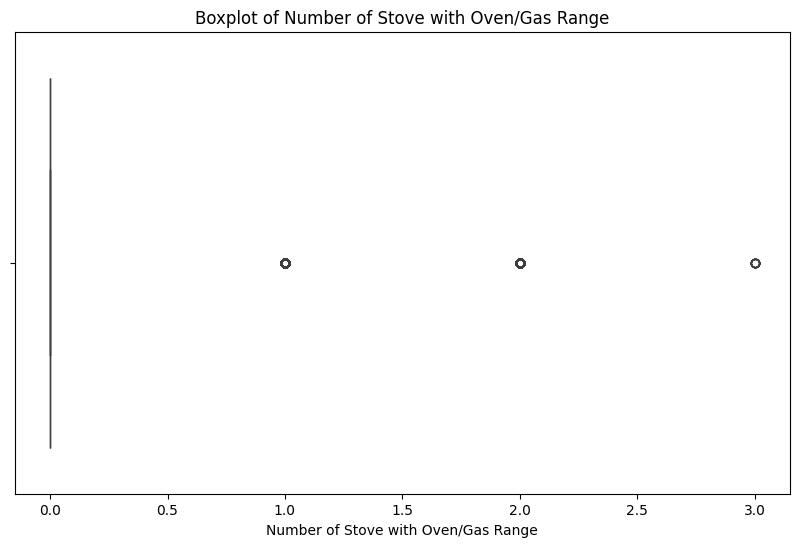

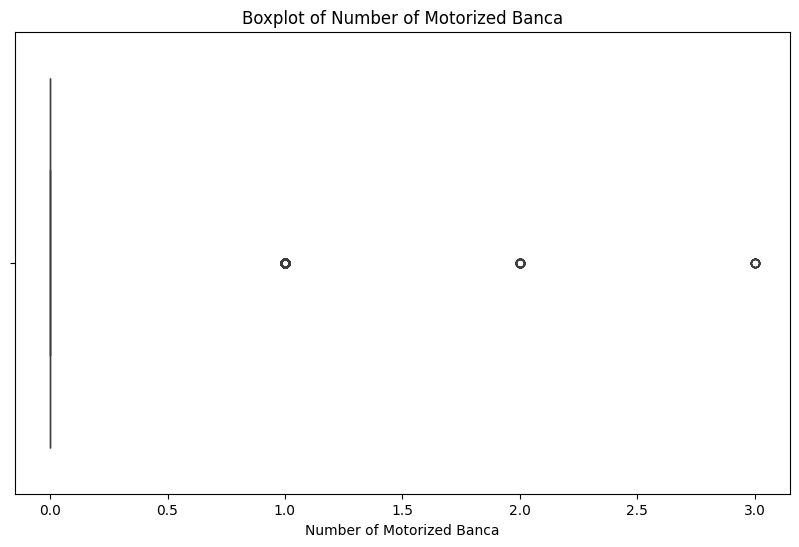

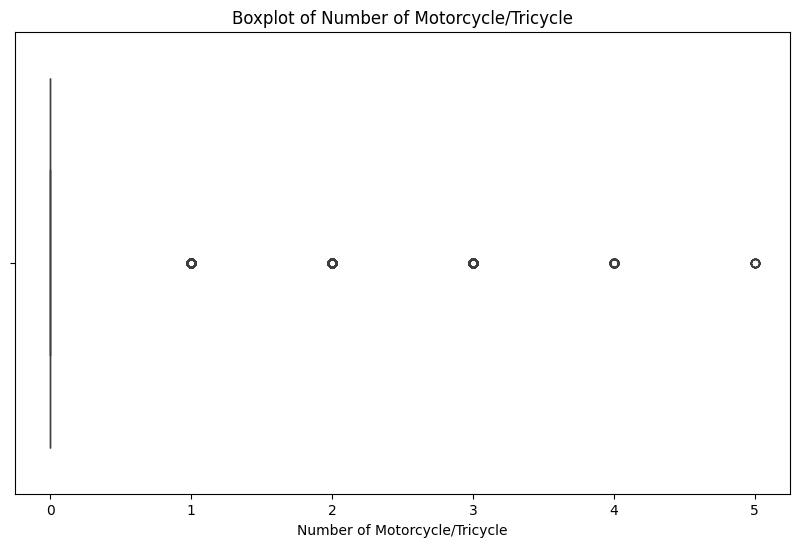

In [253]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

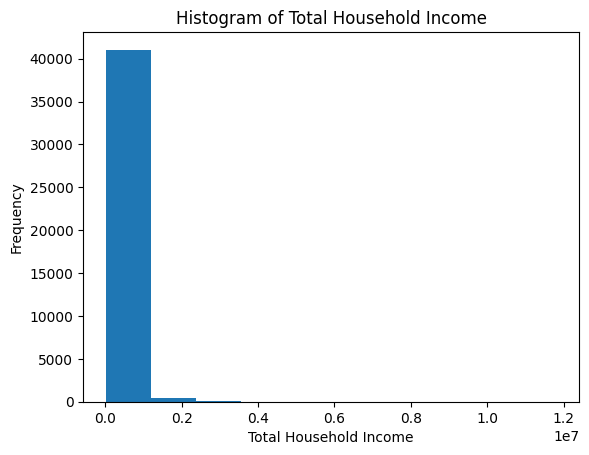

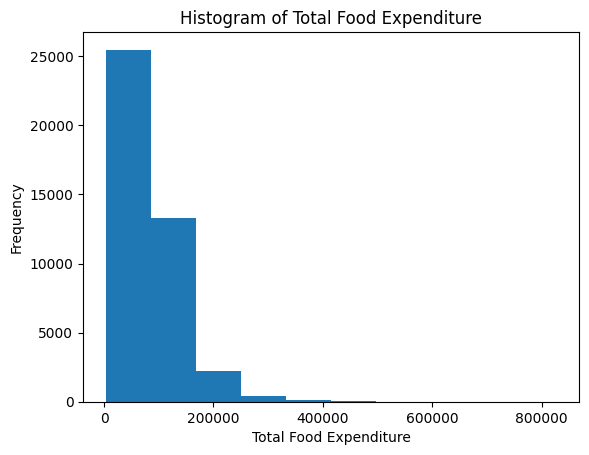

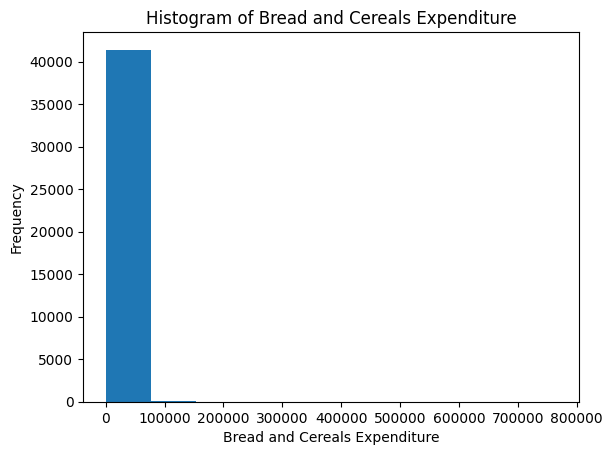

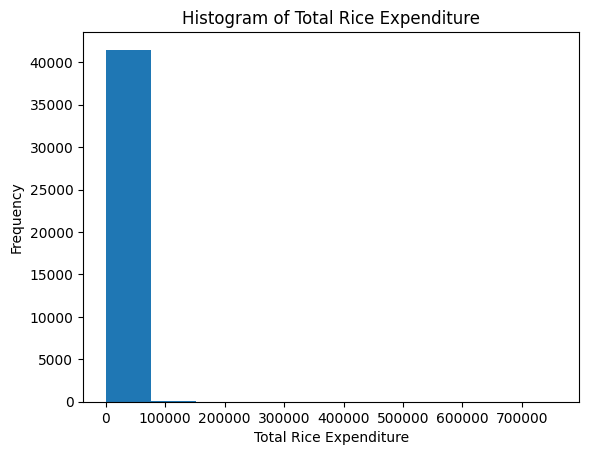

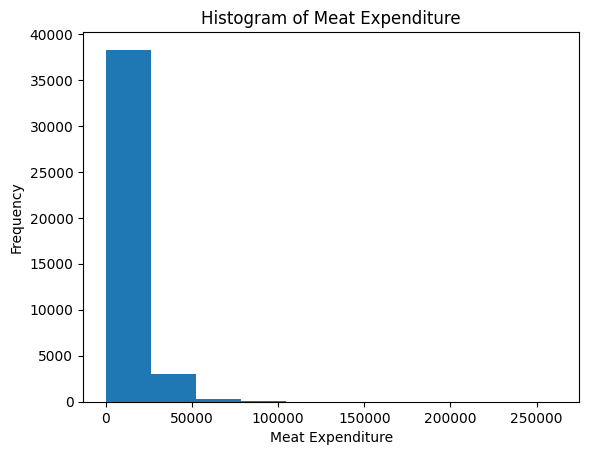

...

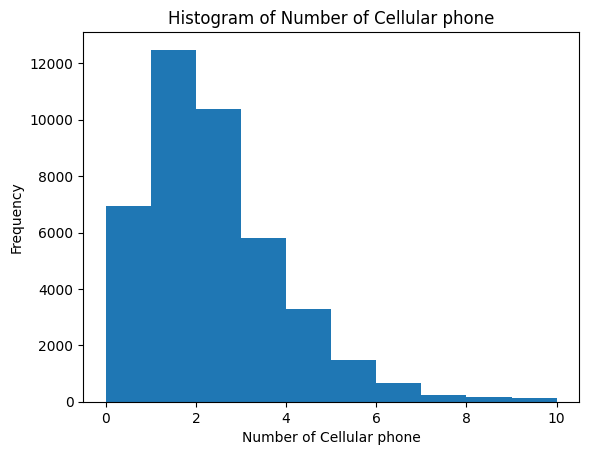

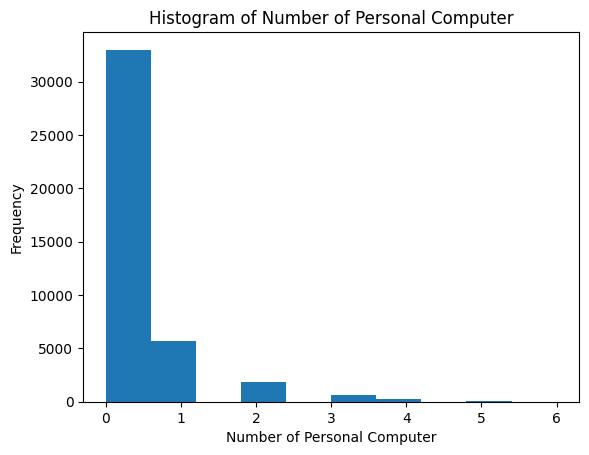

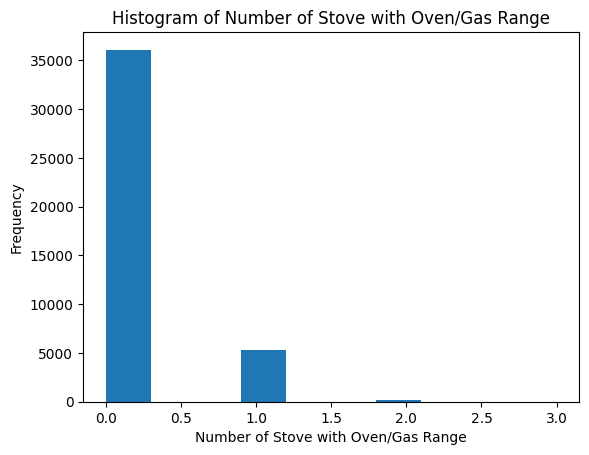

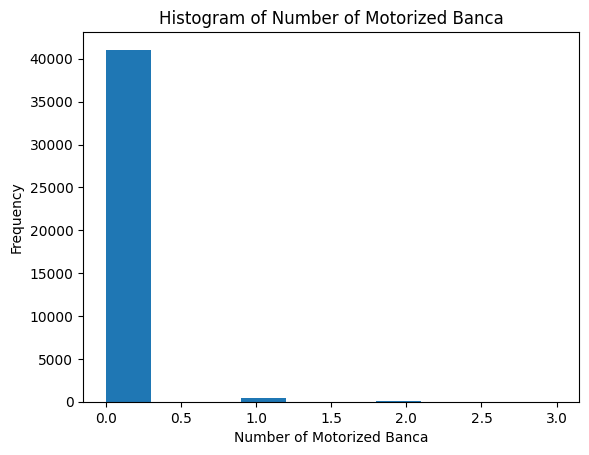

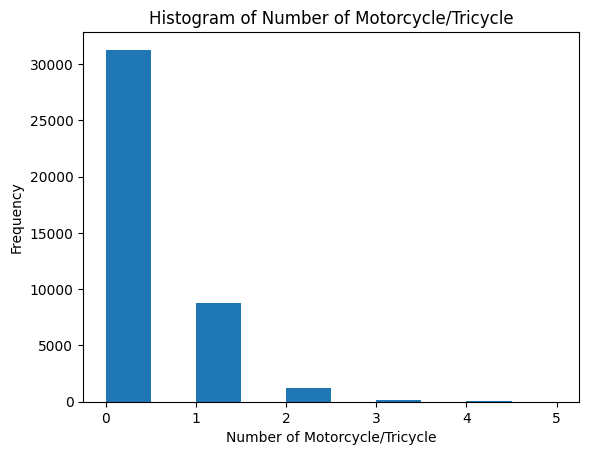

In [254]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [255]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

Region
NCR                          420861.861501
IVA - CALABARZON             303360.536040
III - Central Luzon          292965.181650
CAR                          269540.484638
XI - Davao Region            238115.891251
I - Ilocos Region            238110.084327
II - Cagayan Valley          236778.221721
VII - Central Visayas        234909.314050
VI - Western Visayas         220481.260260
IVB - MIMAROPA               216685.124900
X - Northern Mindanao        214057.779544
Caraga                       196907.376543
VIII - Eastern Visayas       196736.581087
IX - Zasmboanga Peninsula    191000.908277
V - Bicol Region             186105.492718
XII - SOCCSKSARGEN           182984.802545
 ARMM                        134746.817616
Name: Total Household Income, dtype: float64

> Key Insights from numerical columns
- Too many outliers for all numerical values due to extreme household income values
- Zero values and positive skew for all numerical values
- The Greater Manila Area (NCR and neighboring provinces) have the most share of the income across the Philippines.
- Average Total Household Income comes around 250K
- Transformation and Outlier Detection is vital to cap extreme values and normalize the distribution


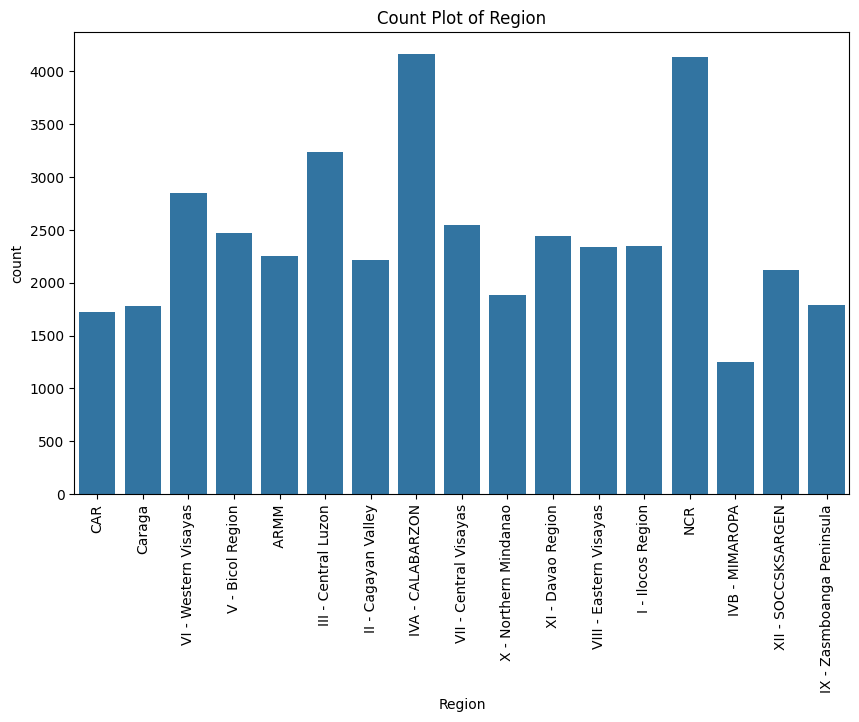

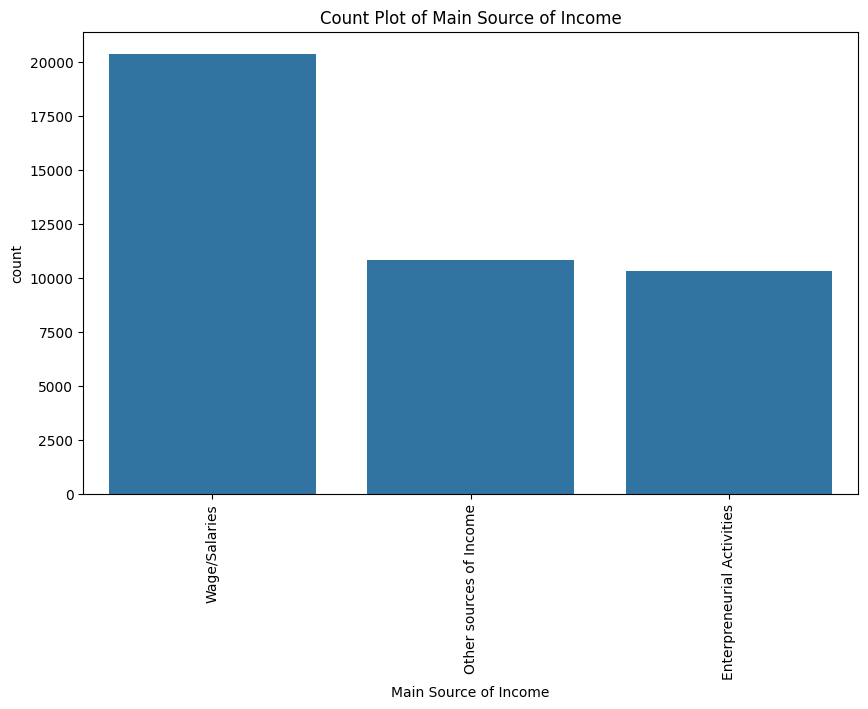

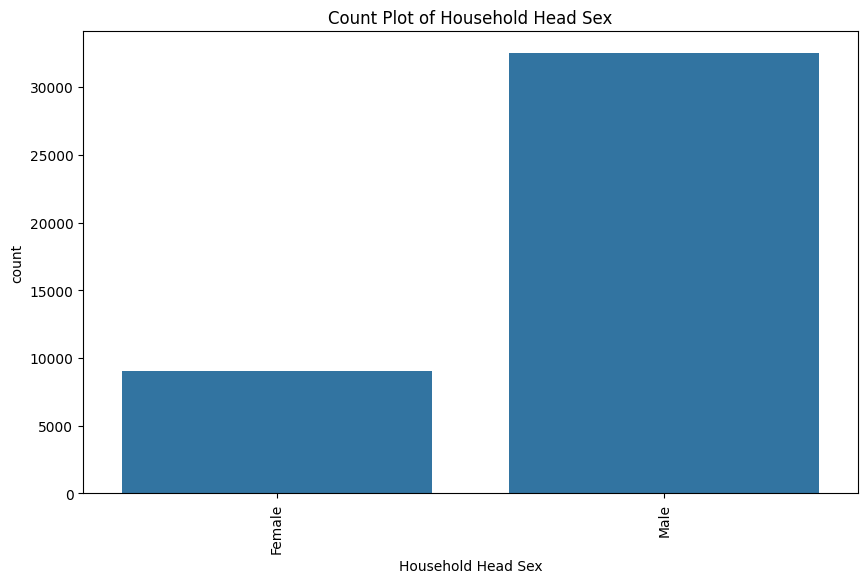

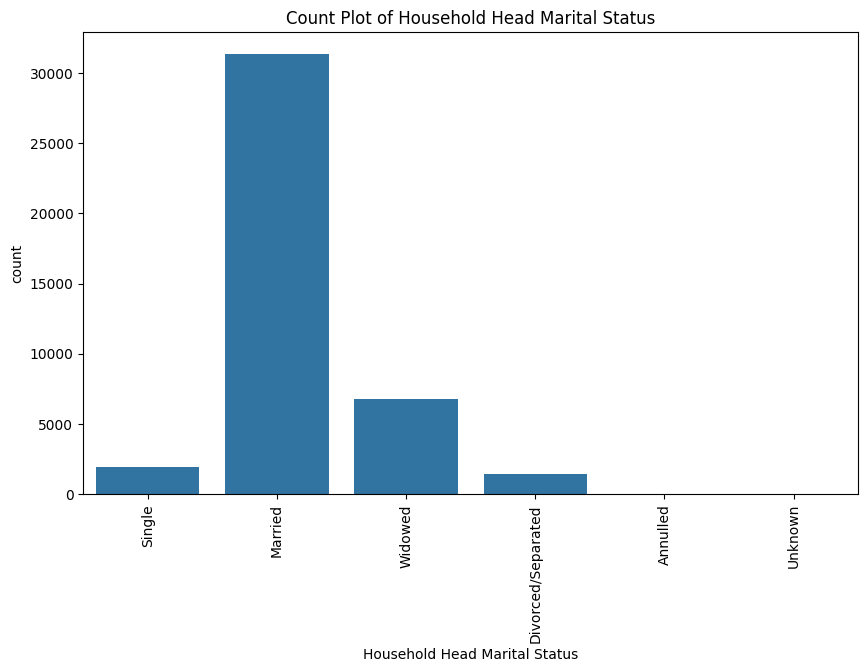

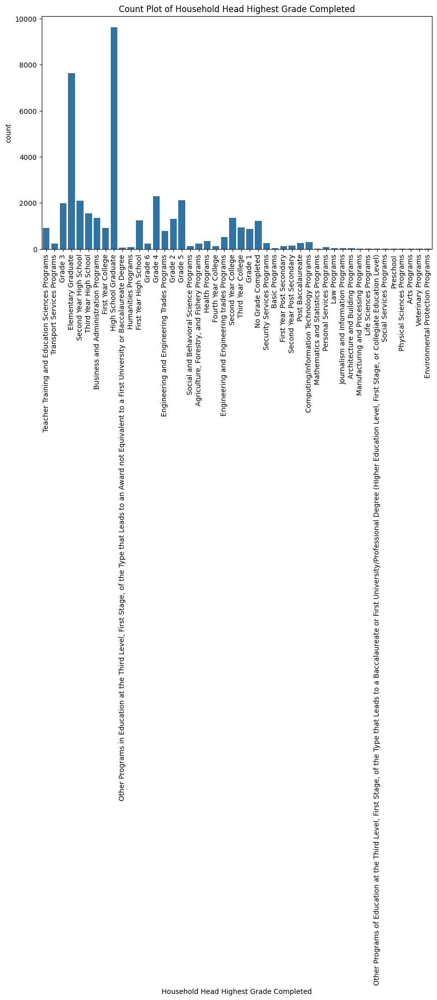

...

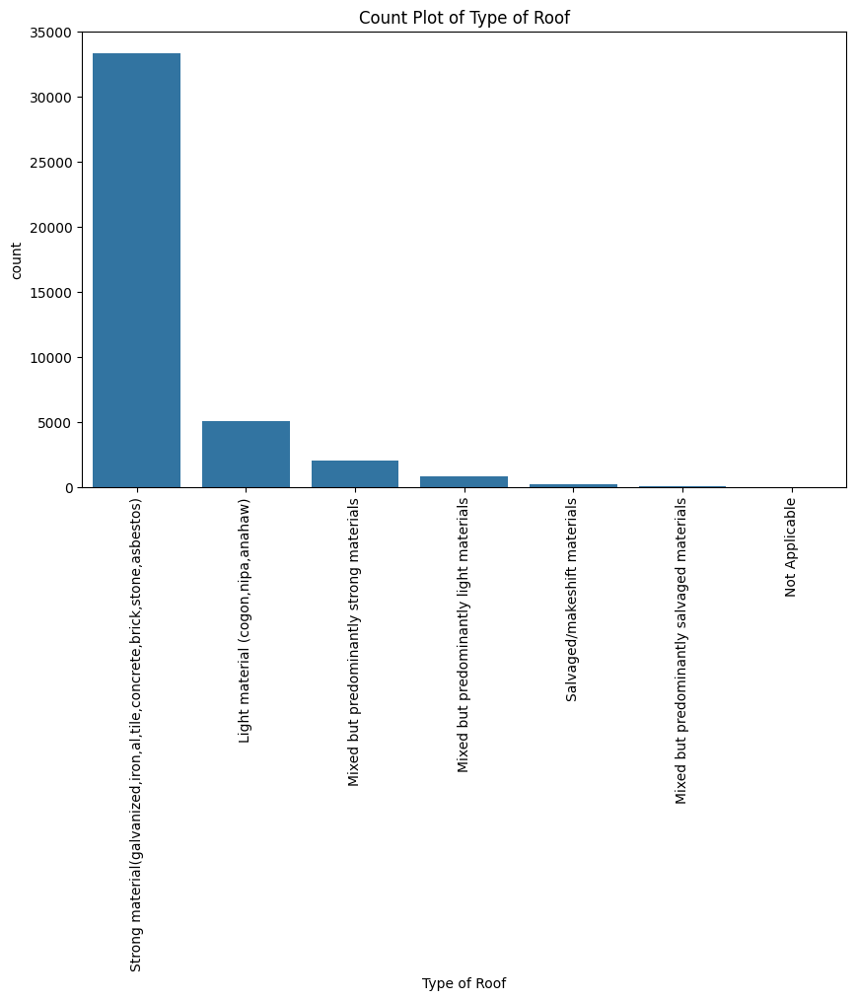

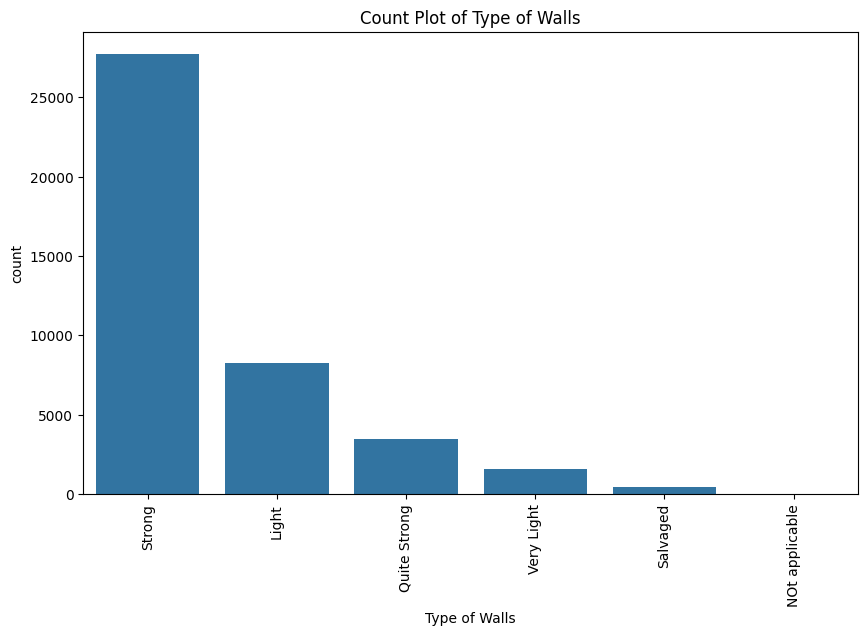

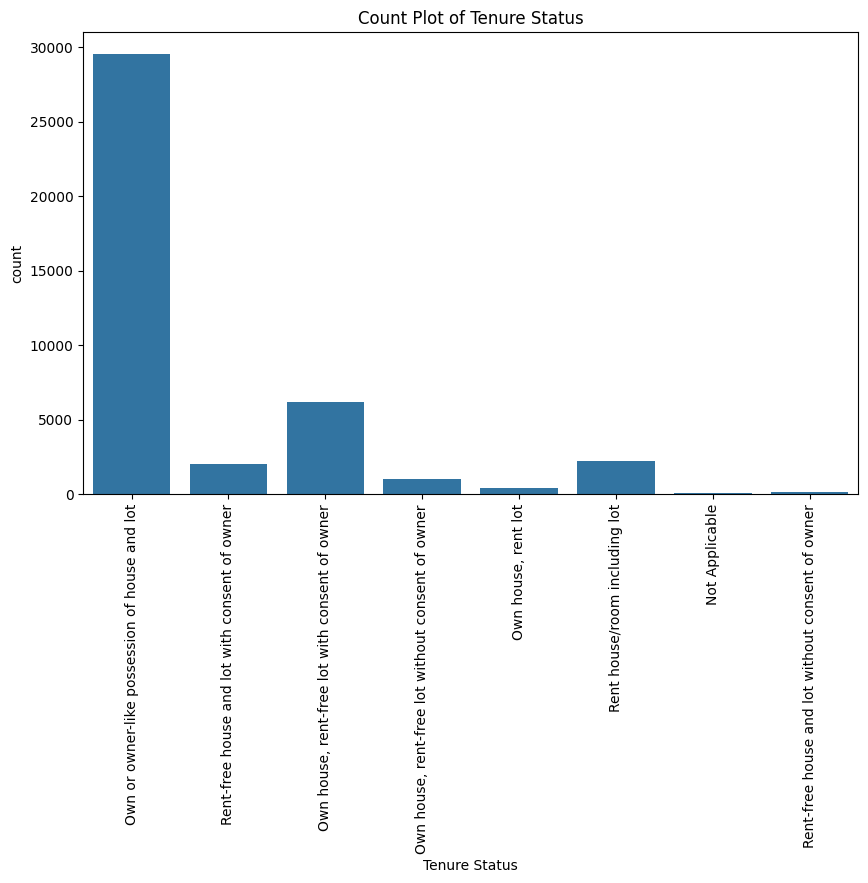

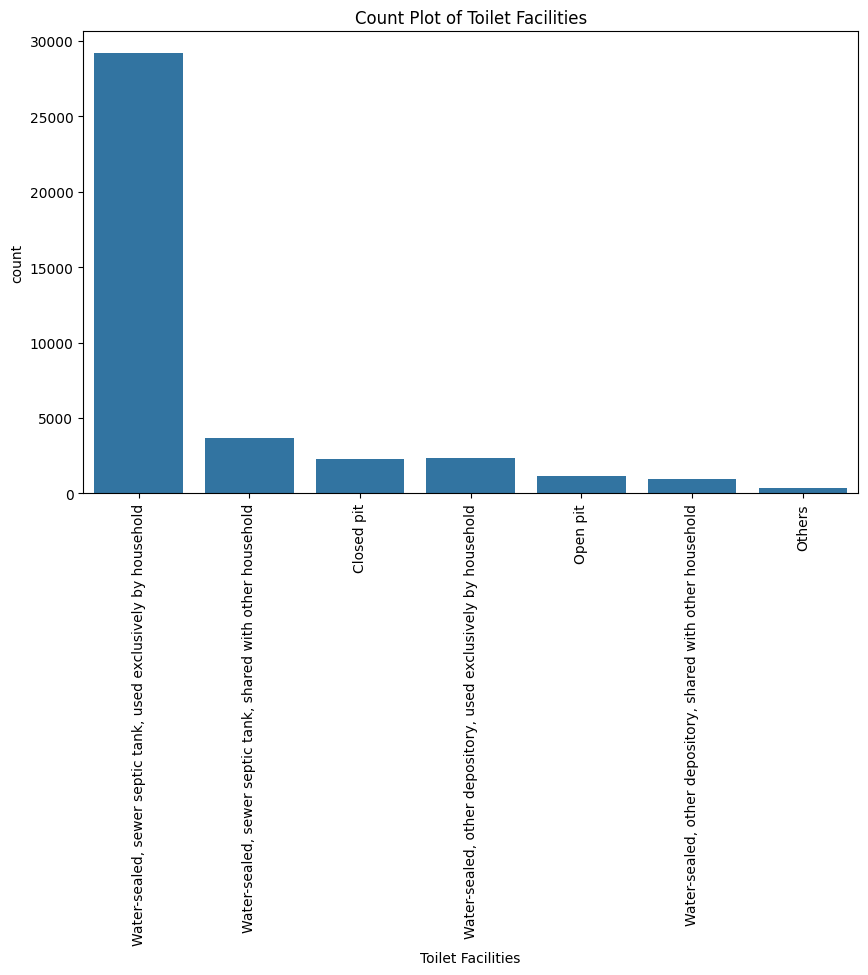

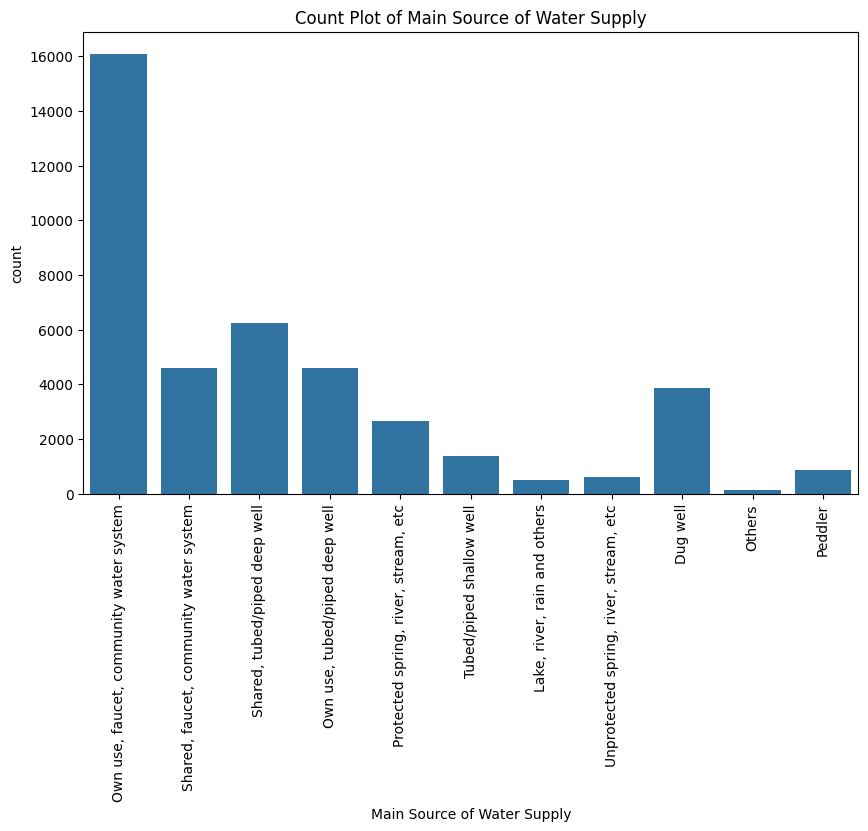

In [256]:
# Plot categorical columns. Tilt x values to display vertically
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=90)
    plt.title(f'Count Plot of {col}')

In [257]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [258]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [259]:
df['Household Head Occupation'].value_counts()

Household Head Occupation
Farmhands and laborers                                                                 3478
Rice farmers                                                                           2849
General managers/managing proprietors in wholesale and retail trade                    2028
General managers/managing proprietors in transportation, storage and communications    1932
Corn farmers                                                                           1724
                                                                                       ... 
Petroleum and natural gas refining plant operators                                        1
Builders (traditional materials)                                                          1
Personal care and related workers, n. e. c.                                               1
Riggers and cable splicers                                                                1
Glass, ceramics and related plant operators n. e. c.  

In [260]:
df['Household Head Highest Grade Completed'].value_counts()

Household Head Highest Grade Completed
High School Graduate                                                                                                                                                                                                   9628
Elementary Graduate                                                                                                                                                                                                    7640
Grade 4                                                                                                                                                                                                                2282
Grade 5                                                                                                                                                                                                                2123
Second Year High School                                                          

In [261]:
df['Household Head Class of Worker'].value_counts()

Household Head Class of Worker
Self-employed wihout any employee                             13766
Worked for private establishment                              13731
Worked for government/government corporation                   2820
Employer in own family-operated farm or business               2581
Worked for private household                                    811
Worked without pay in own family-operated farm or business      285
Worked with pay in own family-operated farm or business          14
Name: count, dtype: int64

In [262]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

Region
NCR                          1021
IVA - CALABARZON              924
III - Central Luzon           804
I - Ilocos Region             553
VI - Western Visayas          548
VII - Central Visayas         449
V - Bicol Region              411
VIII - Eastern Visayas        370
XI - Davao Region             366
II - Cagayan Valley           365
XII - SOCCSKSARGEN            314
CAR                           297
X - Northern Mindanao         289
Caraga                        278
IX - Zasmboanga Peninsula     247
 ARMM                         154
IVB - MIMAROPA                146
Name: count, dtype: int64

In [263]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

Region
NCR                          1021
IVA - CALABARZON              924
III - Central Luzon           804
I - Ilocos Region             553
VI - Western Visayas          548
VII - Central Visayas         449
V - Bicol Region              411
VIII - Eastern Visayas        370
XI - Davao Region             366
II - Cagayan Valley           365
XII - SOCCSKSARGEN            314
CAR                           297
X - Northern Mindanao         289
Caraga                        278
IX - Zasmboanga Peninsula     247
 ARMM                         154
IVB - MIMAROPA                146
Name: count, dtype: int64

In [264]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

Region
NCR                          1021
IVA - CALABARZON              924
III - Central Luzon           804
I - Ilocos Region             553
VI - Western Visayas          548
VII - Central Visayas         449
V - Bicol Region              411
VIII - Eastern Visayas        370
XI - Davao Region             366
II - Cagayan Valley           365
XII - SOCCSKSARGEN            314
CAR                           297
X - Northern Mindanao         289
Caraga                        278
IX - Zasmboanga Peninsula     247
 ARMM                         154
IVB - MIMAROPA                146
Name: count, dtype: int64

> Key Insights from numerical columns
- Household Distribution based on Region is not well-distributed and well-represented. Omit the feature
- Occupation and Educational Attainment contains too many values for model training and may introduce noise
- Null Values (n = 7536) is too many to be dropped. Impute with "Unknown"
- Repetitive values could be further simplified in some categories (e.g. Tenure Status, Source of Water)


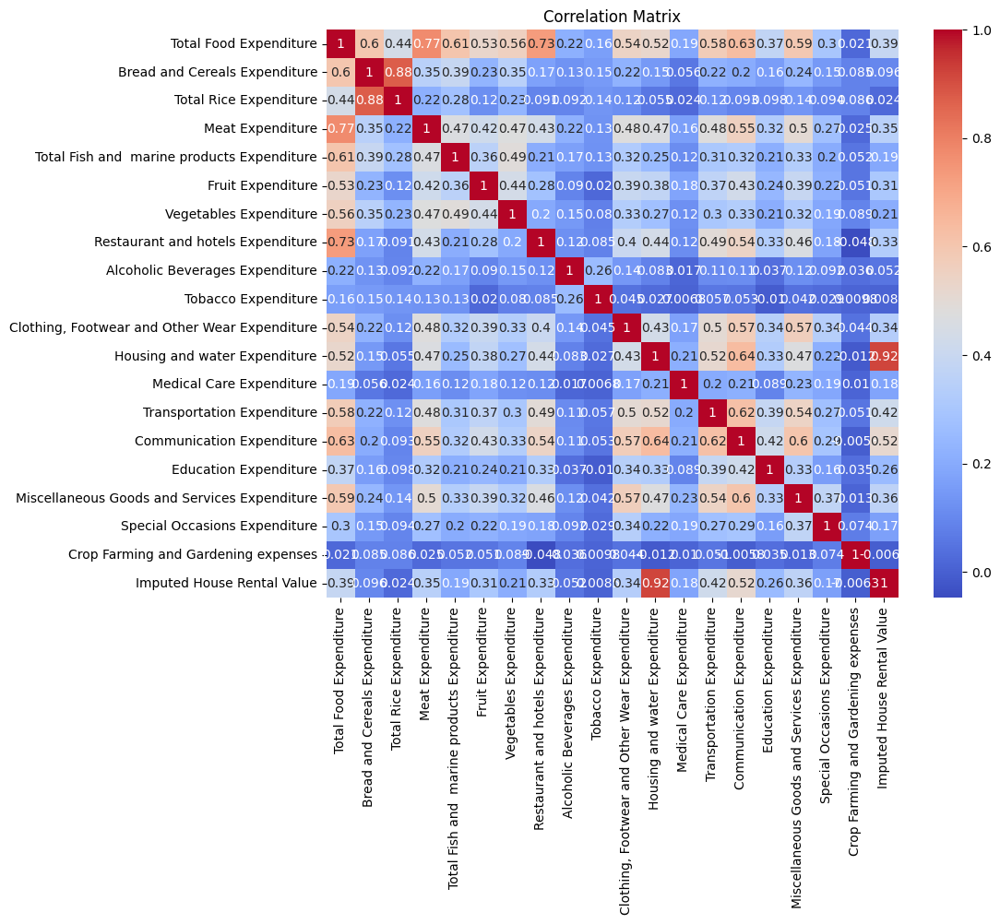

In [265]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [266]:
# Due to underrepresentation of households per region, omit region
df.drop(columns=['Region'], inplace=True)

In [267]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [268]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [269]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure'], dtype=object)

In [270]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure',
                  'Communication Expenditure']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [271]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Education Expenditure', 'Transportation Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
    'Crop Farming and Gardening expenses'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [272]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [273]:
df['Total_Essential_NonFood_Spending'] = df['Total_Essential_Spending'] - df['Total Food Expenditure']
df['Total_NonFood_Spending'] = df['Total_Essential_NonFood_Spending'] + df['Total_NonEssential_Spending']

In [274]:
# Create Ratios to Normalize and Understand Expenditure Distribution per Household
ratio_list = []

In [275]:
# Food Ratios
df['Meat Ratio'] = df['Meat Expenditure'] / df['Total Food Expenditure']
df['Fish Ratio'] = df['Total Fish and  marine products Expenditure'] / df['Total Food Expenditure']
df['Fruit Ratio'] = df['Fruit Expenditure'] / df['Total Food Expenditure']
df['Vegetables Ratio'] = df['Vegetables Expenditure'] / df['Total Food Expenditure']
df['Bread and Cereals Ratio'] = df['Bread and Cereals Expenditure'] / df['Total Food Expenditure']
df['Rice Ratio'] = df['Total Rice Expenditure'] / df['Total Food Expenditure']
df['Other Bread and Cereals Ratio'] = df['Other Bread and Cereals Expenditure'] / df['Total Food Expenditure']

In [276]:
ratio_list.append('Meat Ratio')
ratio_list.append('Fish Ratio')
ratio_list.append('Fruit Ratio')
ratio_list.append('Vegetables Ratio')
ratio_list.append('Bread and Cereals Ratio')
ratio_list.append('Rice Ratio')
ratio_list.append('Other Bread and Cereals Ratio')

In [277]:
# Non-Food Ratios to Total Expenditure
df['Food Ratio'] = df['Total Food Expenditure'] / df['Total Expenditure']
df['Housing and water Ratio'] = df['Housing and water Expenditure'] / df['Total Expenditure']
df['Alcoholic Beverages Ratio'] = df['Alcoholic Beverages Expenditure'] / df['Total Expenditure']
df['Tobacco Ratio'] = df['Tobacco Expenditure'] / df['Total Expenditure']
df['Clothing and Footwear Ratio'] = df['Clothing, Footwear and Other Wear Expenditure'] / df['Total Expenditure']
df['Miscellaneous Goods and Services Ratio'] = df['Miscellaneous Goods and Services Expenditure'] / df['Total Expenditure']
df['Special Occasions Ratio'] = df['Special Occasions Expenditure'] / df['Total Expenditure']
df['Restaurant and hotels Ratio'] = df['Restaurant and hotels Expenditure'] / df['Total Expenditure']
df['Crop Farming and Gardening Ratio'] = df['Crop Farming and Gardening expenses'] / df['Total Expenditure']
df['Medical Care Ratio'] = df['Medical Care Expenditure'] / df['Total Expenditure']
df['Education Ratio'] = df['Education Expenditure'] / df['Total Expenditure']
df['Communication Ratio'] = df['Communication Expenditure'] / df['Total Expenditure']
df['Transportation Ratio'] = df['Transportation Expenditure'] / df['Total Expenditure']
df['House Rental Ratio'] = df['Imputed House Rental Value'] / df['Total Expenditure']

In [278]:
ratio_list.append('Food Ratio')
ratio_list.append('Housing and water Ratio')
ratio_list.append('Alcoholic Beverages Ratio')
ratio_list.append('Tobacco Ratio')
ratio_list.append('Clothing and Footwear Ratio')
ratio_list.append('Miscellaneous Goods and Services Ratio')
ratio_list.append('Special Occasions Ratio')
ratio_list.append('Restaurant and hotels Ratio')
ratio_list.append('Crop Farming and Gardening Ratio')
ratio_list.append('Medical Care Ratio')
ratio_list.append('Education Ratio')
ratio_list.append('Communication Ratio')
ratio_list.append('Transportation Ratio')
ratio_list.append('House Rental Ratio')

In [279]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [280]:
# Count rows where Diff_Income Expenditures > 0
df[df['Diff_Income_Expenditure'] > 0].shape

(24952, 87)

In [281]:
# Create Remaining_Income column where Diff_Income_Expenditure is greater than 0, else 0
df['Remaining_Income'] = np.where(df['Diff_Income_Expenditure'] > 0, df['Diff_Income_Expenditure'], 0)

In [282]:
# Create Amount_Outside_Income where Diff_Income_Expenditure is less than 0, else 0
df['Amount_Outside_Income'] = np.where(df['Diff_Income_Expenditure'] < 0, df['Diff_Income_Expenditure'], 0)

In [283]:
# Convert to Positive Value 'Amount_Outside_Income'
df['Amount_Outside_Income'] = df['Amount_Outside_Income'].abs()

In [284]:
df['Debt to Income Ratio'] = df['Amount_Outside_Income'] / df['Total Household Income']
df['Savings to Income Ratio'] = df['Remaining_Income'] / df['Total Household Income']

In [285]:
df["Per Capita Income"] = df["Total Household Income"] / df["Total Number of Family members"]
df["Per Capita Expenditure"] = df["Total Expenditure"] / df["Total Number of Family members"]

In [286]:
df['Expenditure to Income Ratio'] = df['Total Expenditure'] / df['Total Household Income']

In [287]:
df['Essential Spending to Expenditure'] = df['Total_Essential_Spending'] / df['Total Expenditure']
df['NonEssential Spending to Expenditure'] = df['Total_NonEssential_Spending'] / df['Total Expenditure']
df['Essential Non Food Spending to Expenditure'] = df['Total_Essential_NonFood_Spending'] / df['Total Expenditure']
df['NonFood Spending to Expenditure'] = df['Total_NonFood_Spending'] / df['Total Expenditure']

In [288]:
ratio_list.append('Expenditure to Income Ratio')
ratio_list.append('Per Capita Income')
ratio_list.append('Per Capita Expenditure')
ratio_list.append('Essential Spending to Expenditure')
ratio_list.append('NonEssential Spending to Expenditure')
ratio_list.append('Essential Non Food Spending to Expenditure')
ratio_list.append('NonFood Spending to Expenditure')

In [289]:
ratio_list.append('Debt to Income Ratio')
ratio_list.append('Savings to Income Ratio')

In [290]:
# Drop Diff_Income_Expenditure
df.drop(columns=['Diff_Income_Expenditure'], inplace=True)

In [291]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_NonFood_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total_Essential_NonFood_Spending',
       'Total_NonFood_Spending'], dtype=object)

In [292]:
# Drop raw expenditure columns from df
# df.drop(columns=expenditure_columns, inplace=True)

In [293]:
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')

In [294]:
# Add Newly Created Income Columns to Income Columns
income_columns = np.append(income_columns, 'Remaining_Income')
income_columns = np.append(income_columns, 'Amount_Outside_Income')
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [295]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 97 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Total Household Income                         41544 non-null  int64  
 1   Total Food Expenditure                         41544 non-null  int64  
 2   Main Source of Income                          41544 non-null  object 
 3   Agricultural Household indicator               41544 non-null  int64  
 4   Bread and Cereals Expenditure                  41544 non-null  int64  
 5   Total Rice Expenditure                         41544 non-null  int64  
 6   Meat Expenditure                               41544 non-null  int64  
 7   Total Fish and  marine products Expenditure    41544 non-null  int64  
 8   Fruit Expenditure                              41544 non-null  int64  
 9   Vegetables Expenditure                         415

In [296]:
individual_assets = ['Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular phone',
       'Number of Personal Computer', 'Number of Stove with Oven/Gas Range',
       'Number of Motorized Banca', 'Number of Motorcycle/Tricycle',]

In [297]:
# Drop all individual assets as they are irrelevant to the research goal
df.drop(columns=individual_assets, inplace=True)

In [298]:
df.columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
   

In [299]:
house_characteristics = ['Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply']

In [300]:
# Drop house characteristics as they are not relevant to the research goals
df.drop(columns=house_characteristics, inplace=True)

In [301]:
# Capture number of unemployed people
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [302]:
# If Number of Unemployed is Negative, change it to 0
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [303]:
# Capture number of Kids
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [304]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 76 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Total Household Income                         41544 non-null  int64  
 1   Total Food Expenditure                         41544 non-null  int64  
 2   Main Source of Income                          41544 non-null  object 
 3   Agricultural Household indicator               41544 non-null  int64  
 4   Bread and Cereals Expenditure                  41544 non-null  int64  
 5   Total Rice Expenditure                         41544 non-null  int64  
 6   Meat Expenditure                               41544 non-null  int64  
 7   Total Fish and  marine products Expenditure    41544 non-null  int64  
 8   Fruit Expenditure                              41544 non-null  int64  
 9   Vegetables Expenditure                         415

In [305]:
# Refresh numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
numerical_columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
      

In [306]:
# Remove Electricity and Agricultural Household Indicator
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))
numerical_columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed',

In [307]:
# Refresh null columns
null_columns = df.columns[df.isna().any()]

In [308]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')

In [309]:
# Return sum of unique values for household head occupation
df['Household Head Occupation'].value_counts()

Household Head Occupation
Unknown                                                                                7536
Farmhands and laborers                                                                 3478
Rice farmers                                                                           2849
General managers/managing proprietors in wholesale and retail trade                    2028
General managers/managing proprietors in transportation, storage and communications    1932
                                                                                       ... 
Builders (traditional materials)                                                          1
Economists                                                                                1
Technician, skilled, semi-skilled workers                                                 1
Hunters and trappers                                                                      1
Glass, ceramics and related plant operators n. e. c.  

In [310]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Managers":[
        'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in manufacturing', 'General managers/managing proprietors n. e. c.', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'School supervisors and principals', 'General managers/managing proprietors of business services', 'School principals', 'Government administrators (including career executive service officers)', 'Production supervisors and general foremen', 'Production and operations managers in restaurant and hotels', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Directors and chief executives of corporations', 'General managers/managing proprietors in construction', 'Personnel and industrial relations managers', 'Production and operations managers in transport, storage and communications', 'Sales and marketing managers', 'Production and operations managers in manufacturing', 'Research and development managers', 'Production and operations managers in personal care, cleaning and relative services', 'Other specialized managers', 'Production and operations managers in wholesale and retail trade', 'Staff officers', 'Finance and administration managers', 'Commanding officers', 'Production and operations managers in construction', 'Senior officials of humanitarian and other special-interest organizations', 'Production and operations managers in business services', 'Supply and distribution managers', 'Officers, n. e. c.', 'Advertising and public relations managers'
    ],
    "Professionals":[
        'General elementary education teaching professionals', 'Justices', 'Other social science professionals', 'Foresters and related scientists', 'College, university and higher education teaching professionals', 'Legislative officials', 'Medical technologists', 'Civil engineers', 'Religious professionals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Choreographers and dancers', 'Accountants and auditors', 'Mechanical engineers', 'Agronomists and related scientists', 'Other computer professionals', 'Professional nurses', 'Professional, technical and related officers', 'Athletes and related workers', 'Decorators and commercial designers', 'Computer programmers', 'Pharmacists', 'Architects', 'Nutritionists-dietitians', 'Professional midwives', 'Street, nightclub and related musicians, singers and dancers', 'Electrical Engineers', 'Computer engineers and related professionals', 'Other business professionals', 'Economists', 'Chemists', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Statisticians', 'Electronics and communications engineers', 'Fashion and other models', 'Personnel and human resource development professionals', 'Systems analysts and designers', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Education methods specialists', 'Sculptors, painters and related artists', 'Medical doctors', 'Industrial engineers', 'Lawyers', 'Dentists', 'Pre-elementary education teaching professionals', 'Social work professionals', 'Technical and vocational instructors/trainors', 'Radio, television and other announcers', 'Other health professionals (except nursing)', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Authors, journalists and other writers', 'Chemical engineers', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Geodetic engineers and related professionals', 'Other creative or performing artists', 'Other teaching professionals', 'Other engineers and related professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Technicians and associate professionals" : [
        'Statistical, mathematical and related associate professionals', 'Social work associate professionals', 'Mechanical engineering technicians', 'Statistical and finance clerks', 'Non-ordained religious associate professionals', 'Other administrative associate professionals', 'Bookkeepers', 'Midwifery associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Veterinary assistants', 'Administrative secretaries and related associate professionals', 'Teaching associate professionals', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Other life science technicians', 'Legal and related business associate professionals', 'Farm technicians', 'Civil engineering technicians', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Electronics and communications engineering technicians', 'Ship and aircraft controllers and technicians', 'Air traffic safety technicians', 'Other physical science and engineering technicians', 'Building and fire inspectors', 'Dental assistants', 'Other government associate professionals', 'Other finance and sales associate professionals', 'Life science technicians', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Electrical engineering technicians'
    ],
    "Clerical support workers" : [
        'Stocks clerks', 'Secretaries', 'Other office clerks', 'Tellers and other counter clerks', 'Accounting and bookkeeping clerks', 'Data entry operators', 'Transport clerks', 'Library and filing clerks', 'Receptionists and information clerks', 'Government tax and excise officials', 'Mail carriers and sorting clerks', 'Word processor and related operators', 'Production clerks', 'Customs and immigration inspectors', 'Government licensing officials', 'Stenographers and typists', 'Computer assistants', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Government social benefits officials'
    ],
    "Service and sales workers" : [
        'Transport conductors', 'Protective services workers n. e. c.', 'Shop salespersons and demonstrators', 'Door-to-door and telephone salespersons', 'Police inspectors and detectives', 'Prison guards', 'Street ambulant vendors', 'Other supervisors, n. e. c.', 'Doorkeepers, watchpersons and related workers', 'Waiters, waitresses and bartenders', 'Child care workers', 'Police officers', 'Bet bookmakers and croupiers', 'Institution-based personal care workers', 'Market and sidewalk stall vendors', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Stall and market salespersons', 'Firefighters', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Cashiers and ticket clerks', 'Personal care and related workers, n. e. c.', 'Labor contractors and employment agents', 'Transport and communications service supervisors n. e. c.', 'Estate agents', 'Technical and commercial sales representatives', 'Housekeepers and related workers', 'Appraisers and valuers', 'Insurance representatives', 'Other personal services workers, n. e. c.', 'Sales supervisors in retail trade', 'Home-based personal care workers', 'Buyers', 'Faith healers', 'Travel consultants and organizers', 'Air transport service supervisors', 'Companions and valets', 'Travel guides', 'Trade brokers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Postal service supervisors', 'Maritime transport service supervisors', 'Service and related workers', 'Other business services and trade brokers'
    ],
    "Skilled agricultural, forestry and fishery workers" : [
        'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Inland and coastal waters fishermen', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Other orchard farmers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Craft and related trades workers" : [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'Motor vehicle mechanics and related trades workers', 'Lineman, line installers and cable splicers', 'Carpenters and joiners', 'Masons and related concrete finishers', 'Painters and related workers', 'Cooks', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Plumbers, pipe fitters and other related workers', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Building and related electricians', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Butchers, fishmongers and related food preparers', 'Bakers, pastry cooks and confectionery makers', 'Rattan, bamboo and other wicker furniture makers', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Traditional medicine practitioners', 'Silk-screen, block and textile printers', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Roofers', 'Metal-wheel grinders, polishers and tool sharpeners', 'Electrical mechanics and fitters', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Riggers and cable splicers', 'Dairy products makers', 'Building frame and related trades workers n. e. c.', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Floor layers and tile setters', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Photographic and related workers', 'Aircraft engine mechanics and fitters', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Insulation workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Paperboard, textile and related products assemblers', 'Telecommunication equipment installers and repairers', 'Business machines mechanics and repairers', 'Builders (traditional materials)', 'Electronics fitters', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Tanners', 'Wood treaters'
    ],
    "Plant and machine operators and assemblers" : [
        'Heavy truck and lorry drivers', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Earth-moving and related plant operators', 'Motorized farm and forestry plant operators', 'Broadcasting and telecommunications equipment operators', 'Chemical processing plant operators n. e. c.', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Lifting truck operators', 'Photographic products machine operators', 'Mining-plant operators', 'Rubber products machine operators', 'Cement and other mineral products machine operators', 'Grain and spice milling machine operators', 'Computer equipment operators', 'Other machine operators and assemblers', 'Power production plant operators', 'Metal finishing, plating and coating machine operators', 'Automated assembly-line operators', 'Sugar production machine operators', 'Bus drivers', 'Meat and fish processing machine operators', 'Crane, hoist and related plant operators', 'Hand or pedal vehicle drivers', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Incinerator, water treatment and related plant operators', 'Baked goods and cereal and chocolate products machine operators', 'Mineral ore and stone-processing plant operators', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Drivers of animal-drawn vehicles and machinery', 'Bleaching, dyeing and cleaning machine operators', 'Petroleum and natural gas refining plant operators', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Locomotive engine drivers', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Aircraft pilots, navigators and flight engineers', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Elementary occupations" : [
        'Farmhands and laborers', 'Building construction laborers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Helpers and cleaners in offices, hotels and other establishments', 'Messengers, package and luggage porters and deliverers', 'Hand packers and other manufacturing laborers', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Forestry laborers', 'Assembling laborers', 'Building caretakers', 'Mining and quarrying laborers', 'Domestic helpers and cleaners', 'Freight handlers', 'Fishery laborers and helpers', 'Miners and quarry workers', 'Shotfirers and blasters', 'Shoe cleaning and other street services elementary occupations', 'Garbage collectors', 'Charcoal makers and related workers', 'Well drillers and borers and related workers', 'Workers reporting occupations unidentifiable or inadequately defined', 'Hunting and trapping laborers', 'Vehicle, window and related cleaners'
    ],
    "Armed forces occupations" : [
        'Enlisted personnel n. e. c.', 'Combat soldiers'
    ]
}

In [311]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [312]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [313]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Managers:
['General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and 

In [314]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [315]:
# Duplicate into another column named "Specific Occupation" that contains the original values
df['Specific Occupation'] = df['Household Head Occupation']

In [316]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [317]:
df['Household Head Occupation'].value_counts()

Household Head Occupation
Skilled agricultural, forestry and fishery workers    9042
Uncategorized                                         7536
Elementary occupations                                7177
Managers                                              6963
Service and sales workers                             3555
Craft and related trades workers                      3085
Plant and machine operators and assemblers            2172
Professionals                                          971
Clerical support workers                               564
Technicians and associate professionals                391
Armed forces occupations                                88
Name: count, dtype: int64

In [318]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    3 :[
        'Elementary Graduate'
    ],
    4 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    5 :[
        'High School Graduate'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [319]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 3: ['Elementary Graduate'], 4: ['Second Year High School', 'Third Year High School', 'First Year High School'], 5: ['High School Graduate'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [320]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [321]:
categorized_results = check_education_categorization(df, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1228 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (8821 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
3 (7640 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
4 (4896 entries):
['Second Year 

In [322]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [323]:
# Duplicate into another column named "Specific Education Level" that contains the original values for clustering analysis
df['Specific Education Level'] = df['Household Head Highest Grade Completed']

In [324]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [325]:
df['Household Head Highest Grade Completed'].value_counts()

Household Head Highest Grade Completed
5    9628
2    8821
3    7640
7    5441
4    4896
6    3628
0    1228
8     247
1      15
Name: count, dtype: int64

In [326]:
worker_class_mapping = {
    "Formal Employment":[
        'Worked for government/government corporation', 'Worked for private establishment'
    ],
    "Entrepreneurial":[
        'Self-employed wihout any employee', 'Employer in own family-operated farm or business'
    ],
    "Informal Employment":[
        'Worked for private household', 'Worked with pay in own family-operated farm or business'
    ],
    "Unpaid Worker":[
        'Worked without pay in own family-operated farm or business'
    ]
}

In [327]:
def categorize_worker_class(worker_class):
    for category, worker_classes in worker_class_mapping.items():
        if worker_class in worker_classes:
            return category
    return 'Uncategorized'

In [328]:
df['Household Head Class of Worker'] = df['Household Head Class of Worker'].apply(categorize_worker_class)

In [329]:
df['Household Head Class of Worker'].value_counts()

Household Head Class of Worker
Formal Employment      16551
Entrepreneurial        16347
Uncategorized           7536
Informal Employment      825
Unpaid Worker            285
Name: count, dtype: int64

In [330]:
df_copy = df.copy()

In [331]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 78 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Total Household Income                         41544 non-null  int64  
 1   Total Food Expenditure                         41544 non-null  int64  
 2   Main Source of Income                          41544 non-null  object 
 3   Agricultural Household indicator               41544 non-null  int64  
 4   Bread and Cereals Expenditure                  41544 non-null  int64  
 5   Total Rice Expenditure                         41544 non-null  int64  
 6   Meat Expenditure                               41544 non-null  int64  
 7   Total Fish and  marine products Expenditure    41544 non-null  int64  
 8   Fruit Expenditure                              41544 non-null  int64  
 9   Vegetables Expenditure                         415

In [332]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [333]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [334]:
label_encoder = LabelEncoder()
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])
df_copy['Specific Occupation'] = label_encoder.fit_transform(df_copy['Specific Occupation'])
df_copy['Specific Education Level'] = label_encoder.fit_transform(df_copy['Specific Education Level'])

In [335]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 80 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  int64  
 1   Total Food Expenditure                                      41544 non-null  int64  
 2   Agricultural Household indicator                            41544 non-null  int64  
 3   Bread and Cereals Expenditure                               41544 non-null  int64  
 4   Total Rice Expenditure                                      41544 non-null  int64  
 5   Meat Expenditure                                            41544 non-null  int64  
 6   Total Fish and  marine products Expenditure                 41544 non-null  int64  
 7   Fruit Expenditure                                           41544 non-null  int64  
 

# Dataset Treatments

*   Original Dataset with Manual feature selection
*   Original Dataset with Automated feature selection
*   Original Dataset with PCA and manual feature selection
*   Original Dataset with Feature Selection and PCA

*   Extract Non-Outliers with Manual Feature Selection
*   Extract Non-Outliers with Automated Feature Selection
*   Extract Non-Outliers with PCA and Manual Feature Selection
*   Extract Non-Outliers with PCA and Automated Feature Selection


In [336]:
df_orig = df_copy.copy()

/var/folders/nn/36lhgshn7tq43kb5n5y3qkfm0000gn/T/ipykernel_1473/1054734789.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


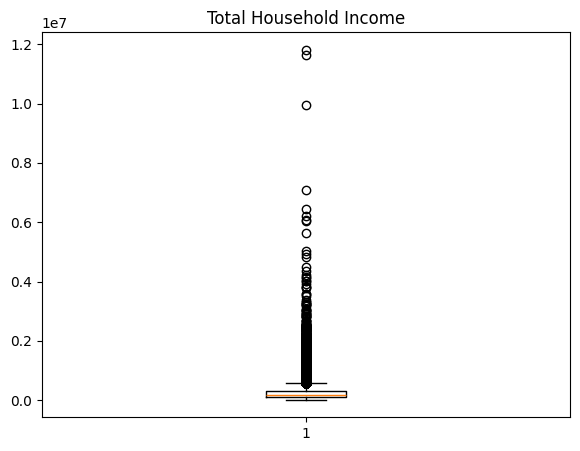

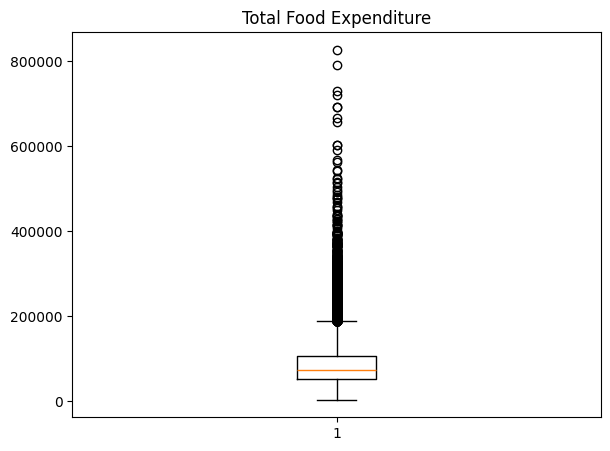

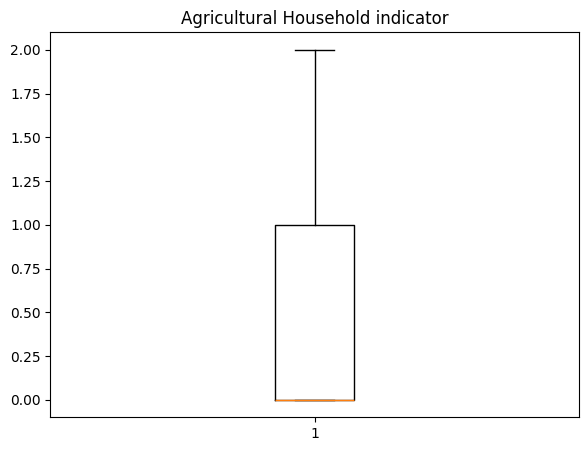

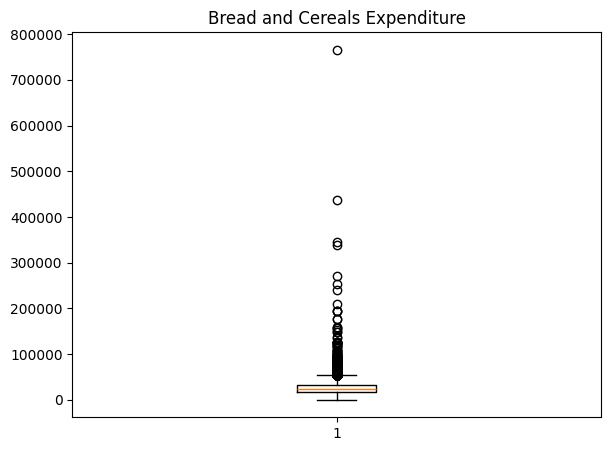

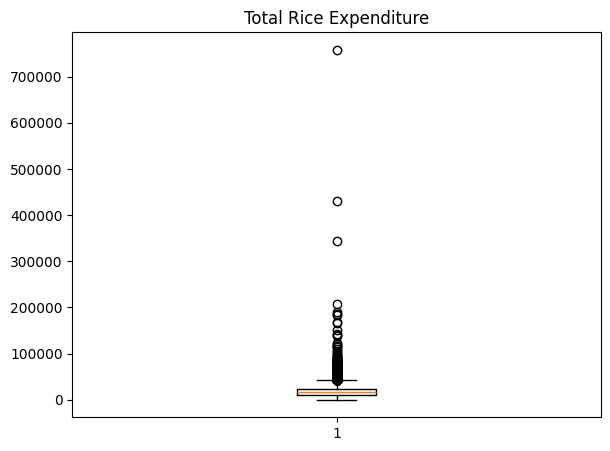

...

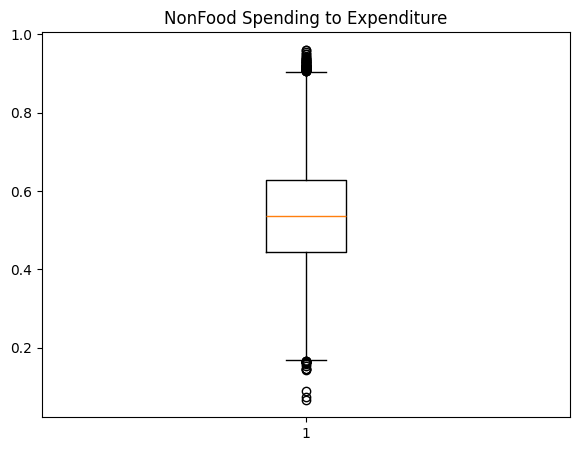

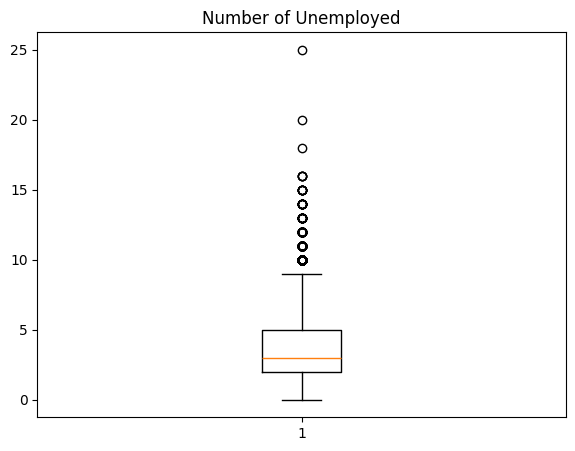

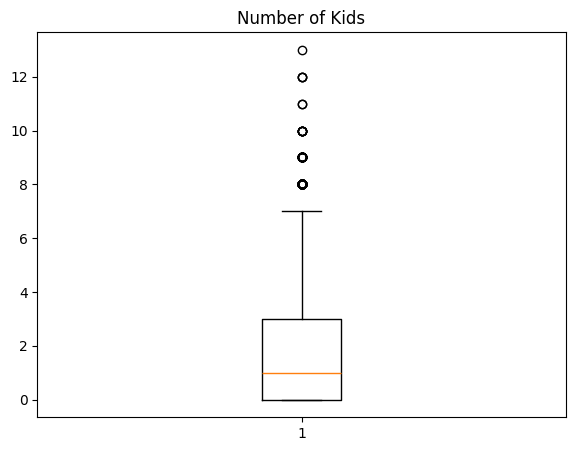

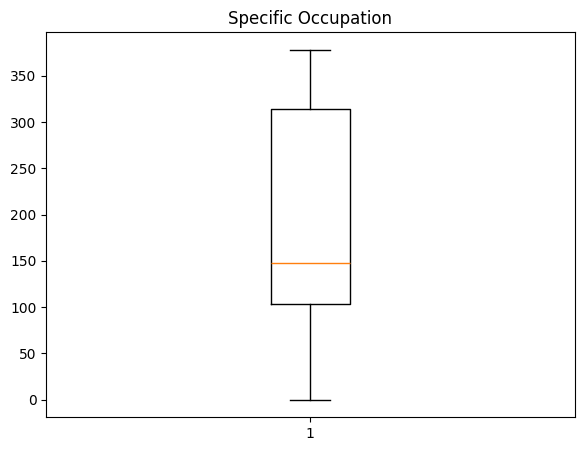

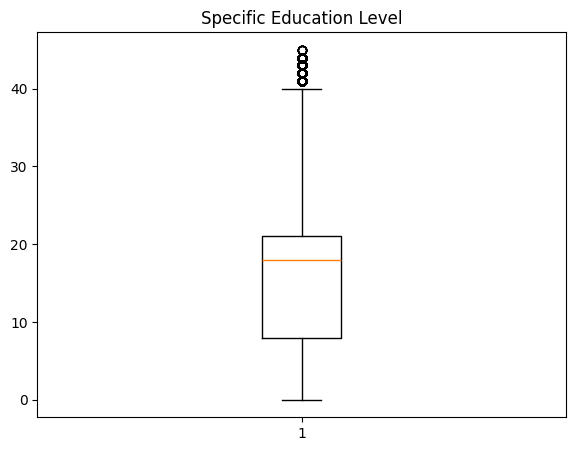

In [337]:
# Plot Numerical Features
for column in df_orig.select_dtypes(include=['int64', 'float64']):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.boxplot(df_orig[column])
    plt.title(column)

In [338]:
df_orig.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,Vegetables Expenditure,Restaurant and hotels Expenditure,...,Per Capita Expenditure,Expenditure to Income Ratio,Essential Spending to Expenditure,NonEssential Spending to Expenditure,Essential Non Food Spending to Expenditure,NonFood Spending to Expenditure,Number of Unemployed,Number of Kids,Specific Occupation,Specific Education Level
count,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,...,4.154400e+04,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000,41544.000000
mean,2.475556e+05,85099.158194,0.429858,25133.723642,18195.825005,10540.072574,10529.318337,2550.474990,5006.918568,15436.566075,...,5.355108e+04,0.975204,0.678898,0.321102,0.215942,0.537044,3.364168,1.772795,193.617273,19.061958
std,2.868805e+05,51637.947682,0.676666,13466.482984,11727.224350,10497.727757,7812.201613,2969.752879,3300.175236,23705.195929,...,5.261856e+04,0.350638,0.134195,0.134195,0.116535,0.130220,2.092840,1.652286,117.022699,11.516433
min,1.128500e+04,2947.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.686571e+03,0.084867,0.076762,0.007144,0.006500,0.067730,0.000000,0.000000,0.000000,0.000000
25%,1.048950e+05,51017.250000,0.000000,16556.000000,11020.000000,3353.750000,5504.000000,1024.750000,2873.000000,1930.000000,...,2.425281e+04,0.770356,0.598617,0.223677,0.132532,0.444559,2.000000,0.000000,103.000000,8.000000
50%,1.640795e+05,72985.500000,0.000000,23324.000000,16620.000000,7332.500000,8695.000000,1820.000000,4314.000000,7314.000000,...,3.824775e+04,0.937461,0.693762,0.306238,0.190323,0.536472,3.000000,1.000000,148.000000,18.000000
75%,2.911385e+05,105635.500000,1.000000,31439.000000,23920.000000,14292.000000,13388.000000,3100.000000,6304.250000,19921.250000,...,6.393138e+04,1.117088,0.776323,0.401383,0.271546,0.628792,5.000000,3.000000,314.000000,21.000000
max,1.181599e+07,827565.000000,2.000000,765864.000000,758326.000000,261566.000000,188208.000000,273769.000000,74800.000000,725296.000000,...,1.825732e+06,17.649014,0.992856,0.923238,0.950706,0.959981,25.000000,13.000000,378.000000,45.000000


# Outlier Detection

In [339]:
# import counter
def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [340]:
outlier_detection_column = ['Total Household Income']

In [341]:
Outliers_IQR = IQR_method(df, 0, outlier_detection_column)

Total number of outliers is: 3151


In [342]:
# Store non-outliers detected in IQR by dropping outliers from Outliers_IQR, not in place
df_non_outliers_IQR = df_copy.drop(Outliers_IQR, axis=0).reset_index(drop=True)
df_IQR_copy = df.drop(Outliers_IQR, axis=0).reset_index(drop=True)
df_IQR_copy.drop(columns = ['Specific Occupation', 'Specific Education Level'], inplace=True)

In [343]:
# Store outliers detected by keeping outliers from Outliers_IQR
df_outliers_IQR = df_copy.loc[df_copy.index.isin(Outliers_IQR)]

In [344]:
model=IsolationForest(n_estimators=200, max_samples='auto', contamination=float(0.1), max_features=1.0)
model.fit(df_copy)

IsolationForest(contamination=0.1, n_estimators=200)

In [345]:
scores=model.decision_function(df_copy)
anomaly=model.predict(df_copy)

df_copy['scores']=scores
df_copy['anomaly']=anomaly

In [346]:
anomaly = df_copy.loc[df_copy['anomaly']==-1]
anomaly_index = list(anomaly.index)
print('Total number of outliers is:', len(anomaly))

Total number of outliers is: 4155


In [347]:
# Remove anomaly and scores
df_copy.drop(['scores', 'anomaly'], axis=1, inplace=True)

In [348]:
# Store non-outliers in Iso Forest
df_non_outliers_iso_forest = df_copy.drop(anomaly_index, axis = 0).reset_index(drop=True)
df_iso_copy = df.drop(anomaly_index, axis = 0).reset_index(drop=True)
df_iso_copy.drop(columns = ['Specific Occupation', 'Specific Education Level'], inplace=True)

In [349]:
# Store outliers in Iso Forest
df_outliers_iso_forest = df_copy.loc[df_copy.index.isin(anomaly_index)]

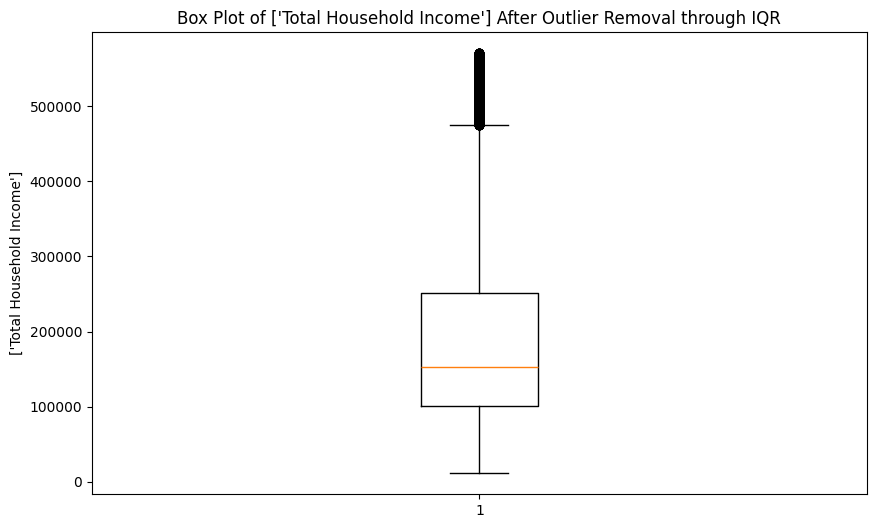

In [350]:
# Box Plot of the extracted non_outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

In [351]:
df_non_outliers_IQR['Total Household Income'].describe()

count     38393.000000
mean     189885.704556
std      120551.516456
min       11285.000000
25%      101150.000000
50%      153175.000000
75%      250795.000000
max      570492.000000
Name: Total Household Income, dtype: float64

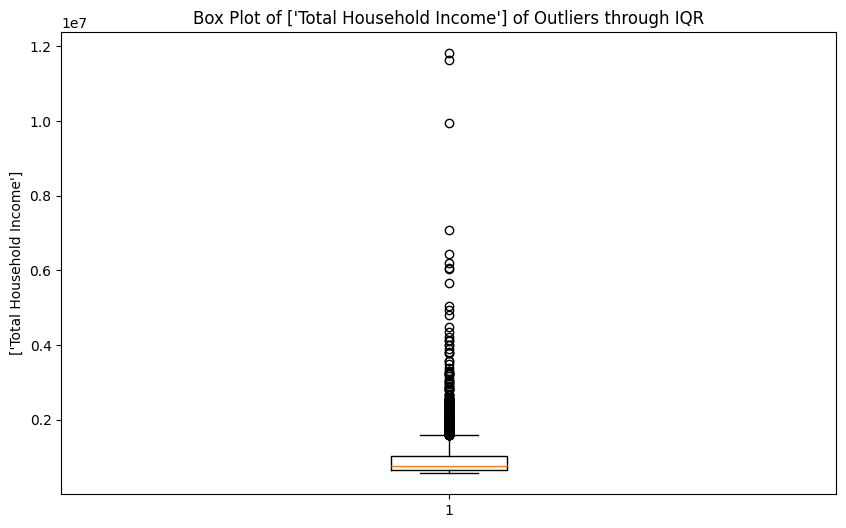

In [352]:
# Box Plot of the extracted outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

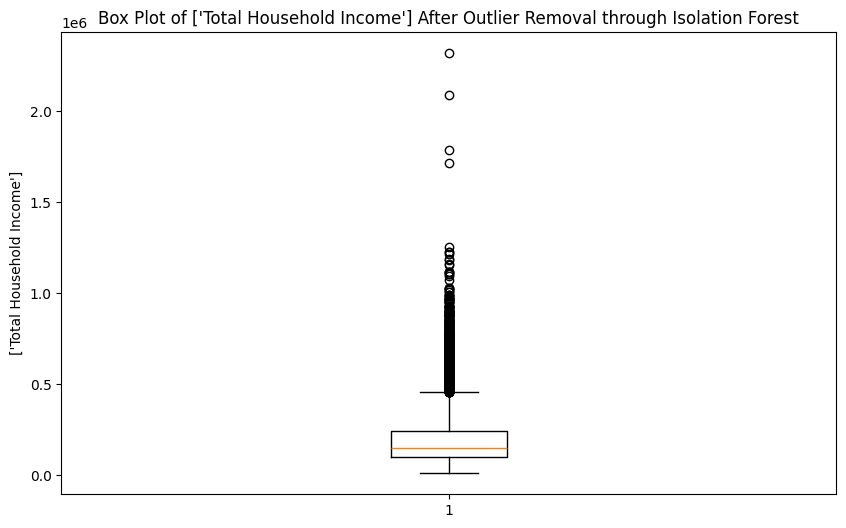

In [353]:
# Boxplot of Non_outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

In [354]:
df_non_outliers_iso_forest['Total Household Income'].describe()

count    3.738900e+04
mean     1.914969e+05
std      1.348446e+05
min      1.128500e+04
25%      1.001830e+05
50%      1.506500e+05
75%      2.440000e+05
max      2.317700e+06
Name: Total Household Income, dtype: float64

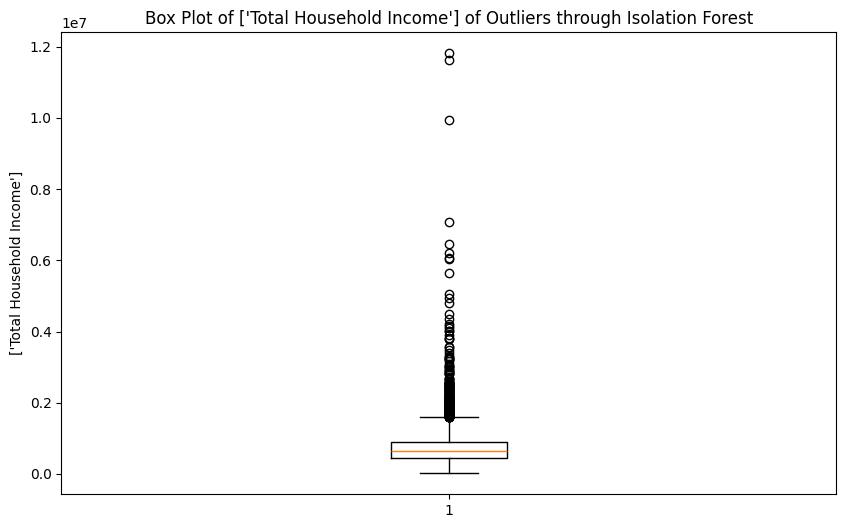

In [355]:
# Boxplot of Outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

> Key Insights from Outlier Detection
- IQR caps the income values to less than 600,000
- Isolation Forest has income values from 0 to 160,000
- IQR handles outlier better than Isolation Forest when it comes to covering more families from varying income levels that are not overly extreme.
- Final selected outlier removal step: IQR

## Data Scaling and Transformations

In [356]:
# Power Transform to Reduce Skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df_orig[numerical_columns] = pt.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = pt.fit_transform(df_non_outliers_IQR[numerical_columns])
df_non_outliers_iso_forest[numerical_columns] = pt.fit_transform(df_non_outliers_iso_forest[numerical_columns])

In [357]:
# Scale numerical Features for clustering Analysis
scaler = StandardScaler()
# scaler = MinMaxScaler()
df_orig[numerical_columns] = scaler.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = scaler.fit_transform(df_non_outliers_IQR[numerical_columns])
df_non_outliers_iso_forest[numerical_columns] = pt.fit_transform(df_non_outliers_iso_forest[numerical_columns])

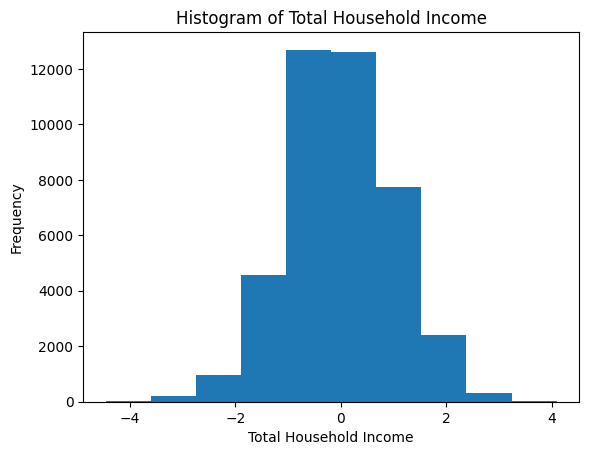

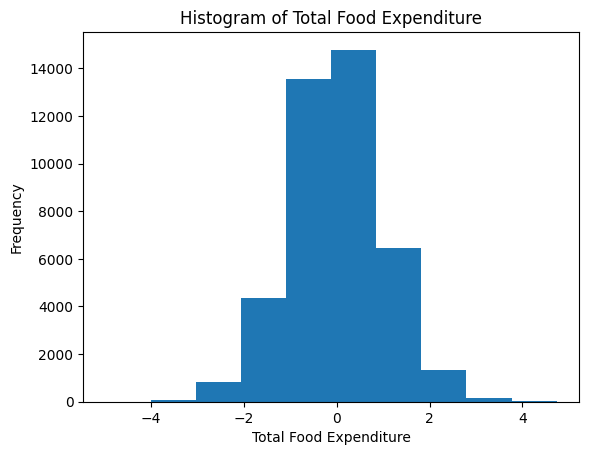

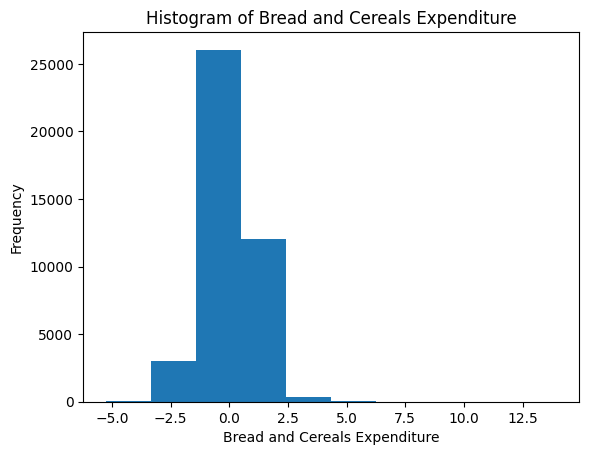

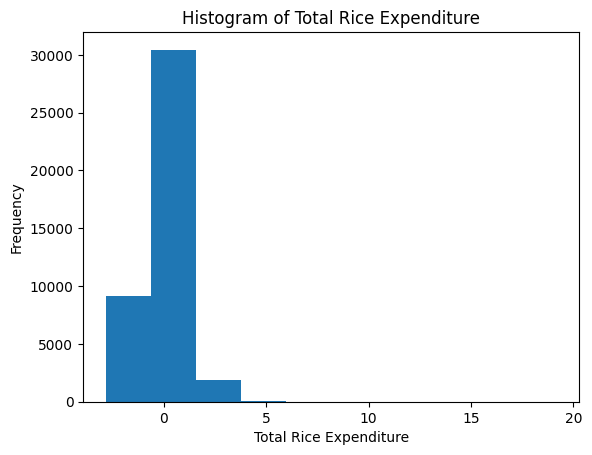

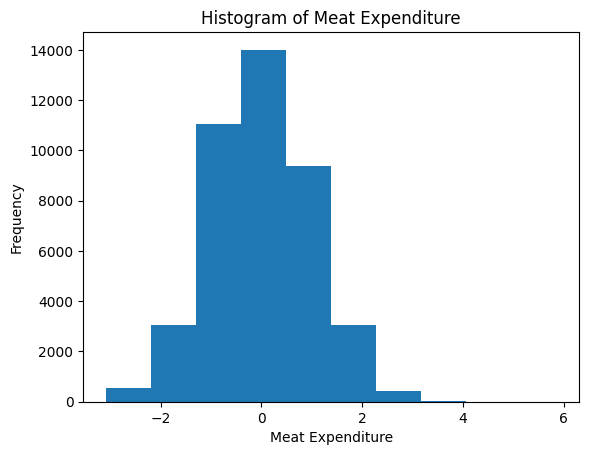

...

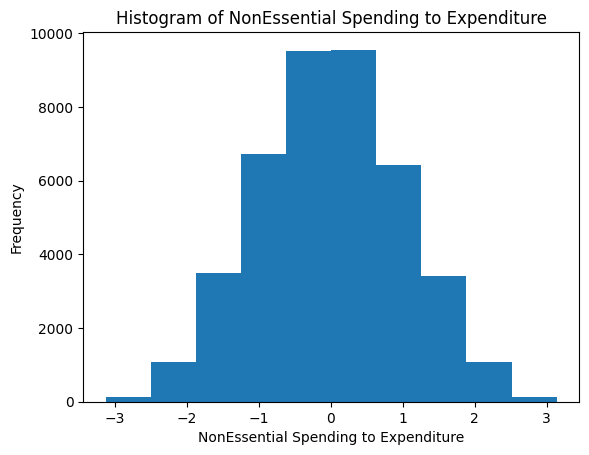

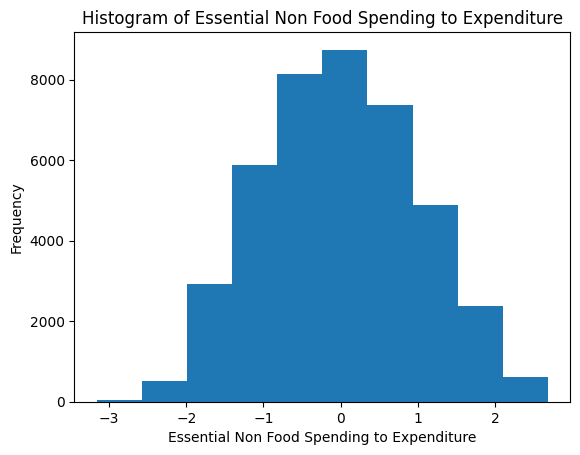

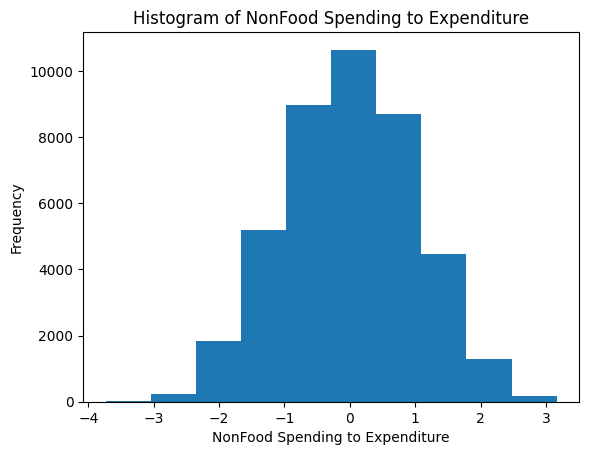

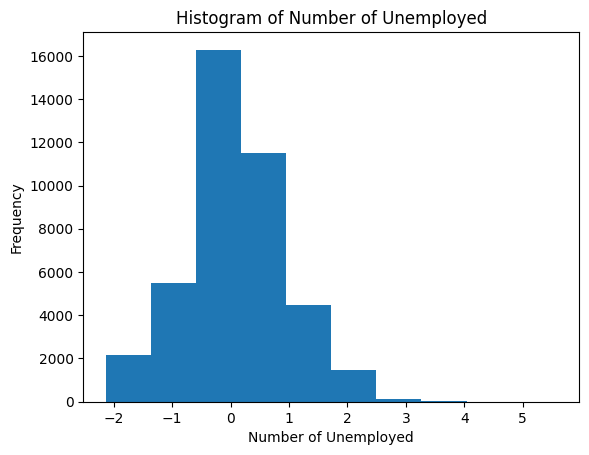

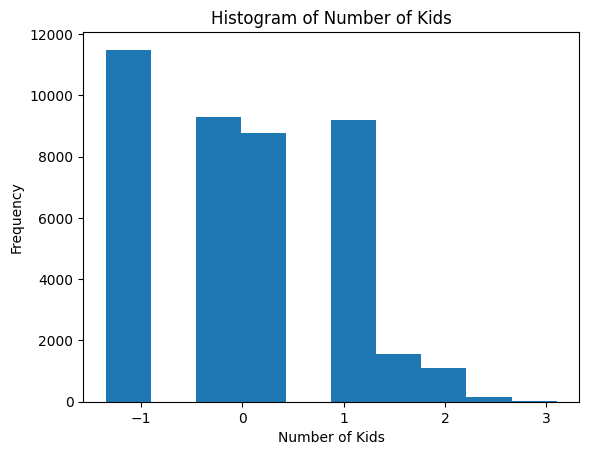

In [358]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_orig[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

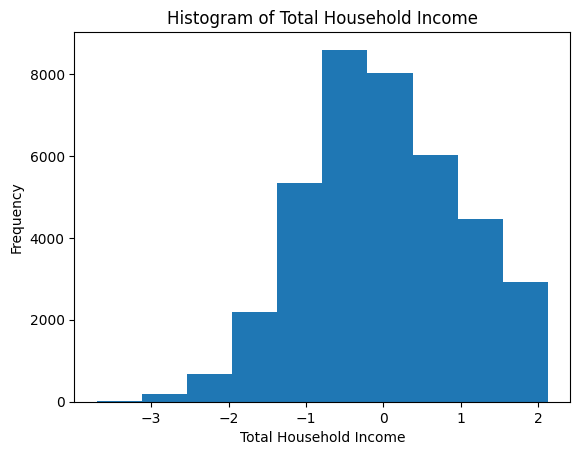

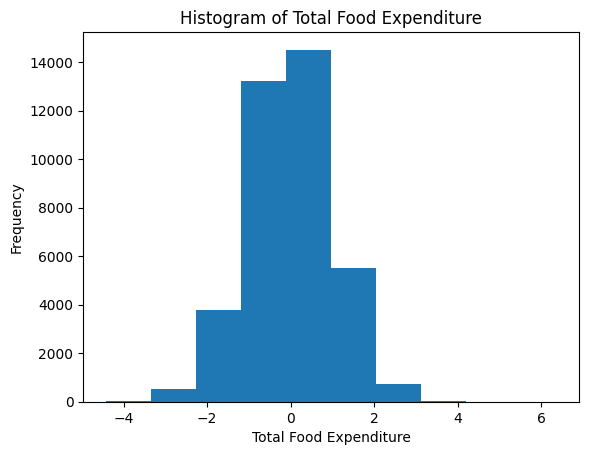

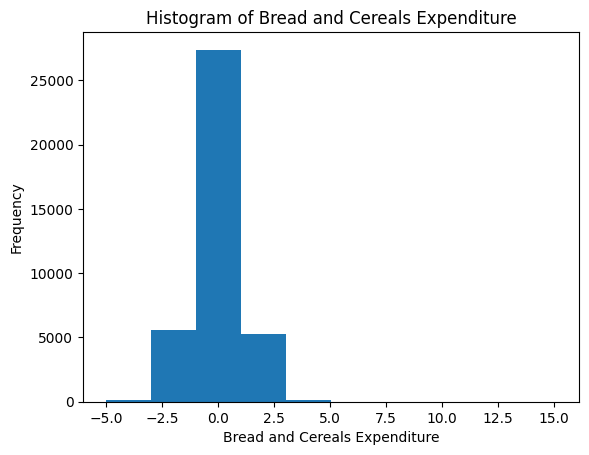

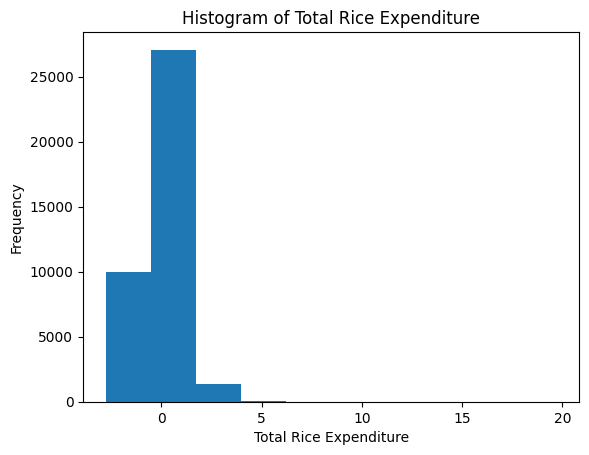

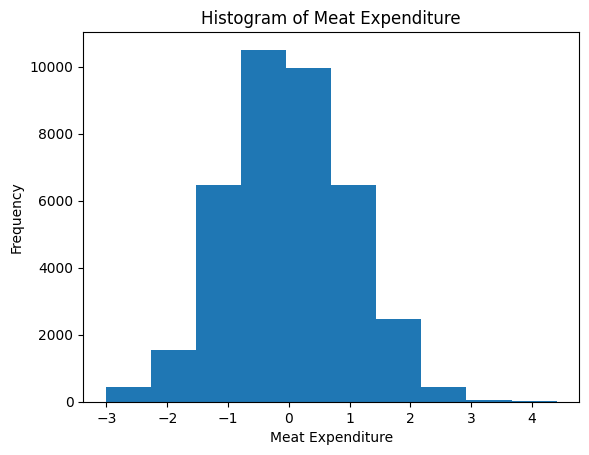

...

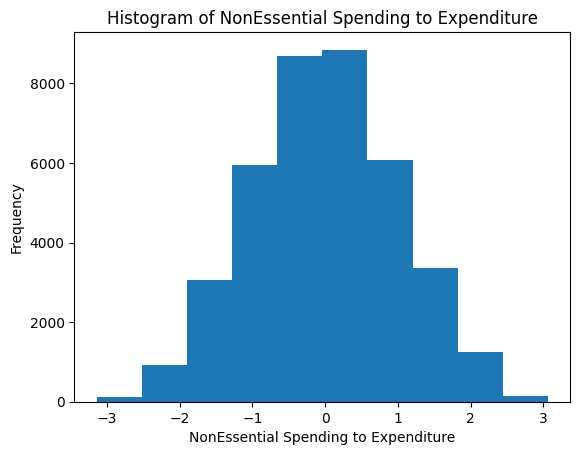

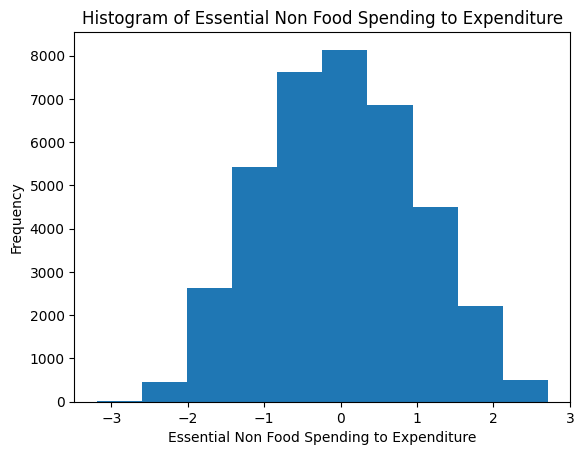

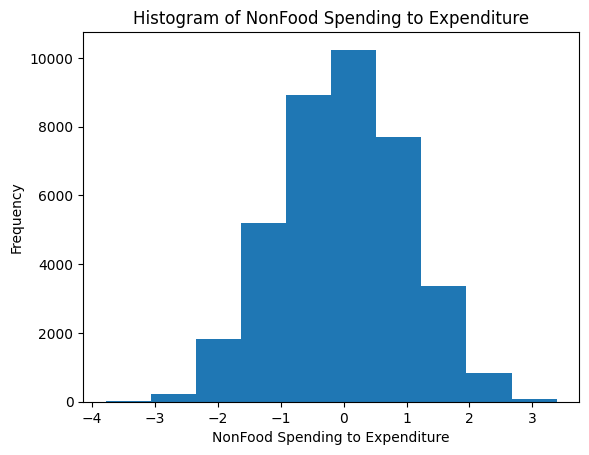

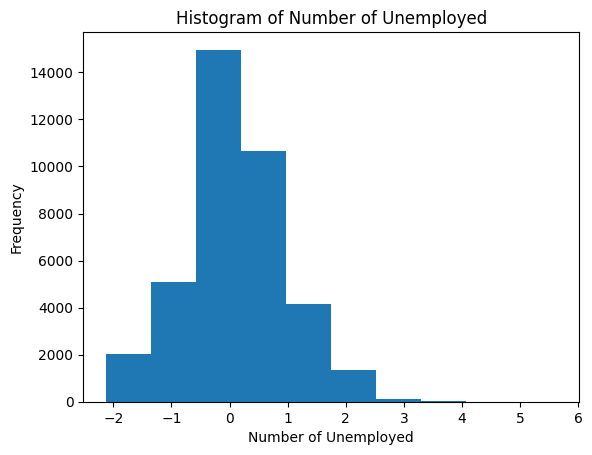

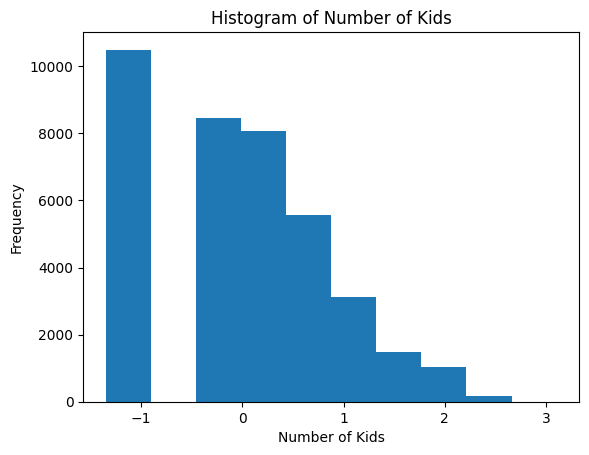

In [359]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_IQR[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [360]:
categorical_columns

Index(['Region', 'Main Source of Income', 'Household Head Sex',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker', 'Type of Household',
       'Type of Building/House', 'Type of Roof', 'Type of Walls',
       'Tenure Status', 'Toilet Facilities', 'Main Source of Water Supply'],
      dtype='object')

In [361]:
df_copy.columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Hea

In [362]:
# Fetch feature engineered cat columns. Include Binary Indicators
feature_engineered_cat_columns = ['Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Main Source of Income_Other sources of Income',
       'Main Source of Income_Wage/Salaries', 'Household Head Sex_Male',
       'Household Head Job or Business Indicator_With Job/Business',
       'Type of Household_Single Family',
       'Type of Household_Two or More Nonrelated Persons/Members']

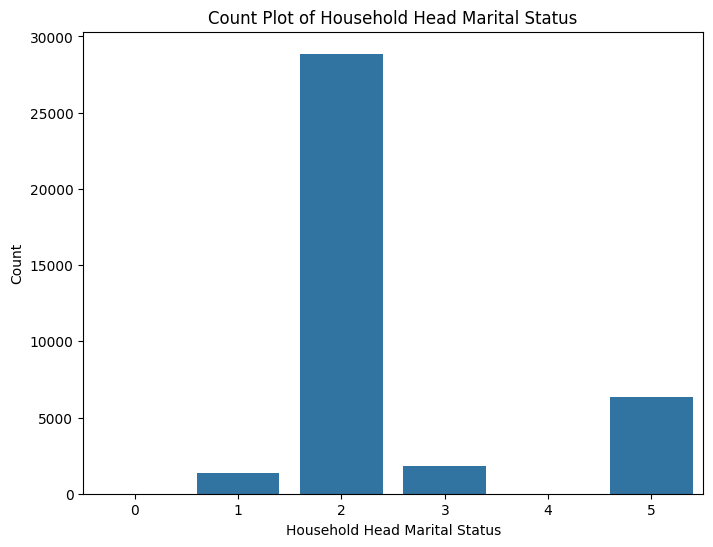

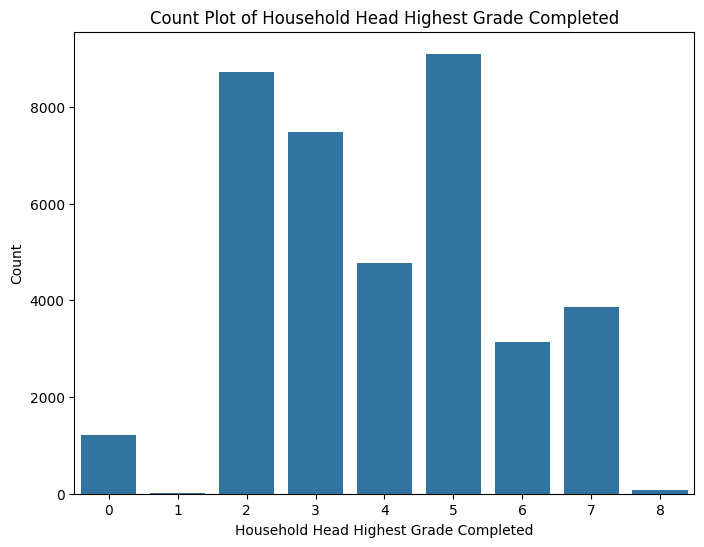

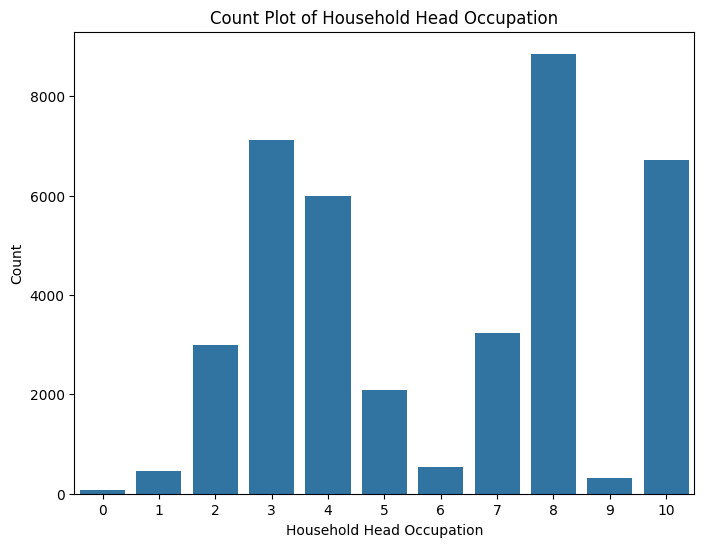

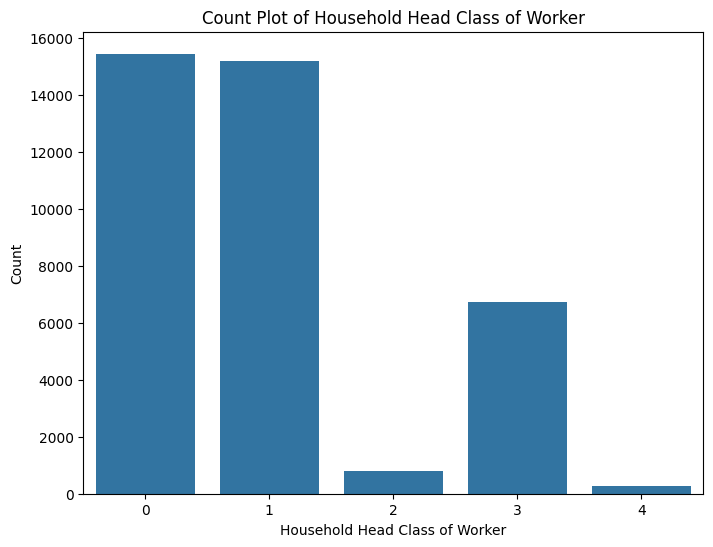

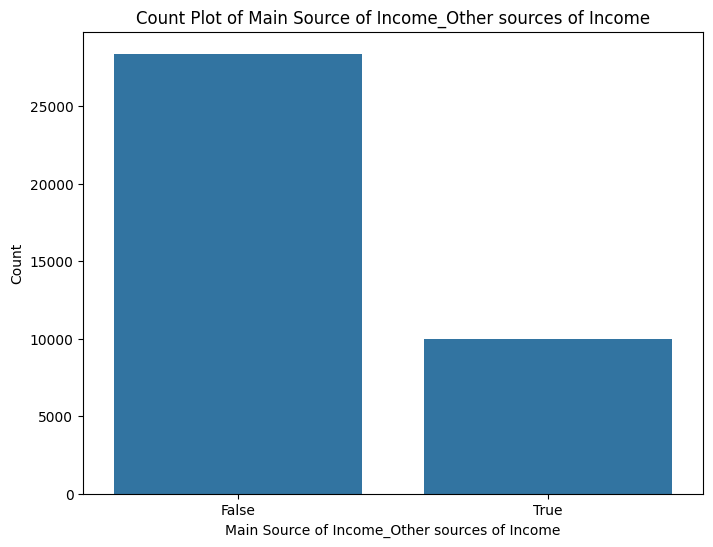

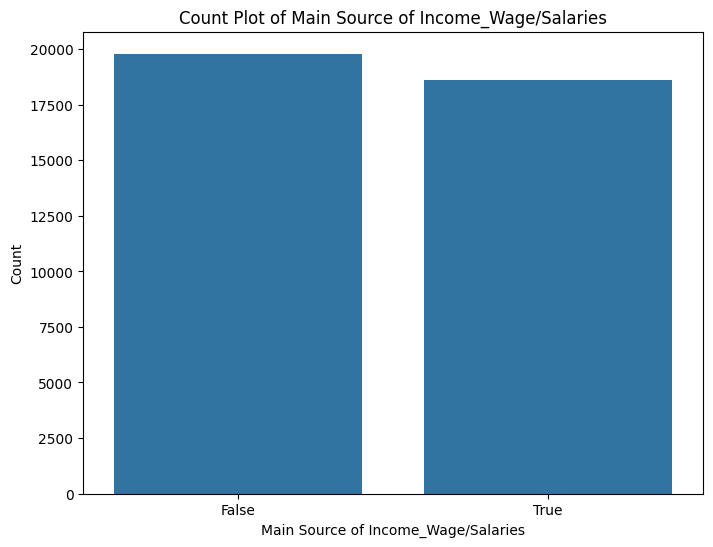

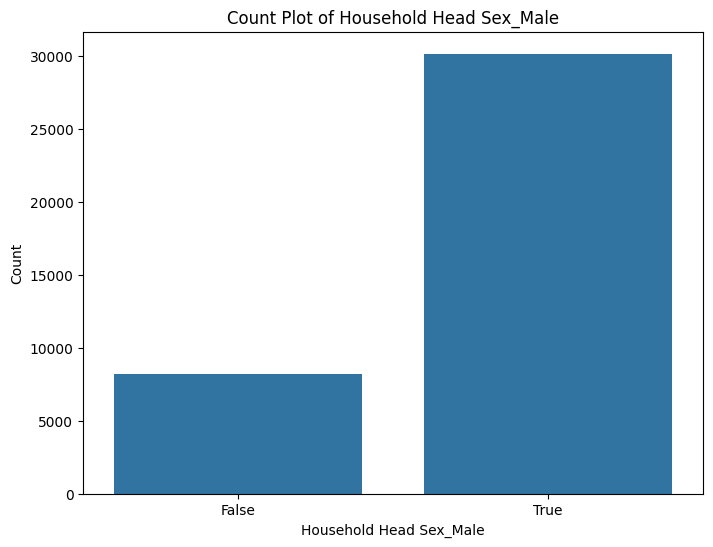

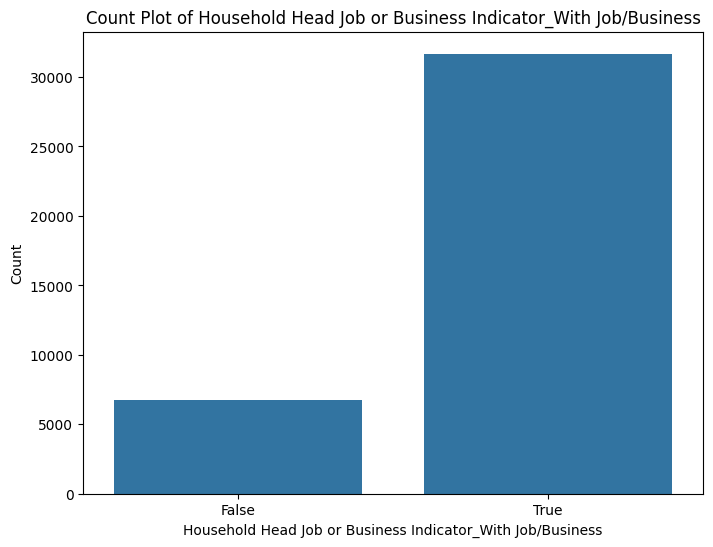

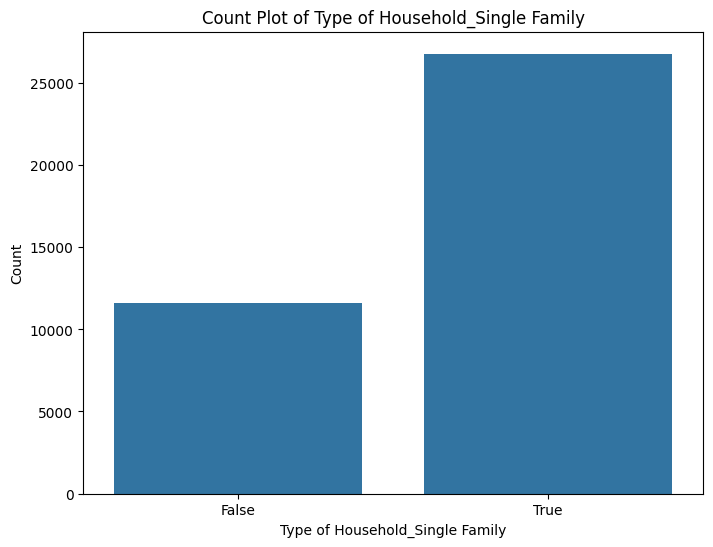

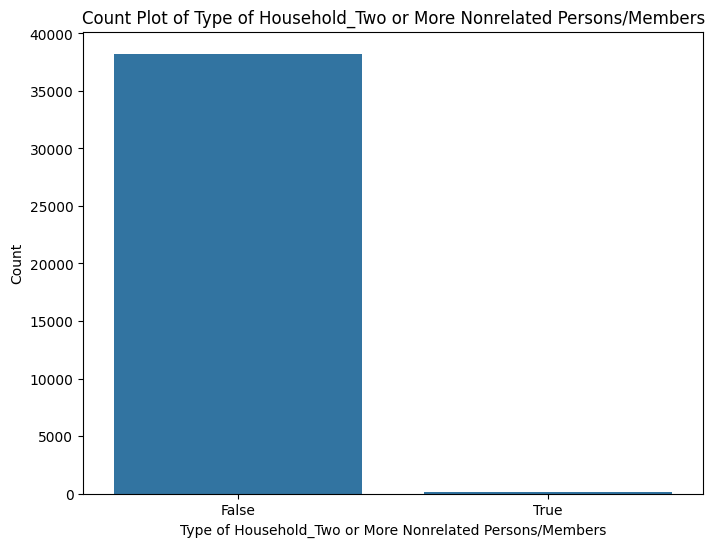

In [363]:
for col in feature_engineered_cat_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_non_outliers_IQR, x=col)
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')



> Key Insights after Feature Engineering
- Skew from some numerical columns have been transformed.
- Some numerical columns have no clear distribution or are Zero-inflated despite Yeo-Johnson Transformation. Included Categorical Binning in Feature Engineering
- Toilet Facilities, Tenure Status, Type of Walls, Type of Roof, and Main Source of Water Supply have one or two defining features that overwhelm their counterparts. Binned to a general group but could possibly be omitted


# Automated Feature Selection

Original Number of Features = 60

Original Expenditure Features = 20

Original Income Features = 2

In [364]:
selected_features_rfevc = []
selected_features_mutual_info = []
selected_features_rfr = []
number_of_features_to_check = []

In [365]:
X = df_orig.drop('Total Household Income', axis=1)
y = df_orig['Total Household Income']
X_IQR = df_non_outliers_IQR.drop('Total Household Income', axis=1)
y_IQR = df_non_outliers_IQR['Total Household Income']
X_iso = df_non_outliers_iso_forest.drop('Total Household Income', axis=1)
y_iso = df_non_outliers_iso_forest['Total Household Income']

In [366]:
X.drop(columns = ['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total_Essential_NonFood_Spending',
       'Total_NonFood_Spending', 'Total Expenditure'], inplace=True)
X_IQR.drop(columns = ['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total_Essential_NonFood_Spending',
       'Total_NonFood_Spending',  'Total Expenditure'], inplace=True)
X_iso.drop(columns = ['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total_Essential_NonFood_Spending',
       'Total_NonFood_Spending', 'Total Expenditure'], inplace=True)

In [367]:
# Use Regression Model for Feature Selection
def rfevc_features_selected(X, y, features_to_select):
  print(f'Test DF')
  min_features_to_select = features_to_select  # Minimum number of features to consider
  clf = Ridge()
  cv = KFold(5) # Changed to KFold which is suitable for regression

  rfecv = RFECV(
      estimator=clf,
      step=1,
      cv=cv,
      scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
      min_features_to_select=min_features_to_select,
      n_jobs=2,
  )
  rfecv.fit(X, y)
  selected_inc_features = X.columns[rfecv.support_]
  selected_features_rfevc.append(selected_inc_features)
  print(f"Optimal number of features: {rfecv.n_features_}")
  number_of_features_to_check.append(rfecv.n_features_)
  min_features_to_select = rfecv.n_features_ + 1

In [368]:
rfevc_features_selected(X, y, 5)
rfevc_features_selected(X_IQR, y_IQR, 5)
rfevc_features_selected(X_iso, y_iso, 5)

Test DF
Optimal number of features: 52
Test DF
Optimal number of features: 50
Test DF
Optimal number of features: 45


In [369]:
number_of_features_to_check

[np.int64(52), np.int64(50), np.int64(45)]

In [370]:
def mutual_info_features_selected(X, y, number_of_features):
  print(f"Number of Features to Check: {number_of_features}")
  threshold = number_of_features  # the number of most relevant features
  high_score_features = []
  feature_scores = mutual_info_regression(X, y, random_state=0)
  for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
    high_score_features.append(f_name)
  selected_df = X[high_score_features]
  selected_features_mutual_info.append(selected_df.columns)

In [371]:
print('Original Data')
mutual_info_features_selected(X, y, number_of_features_to_check[0])
print("- " * 20)
print('Non-Outlier Data - IQR')
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - Isolation Forest')
mutual_info_features_selected(X_iso, y_iso, number_of_features_to_check[2])

Original Data
Number of Features to Check: 52
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
Number of Features to Check: 50
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - Isolation Forest
Number of Features to Check: 45


In [372]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

model_rf = RandomForestRegressor(random_state=42)
'''
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
}

grid_search = GridSearchCV(
    estimator=model_rf,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available CPU cores
    verbose=2
)

grid_search.fit(X, y)
print(grid_search.best_params_)'''

"\nparam_grid = {\n    'n_estimators': [100, 200, 500],\n    'max_depth': [None, 10, 20],\n    'min_samples_split': [2, 5],\n    'min_samples_leaf': [1, 2],\n}\n\ngrid_search = GridSearchCV(\n    estimator=model_rf,\n    param_grid=param_grid,\n    cv=5,  # 5-fold cross-validation\n    n_jobs=-1,  # Use all available CPU cores\n    verbose=2\n)\n\ngrid_search.fit(X, y)\nprint(grid_search.best_params_)"

In [373]:
# print(grid_search.best_params_)

In [374]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X, y)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X.iloc[:, sel_sfm_index]
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Remaining_Income',
       'Per Capita Income'],
      dtype='object')


In [375]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 4.192497357848628e-05
Root Mean Squared Error: 0.006474949696985011
R-squared: 0.9999580750264215


In [376]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X_IQR, y_IQR)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X_IQR.iloc[:, sel_sfm_index]
# Include Total Household Income
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Per Capita Income'], dtype='object')


In [377]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X_IQR)
mse = mean_squared_error(y_IQR, y_pred)
r2 = r2_score(y_IQR, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 2.5693627734815906e-05
Root Mean Squared Error: 0.005068888214866837
R-squared: 0.9999743063722651


In [378]:
model_rf = RandomForestRegressor(max_depth= None, min_samples_leaf = 1, min_samples_split = 2, n_estimators=  100)
model_rf.fit(X_iso, y_iso)

sel_sfm = SelectFromModel(model_rf, prefit=True)
sel_sfm_index = sel_sfm.get_support()
selected_rfe_features = X_iso.iloc[:, sel_sfm_index]
print(selected_rfe_features.columns)
selected_features_rfr.append(selected_rfe_features.columns)

Index(['Total Number of Family members', 'Remaining_Income',
       'Savings to Income Ratio', 'Per Capita Income'],
      dtype='object')


In [379]:
# Check accuracy of model
from sklearn.metrics import mean_squared_error, r2_score

y_pred = model_rf.predict(X_iso)
mse = mean_squared_error(y_iso, y_pred)
r2 = r2_score(y_iso, y_pred)

print("Mean Squared Error:", mse)
rmse = mse ** 0.5
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)

Mean Squared Error: 4.2363376827226873e-05
Root Mean Squared Error: 0.006508715451394912
R-squared: 0.9999576366231727


In [380]:

# Check for intersection of columns extracted for rfevc, skb, and mutual_info
print(set(selected_features_rfevc[0]) & set(selected_features_mutual_info[0]))

{'NonEssential Spending to Expenditure', 'Debt to Income Ratio', 'Savings to Income Ratio', 'Transportation Ratio', 'Communication Ratio', 'Agricultural Household indicator', 'Household Head Sex_Male', 'Essential Spending to Expenditure', 'Expenditure to Income Ratio', 'Total Income from Entrepreneurial Acitivites', 'Household Head Class of Worker', 'Restaurant and hotels Ratio', 'Education Ratio', 'Main Source of Income_Wage/Salaries', 'Total number of family members employed', 'Household Head Occupation', 'Main Source of Income_Other sources of Income', 'Members with age 5 - 17 years old', 'Tobacco Ratio', 'Essential Non Food Spending to Expenditure', 'Household Head Marital Status', 'NonFood Spending to Expenditure', 'Bread and Cereals Ratio', 'Clothing and Footwear Ratio', 'Per Capita Expenditure', 'Remaining_Income', 'Number of Unemployed', 'Fruit Ratio', 'Crop Farming and Gardening Ratio', 'Alcoholic Beverages Ratio', 'Household Head Job or Business Indicator_With Job/Business', 

In [381]:
common_features_rfevc_mutual_info = []

In [382]:
for i in range(len(selected_features_rfevc)):
  print(set(selected_features_rfevc[i]) & set(selected_features_mutual_info[i]))
  common_features_rfevc_mutual_info.append(set(selected_features_rfevc[i]) & set(selected_features_mutual_info[i]))

{'NonEssential Spending to Expenditure', 'Debt to Income Ratio', 'Savings to Income Ratio', 'Transportation Ratio', 'Communication Ratio', 'Agricultural Household indicator', 'Household Head Sex_Male', 'Essential Spending to Expenditure', 'Expenditure to Income Ratio', 'Total Income from Entrepreneurial Acitivites', 'Household Head Class of Worker', 'Restaurant and hotels Ratio', 'Education Ratio', 'Main Source of Income_Wage/Salaries', 'Total number of family members employed', 'Household Head Occupation', 'Main Source of Income_Other sources of Income', 'Members with age 5 - 17 years old', 'Tobacco Ratio', 'Essential Non Food Spending to Expenditure', 'Household Head Marital Status', 'NonFood Spending to Expenditure', 'Bread and Cereals Ratio', 'Clothing and Footwear Ratio', 'Per Capita Expenditure', 'Remaining_Income', 'Number of Unemployed', 'Fruit Ratio', 'Crop Farming and Gardening Ratio', 'Alcoholic Beverages Ratio', 'Household Head Job or Business Indicator_With Job/Business', 

In [383]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_mutual_info)):
  print(len(common_features_rfevc_mutual_info[i]))

51
47
37


In [384]:
df_orig_feature_rfevc = df_orig[list(selected_features_rfevc[0])]
df_orig_feature_rfr = df_orig[list(selected_features_rfr[0])]
df_orig_feature_mutual_info = df_orig[list(selected_features_mutual_info[0])]

df_non_outliers_IQR_feature_rfevc = df_non_outliers_IQR[list(selected_features_rfevc[1])]
df_non_outliers_IQR_feature_rfr = df_non_outliers_IQR[list(selected_features_rfr[1])]
df_non_outliers_IQR_feature_mutual_info = df_non_outliers_IQR[list(selected_features_mutual_info[1])]

df_non_outliers_iso_forest_feature_rfevc = df_non_outliers_iso_forest[list(selected_features_rfevc[2])]
df_non_outliers_iso_forest_feature_rfr = df_non_outliers_iso_forest[list(selected_features_rfr[2])]
df_non_outliers_iso_forest_feature_mutual_info = df_non_outliers_iso_forest[list(selected_features_mutual_info[2])]

In [385]:
number_of_features_to_check

[np.int64(52), np.int64(50), np.int64(45)]

In [386]:
df_orig_combined = df_orig[list(common_features_rfevc_mutual_info[0])]
df_non_outliers_IQR_combined = df_non_outliers_IQR[list(common_features_rfevc_mutual_info[1])]
df_non_outliers_iso_forest_combined = df_non_outliers_iso_forest[list(common_features_rfevc_mutual_info[2])]

In [387]:
df_list_no_pca = [df_orig, df_non_outliers_IQR, df_non_outliers_iso_forest,
                  df_orig_feature_rfevc, df_orig_feature_rfr, df_orig_feature_mutual_info,
                  df_non_outliers_IQR_feature_rfevc, df_non_outliers_IQR_feature_rfr, df_non_outliers_IQR_feature_mutual_info,
                  df_non_outliers_iso_forest_feature_rfevc, df_non_outliers_iso_forest_feature_rfr, df_non_outliers_iso_forest_feature_mutual_info,
                  df_orig_combined,
                  df_non_outliers_IQR_combined, df_non_outliers_iso_forest_combined,
                  ]

In [388]:
df_orig_pca = df_orig.copy()
df_non_outliers_IQR_pca = df_non_outliers_IQR.copy()
df_non_outliers_iso_forest_pca = df_non_outliers_iso_forest.copy()

df_orig_feature_rfevc_pca = df_orig_feature_rfevc.copy()
df_orig_feature_rfr_pca = df_orig_feature_rfr.copy()
df_orig_feature_mutual_info_pca = df_orig_feature_mutual_info.copy()

df_non_outliers_IQR_feature_rfevc_pca = df_non_outliers_IQR_feature_rfevc.copy()
df_non_outliers_IQR_feature_rfr_pca = df_non_outliers_IQR_feature_rfr.copy()
df_non_outliers_IQR_feature_mutual_info_pca = df_non_outliers_IQR_feature_mutual_info.copy()

df_non_outliers_iso_forest_feature_rfevc_pca = df_non_outliers_iso_forest_feature_rfevc.copy()
df_non_outliers_iso_forest_feature_rfr_pca = df_non_outliers_iso_forest_feature_rfr.copy()
df_non_outliers_iso_forest_feature_mutual_info_pca = df_non_outliers_iso_forest_feature_mutual_info.copy()

df_orig_combined_pca = df_orig_combined.copy()
df_non_outliers_IQR_combined_pca = df_non_outliers_IQR_combined.copy()
df_non_outliers_iso_forest_combined_pca = df_non_outliers_iso_forest_combined.copy()

In [389]:
df_list_with_pca = [df_orig_pca, df_non_outliers_IQR_pca, df_non_outliers_iso_forest_pca,
                  df_orig_feature_rfevc_pca, df_orig_feature_rfr_pca, df_orig_feature_mutual_info_pca,
                  df_non_outliers_IQR_feature_rfevc_pca, df_non_outliers_IQR_feature_rfr_pca, df_non_outliers_IQR_feature_mutual_info_pca,
                  df_non_outliers_iso_forest_feature_rfevc_pca, df_non_outliers_iso_forest_feature_rfr_pca, df_non_outliers_iso_forest_feature_mutual_info_pca,
                  df_orig_combined_pca,
                  df_non_outliers_IQR_combined_pca,  df_non_outliers_iso_forest_combined_pca]

In [390]:
len(df_list_no_pca)

15

In [391]:
len(df_list_with_pca)

15

# Dimensionality Reduction

In [392]:
# Use PCA
from sklearn.decomposition import PCA

def conduct_PCA(df, index_of_df):
  print(f"PCA for DataFrame at {index_of_df}")
  pca = PCA(n_components=df.shape[1])
  df_pca = pca.fit_transform(df)
  cumsum = np.cumsum(pca.explained_variance_ratio_)
  print(cumsum)
  d = np.argmax(cumsum >= 0.90) + 1
  print("dimension : ", d)

  explained_variance = pca.explained_variance_ratio_
  cumulative_variance = np.cumsum(explained_variance)
  plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title(f'Scree Plot for DataFrame at {index_of_df}')
  plt.show()

  #If d = 1 and cumulative_variance > 90, train final PCA with 2, else if cumulative variance < 90, use d
  if d == 1 and cumulative_variance[-1] > 0.90:
    pca = PCA(n_components=2)
  elif cumulative_variance[-1] < 0.90:
    pca = PCA(n_components=24)
  else:
    pca = PCA(n_components=d)
  df_pca = pca.fit_transform(df)
  df_list_with_pca[index_of_df] = df_pca

PCA for DataFrame at 0
[0.98485936 0.9944183  0.99571493 0.99632891 0.99681701 0.99715972
 0.99740518 0.99762209 0.99781871 0.99800222 0.99815168 0.99828894
 0.99842104 0.9985304  0.99863894 0.99873797 0.99883523 0.99892872
 0.99902087 0.99911005 0.99919102 0.99926551 0.99933796 0.99940339
 0.9994636  0.99951884 0.99957188 0.99962124 0.99966412 0.99970558
 0.99973592 0.99976502 0.99979221 0.999818   0.9998417  0.99986197
 0.99987722 0.99989208 0.9999031  0.9999131  0.99992092 0.99992774
 0.99993433 0.99994056 0.99994662 0.99995237 0.99995789 0.99996188
 0.99996532 0.99996867 0.99997163 0.99997441 0.99997701 0.99997957
 0.99998189 0.99998415 0.99998633 0.99998809 0.99998977 0.99999121
 0.99999243 0.99999359 0.99999465 0.99999553 0.99999634 0.99999708
 0.99999766 0.99999817 0.9999985  0.99999882 0.99999911 0.99999939
 0.99999959 0.99999975 0.99999985 0.99999991 0.99999996 1.
 1.         1.        ]
dimension :  1


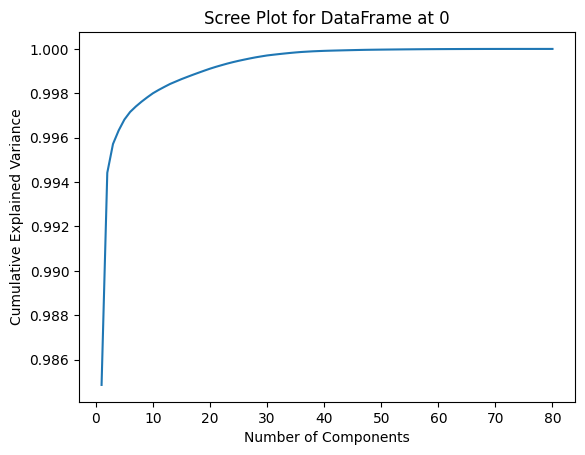

PCA for DataFrame at 1
[0.98524683 0.99441989 0.99555879 0.99621443 0.99672737 0.99707659
 0.99732794 0.99754905 0.99775284 0.99794449 0.998097   0.99823962
 0.99837717 0.99849131 0.99860463 0.99870788 0.99880929 0.99890557
 0.9990011  0.99909383 0.99917668 0.99925321 0.99932759 0.99939815
 0.99946082 0.99952118 0.99957575 0.99962506 0.99966853 0.99971149
 0.99974135 0.99976949 0.99979607 0.99982179 0.99984528 0.99986556
 0.99988187 0.99989655 0.99990743 0.99991728 0.99992468 0.99993132
 0.99993772 0.99994385 0.99994972 0.99995541 0.99996079 0.99996446
 0.99996785 0.99997079 0.99997361 0.9999762  0.9999786  0.99998083
 0.99998302 0.99998502 0.99998695 0.99998863 0.99999005 0.99999146
 0.99999266 0.9999938  0.99999489 0.99999581 0.99999659 0.99999727
 0.99999777 0.99999822 0.99999864 0.99999896 0.99999924 0.99999951
 0.99999973 0.99999982 0.99999989 0.99999994 0.99999997 1.
 1.         1.        ]
dimension :  1


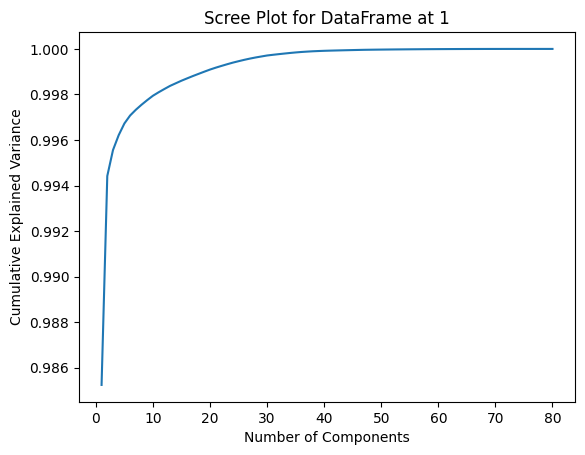

PCA for DataFrame at 2
[0.98508424 0.99435346 0.9955477  0.99619215 0.99670099 0.9970546
 0.99730983 0.99753087 0.99773907 0.99793455 0.99808781 0.99823391
 0.99837643 0.99849348 0.99860928 0.99871361 0.99881762 0.99891673
 0.99901392 0.99910809 0.99919112 0.9992688  0.99934556 0.99941647
 0.99947979 0.99954037 0.99959548 0.99964499 0.99968905 0.99973242
 0.99976529 0.99979396 0.99982165 0.99984814 0.99987129 0.99989133
 0.99990616 0.99991765 0.99992848 0.99993794 0.99994493 0.99995124
 0.99995524 0.99995883 0.99996213 0.99996529 0.99996821 0.99997106
 0.9999735  0.99997577 0.99997796 0.99998003 0.99998208 0.99998393
 0.99998566 0.99998727 0.99998881 0.99999028 0.99999149 0.99999268
 0.99999368 0.99999462 0.9999955  0.99999624 0.99999686 0.99999742
 0.99999791 0.99999833 0.99999868 0.999999   0.99999925 0.99999949
 0.99999972 0.99999982 0.99999989 0.99999994 0.99999997 1.
 1.         1.        ]
dimension :  1


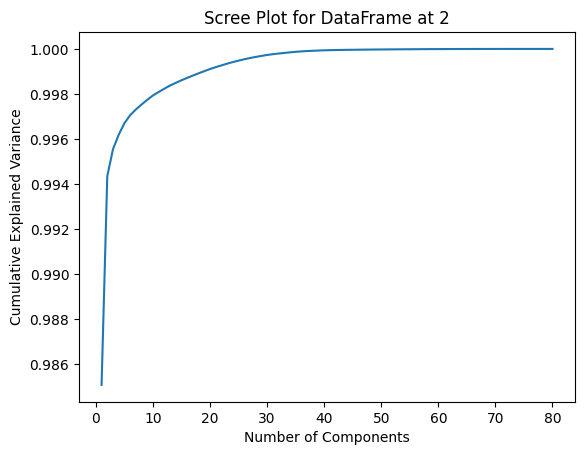

PCA for DataFrame at 3
[0.70766949 0.75653347 0.80391798 0.83226149 0.85362312 0.86902064
 0.88167695 0.89120143 0.89936038 0.90684274 0.91401825 0.92022019
 0.92623753 0.93191778 0.93712002 0.94200455 0.94668365 0.95113906
 0.95534842 0.95933688 0.96305899 0.96654919 0.96990008 0.97321962
 0.97631362 0.97924452 0.98197254 0.98418157 0.98636856 0.98825775
 0.9899399  0.99153475 0.99289408 0.99411156 0.99518233 0.99621324
 0.99710164 0.99786526 0.99835058 0.9987971  0.99908946 0.99934463
 0.99954374 0.99967551 0.99978467 0.99987694 0.99994521 0.99997028
 0.99999134 0.99999953 0.99999995 1.        ]
dimension :  10


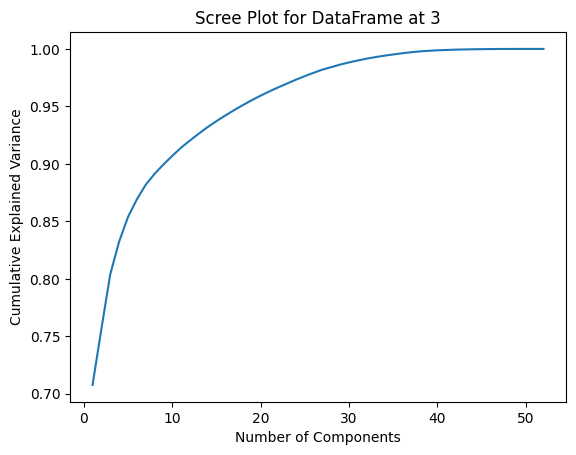

PCA for DataFrame at 4
[0.5461035  0.87403834 1.        ]
dimension :  3


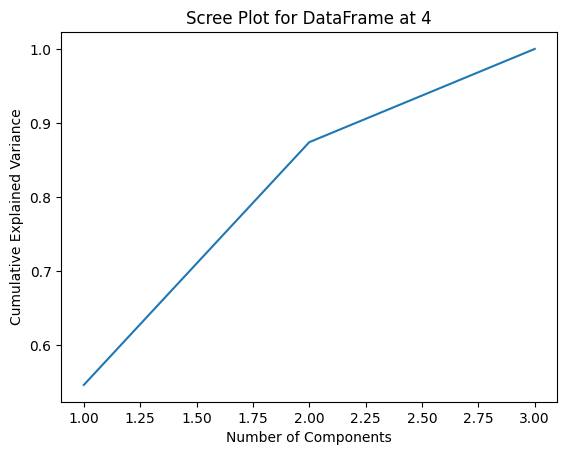

PCA for DataFrame at 5
[0.98675875 0.99632595 0.99696706 0.99739908 0.99776861 0.99804017
 0.99824019 0.99840569 0.99853447 0.99864468 0.99874448 0.99884046
 0.99892434 0.99900564 0.99908241 0.99915277 0.99921876 0.99928172
 0.99934192 0.99939879 0.99945257 0.99950264 0.99954981 0.99959485
 0.99963968 0.99968148 0.99972038 0.99975723 0.99978687 0.99981605
 0.99984159 0.99986433 0.99988588 0.99990426 0.99992072 0.99993519
 0.99994913 0.99996112 0.99997145 0.99997801 0.99998405 0.999988
 0.99999145 0.99999414 0.99999592 0.9999974  0.99999862 0.99999954
 0.99999988 0.99999999 1.         1.        ]
dimension :  1


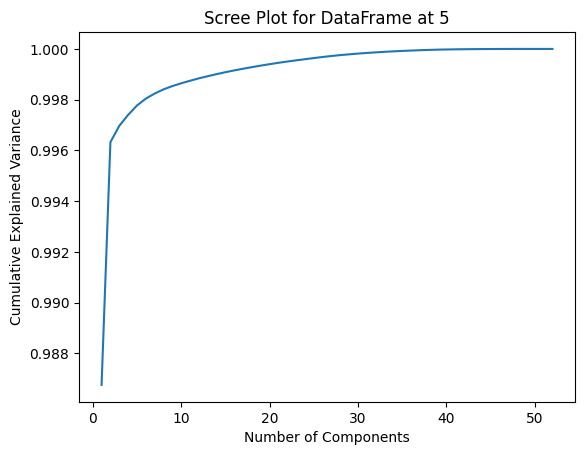

PCA for DataFrame at 6
[0.17718973 0.29770179 0.3950149  0.45671208 0.508827   0.55258604
 0.58676535 0.61731878 0.6475398  0.67285044 0.69729471 0.720534
 0.74189868 0.7617022  0.78117075 0.7993422  0.81697622 0.83311878
 0.84882915 0.86360561 0.87772725 0.89118553 0.90418967 0.91680575
 0.92804156 0.93684885 0.94538228 0.95271588 0.95950171 0.96605333
 0.97147186 0.97630647 0.98067481 0.98488744 0.98844267 0.99144236
 0.99332734 0.99508515 0.99629623 0.99732383 0.99808325 0.99863042
 0.99915091 0.99957564 0.99983196 0.99991158 0.99997701 0.99999811
 0.99999986 1.        ]
dimension :  23


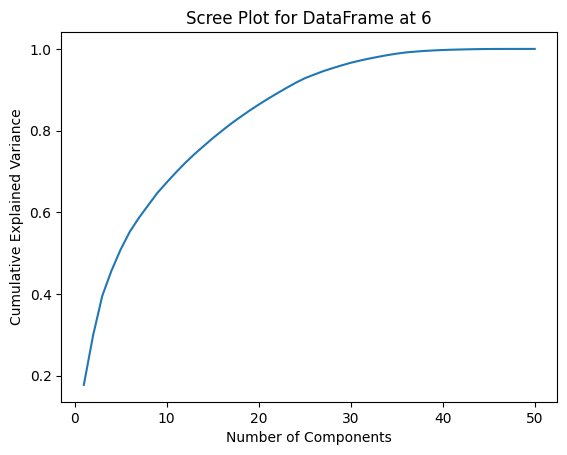

PCA for DataFrame at 7
[0.75363628 1.        ]
dimension :  2


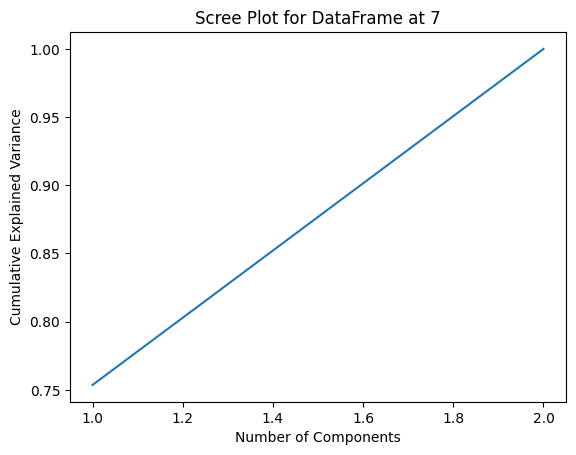

PCA for DataFrame at 8
[0.98729486 0.9964768  0.99708319 0.99751082 0.99788432 0.99814117
 0.99834082 0.99849972 0.99862919 0.99873879 0.99883888 0.99893316
 0.99901712 0.99909538 0.99916926 0.99924002 0.99930232 0.99936303
 0.99942182 0.99947771 0.99952833 0.99957625 0.99962237 0.99966735
 0.99970792 0.99974734 0.9997764  0.99980539 0.99983373 0.99985696
 0.99987987 0.99989911 0.99991726 0.99993238 0.9999467  0.99995868
 0.99996885 0.99997524 0.99998125 0.9999858  0.99998976 0.9999932
 0.99999578 0.99999763 0.99999883 0.9999997  0.99999992 0.99999999
 1.         1.        ]
dimension :  1


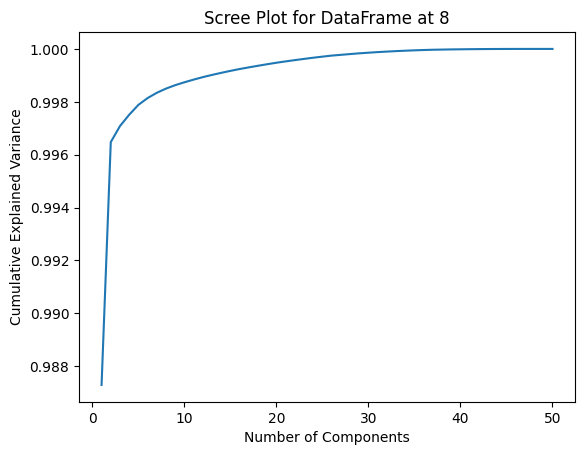

PCA for DataFrame at 9
[0.18863247 0.31297315 0.41283688 0.47986181 0.5327422  0.5781
 0.61122146 0.64359943 0.67147273 0.69817597 0.72385238 0.74664147
 0.76839624 0.78911256 0.80855752 0.82702621 0.84487213 0.86152354
 0.87753821 0.89286364 0.90665615 0.91885795 0.92934246 0.93896124
 0.94818218 0.95628467 0.96369021 0.96991565 0.97589394 0.98080491
 0.98533255 0.98885555 0.99224672 0.99442347 0.99649494 0.99756585
 0.99827191 0.99894723 0.99952447 0.99976095 0.99989327 0.99997377
 0.99999897 0.99999999 1.        ]
dimension :  21


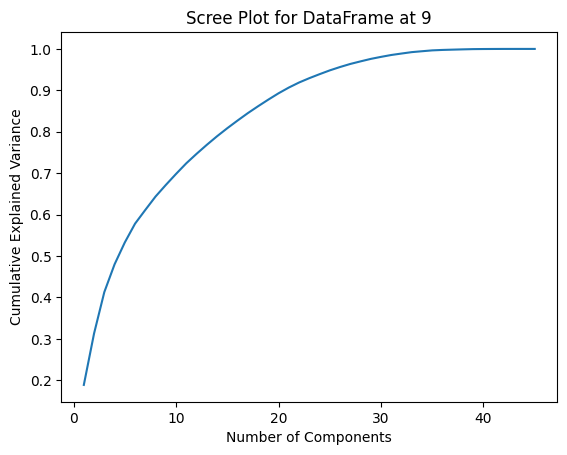

PCA for DataFrame at 10
[0.58169586 0.8906918  0.99037483 1.        ]
dimension :  3


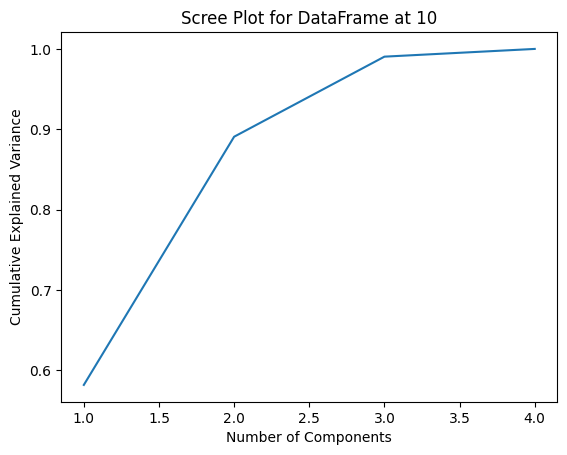

PCA for DataFrame at 11
[0.98732121 0.99659964 0.997219   0.99764415 0.99801199 0.99827869
 0.99847597 0.99862459 0.99875115 0.99886142 0.99896279 0.99905335
 0.99913645 0.99921378 0.9992861  0.99934952 0.99941132 0.99946744
 0.99952243 0.99957662 0.99962473 0.99967078 0.99971538 0.99975568
 0.99978972 0.9998193  0.99984758 0.9998722  0.99989404 0.99991447
 0.9999327  0.99994866 0.99995962 0.99997041 0.99997872 0.99998546
 0.99999039 0.99999456 0.99999673 0.99999879 0.99999952 0.99999992
 1.         1.         1.        ]
dimension :  1


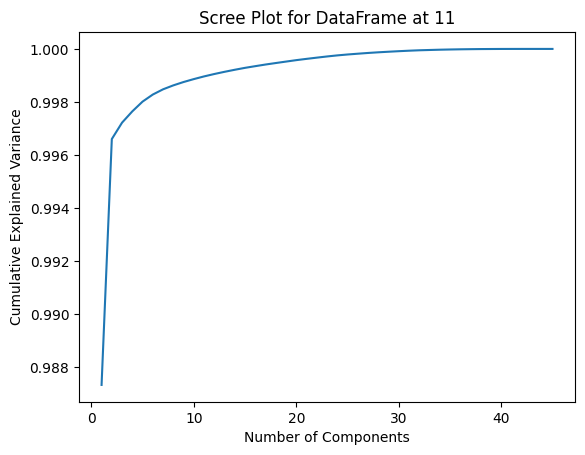

PCA for DataFrame at 12
[0.70768458 0.7565496  0.80393512 0.83227924 0.8536413  0.86903915
 0.88169573 0.89122042 0.89937954 0.90686205 0.91403771 0.92023979
 0.92625724 0.93193762 0.93713996 0.9420246  0.9467038  0.9511593
 0.95536874 0.95935729 0.96307947 0.96656975 0.96992071 0.97324032
 0.97633438 0.97926535 0.98199342 0.9842025  0.98638953 0.98827876
 0.98996094 0.99155582 0.99291518 0.99413267 0.99520344 0.99623436
 0.99712274 0.99788628 0.99837161 0.99881814 0.99911051 0.99936568
 0.99956479 0.99969656 0.99980573 0.999898   0.99996626 0.99999133
 0.99999953 0.99999995 1.        ]
dimension :  10


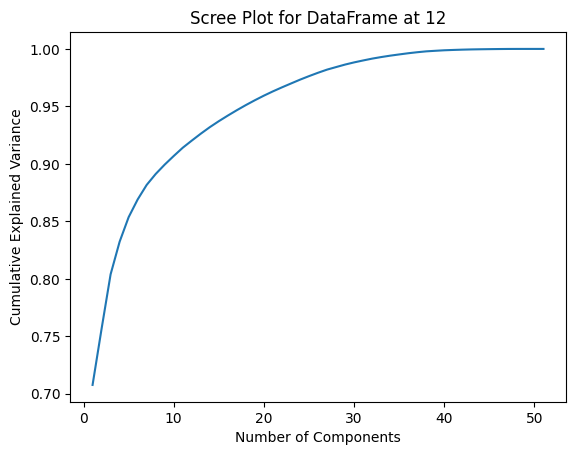

PCA for DataFrame at 13
[0.18364097 0.3084919  0.40664965 0.47028621 0.52257308 0.56806064
 0.60249772 0.6338823  0.66474754 0.69076982 0.71511759 0.73785713
 0.76013043 0.78008952 0.79924294 0.81733978 0.83458408 0.85115624
 0.86673057 0.88141869 0.89533993 0.90914921 0.9216134  0.93082521
 0.93976851 0.94850374 0.95565782 0.96270964 0.96864367 0.97426315
 0.97892283 0.98335248 0.98708027 0.99021795 0.99218909 0.99404118
 0.99544524 0.99666415 0.99773101 0.99852423 0.99909623 0.99963976
 0.99990751 0.99997595 0.99999803 0.99999986 1.        ]
dimension :  22


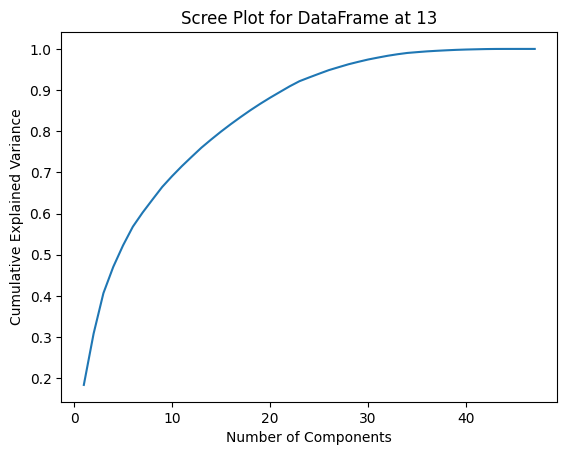

PCA for DataFrame at 14
[0.20700516 0.34525464 0.44998525 0.52288794 0.57907256 0.62455489
 0.65951951 0.69258153 0.72260624 0.74963384 0.77505905 0.79791174
 0.81863091 0.83839754 0.85779558 0.87686388 0.89419323 0.90938427
 0.92294073 0.93475748 0.9455437  0.95466871 0.96346914 0.97147404
 0.97827147 0.98442704 0.98844174 0.99240541 0.99552167 0.99799266
 0.99879089 0.99955085 0.99982105 0.99997026 0.99999884 0.99999998
 1.        ]
dimension :  18


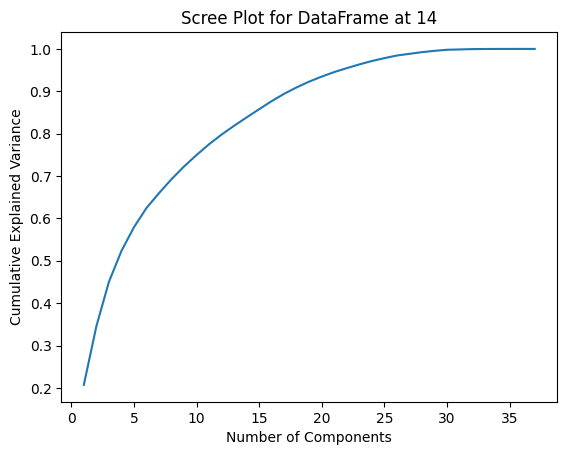

In [393]:
# Iterate over list of dataframes
for i in range(len(df_list_with_pca)):
  conduct_PCA(df_list_with_pca[i], i)

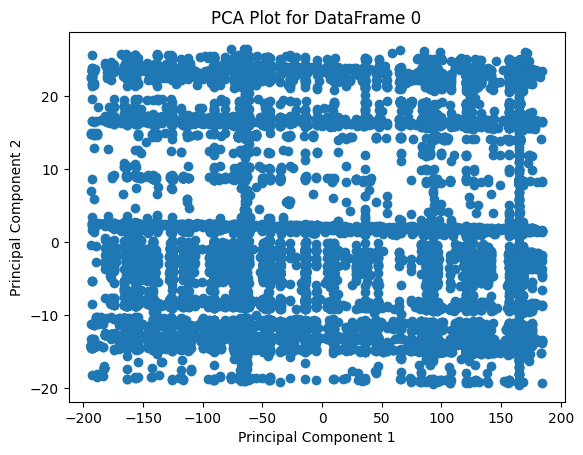

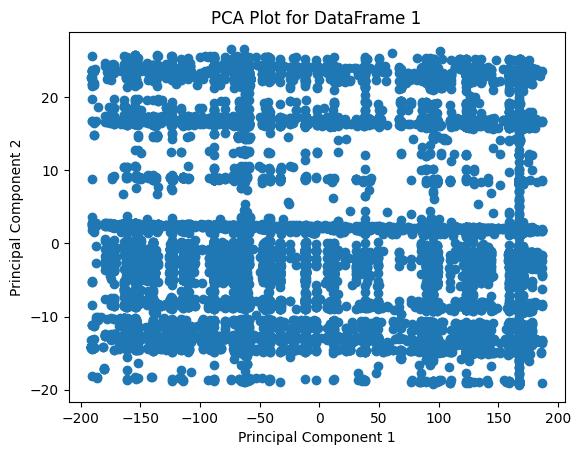

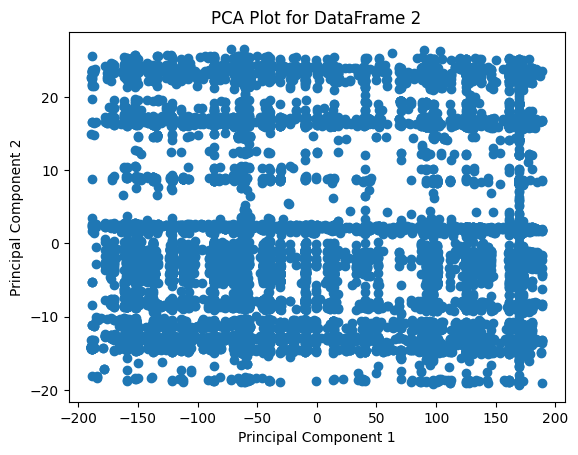

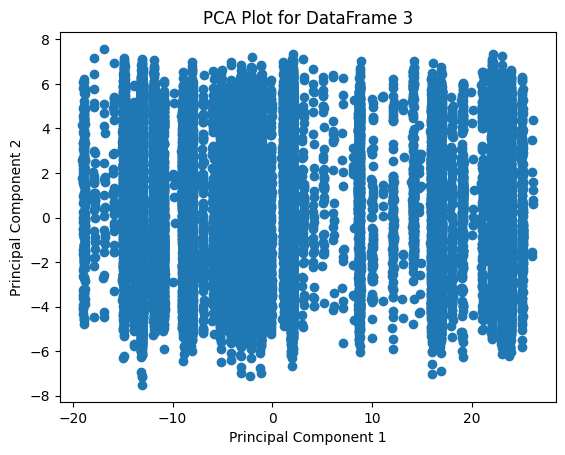

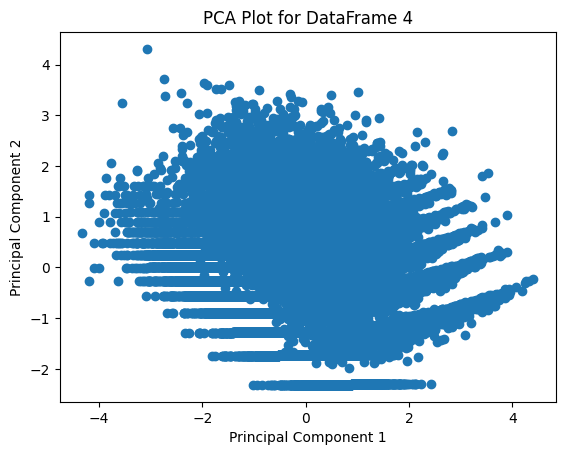

...

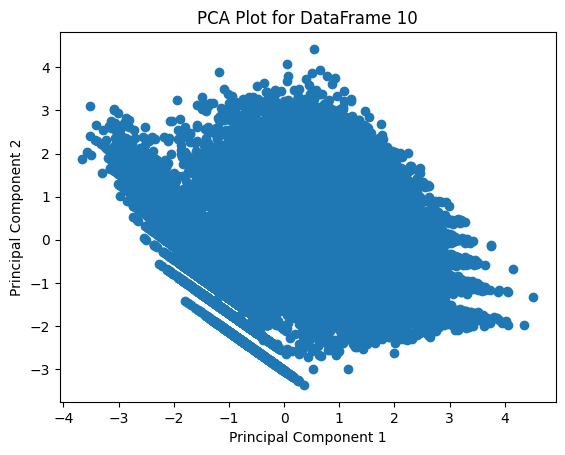

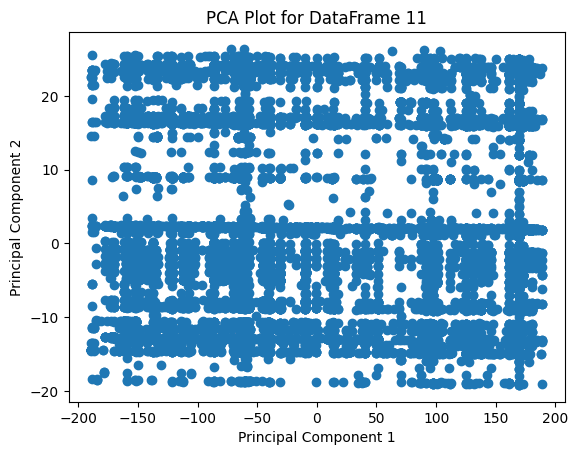

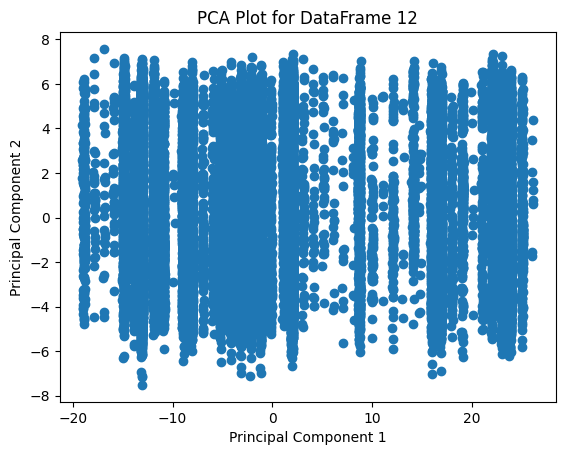

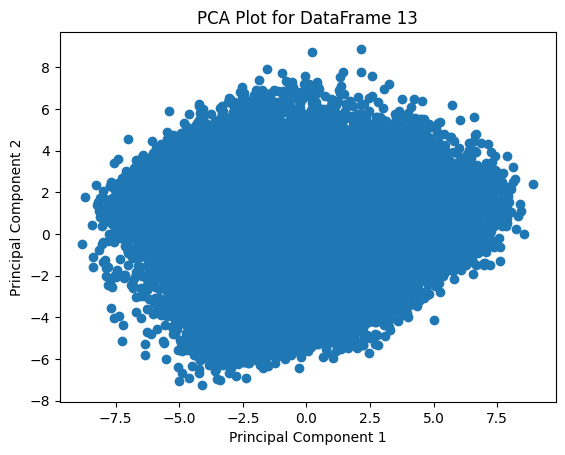

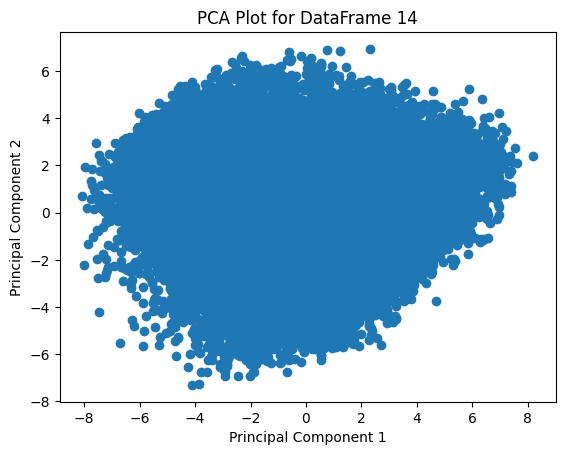

In [394]:
# Plot PCA for df_list_with_pca
for i in range(len(df_list_with_pca)):
  plt.scatter(df_list_with_pca[i][:, 0], df_list_with_pca[i][:, 1])
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for DataFrame {i}')
  plt.show()

In [395]:
# Keep Possible PCA Plottable where number of columns in df_with_pca_list is 2 or 3
df_final_list_with_pca = []
df_indices_of_2or3PCA = []
for i in range(len(df_list_with_pca)):
  if df_list_with_pca[i].shape[1] in [2, 3]:
    df_final_list_with_pca.append(df_list_no_pca[i])
    df_indices_of_2or3PCA.append(i)

print(len(df_final_list_with_pca))

9


In [396]:
df_indices_of_2or3PCA

[0, 1, 2, 4, 5, 7, 8, 10, 11]

After PCA, the selected dataframes for modeling testing are the following:
- (Index 4) - df_orig_feature_rfr_pca
- (Index 7) - df_non_outliers_IQR_feature_rfr_pca
- (Index 10) - df_non_outliers_iso_forest_feature_rfr_pca

In [397]:
def check_PCA_components(df, index_of_df):
    print(f"PCA for DataFrame at {index_of_df}")
    pca = PCA(n_components=df_list_with_pca[index_of_df].shape[1])
    df_pca = pca.fit_transform(df)
    print(pca.components_)
    print("\nTop feature contributions to principal components:")
    # Change component_names to reflect the number of components
    component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
    # Now component_names will have 15 column names (PC1 to PC15)
    loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df.columns)
    for i, pc in enumerate(component_names):
        sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
        print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
        print(f"Top contributing features:")
        for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
            sign = '+' if loadings.loc[feature, pc] > 0 else '-'
            print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")

    print("- " * 20)


In [974]:
for i in range(len(df_indices_of_2or3PCA)):
    check_PCA_components(df_list_no_pca[df_indices_of_2or3PCA[i]], df_indices_of_2or3PCA[i])

PCA for DataFrame at 0
[[ 8.53583990e-04  3.51913875e-04 -2.57583612e-04 -3.37493551e-04
   7.23138691e-05  6.99789492e-04 -2.06676018e-04  5.91352995e-04
   5.10304150e-05  5.60494800e-04 -8.20049213e-04 -8.80940510e-04
   4.23166178e-04  1.45275626e-03  1.13366126e-03  1.29533429e-03
   4.82638251e-04  8.61124879e-04 -4.67944112e-04  6.22217134e-04
   4.95502058e-04 -2.17552055e-04 -1.05406668e-03  2.41716160e-03
   2.05339220e-03  1.26636920e-03  1.44801879e-02  5.16570756e-03
  -8.24009536e-04 -5.89957341e-04 -1.23288323e-03 -1.00784333e-03
  -3.72187819e-04  9.66201731e-04  5.41704301e-04  8.82052669e-04
   1.58652204e-03  1.13003422e-03  7.41407983e-04 -7.23213287e-04
   4.51798453e-04 -3.39015364e-04 -9.74575516e-04 -2.65535308e-04
  -6.66042506e-04 -1.39825313e-03  1.28131810e-03 -1.01120533e-03
  -1.00108801e-03 -1.25208587e-04  9.95906391e-05  2.77896259e-04
   2.18946321e-04 -2.04198251e-04  1.36265685e-03 -2.41254986e-04
   7.58872230e-04  2.46190808e-05  1.13157300e-03  2.

# Model Training

In [ ]:
def elbow_method(df, index_of_df):
  wcss=[]
  sse = {}
  for i in range(1, 8):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

  # Print WCSS plot
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, 8), wcss)
  plt.title(f'The elbow method for DataFrame at index {index_of_df}')
  plt.xlabel('Number of clusters')
  plt.ylabel('WCSS')
  plt.show()

For cluster = 1, SSE/WCSS is 207719.9999999999
For cluster = 2, SSE/WCSS is 113705.91841023283
For cluster = 3, SSE/WCSS is 77403.96893844528
For cluster = 4, SSE/WCSS is 62077.922065262544
For cluster = 5, SSE/WCSS is 53115.01917142568
For cluster = 6, SSE/WCSS is 46137.16593428168
For cluster = 7, SSE/WCSS is 41308.99754781527


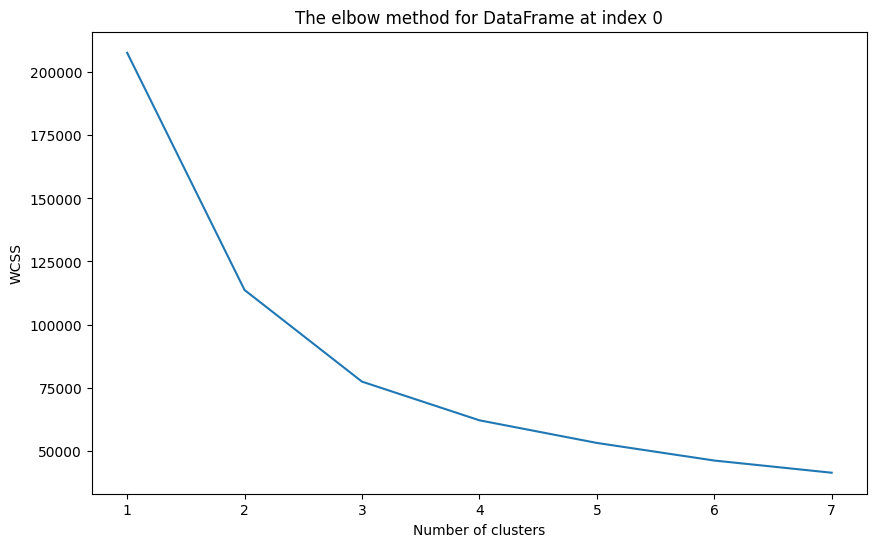

For cluster = 1, SSE/WCSS is 191964.9999999968
For cluster = 2, SSE/WCSS is 104700.83516015638
For cluster = 3, SSE/WCSS is 74600.53278377613
For cluster = 4, SSE/WCSS is 56608.856676350835
For cluster = 5, SSE/WCSS is 49195.61648683157
For cluster = 6, SSE/WCSS is 42232.01024461486
For cluster = 7, SSE/WCSS is 37034.115738707515


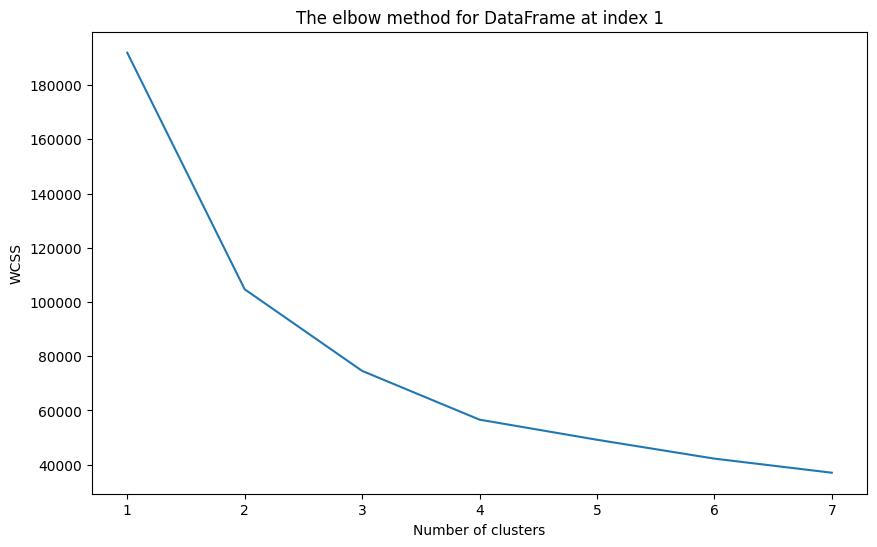

For cluster = 1, SSE/WCSS is 186945.00000000087
For cluster = 2, SSE/WCSS is 98096.23084686612
For cluster = 3, SSE/WCSS is 65940.90002298648
For cluster = 4, SSE/WCSS is 50342.236059673254
For cluster = 5, SSE/WCSS is 42778.82058406778
For cluster = 6, SSE/WCSS is 37841.091234554355
For cluster = 7, SSE/WCSS is 33177.97485686854


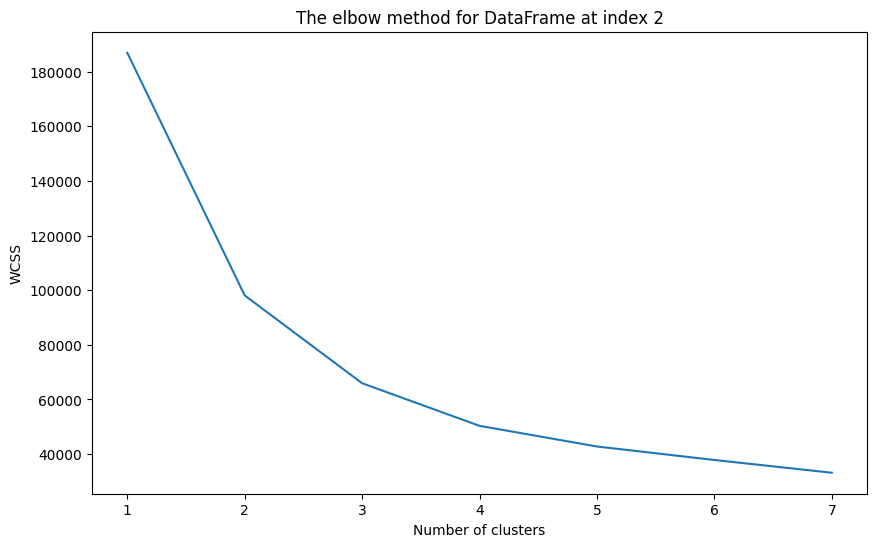

In [ ]:
# Iterate over non_df_pca list. Limit as df from automatic feature removal remains the same as 0
for i in range(len(df_indices_of_2or3PCA)):
  elbow_method(df_list_no_pca[df_indices_of_2or3PCA[i]], i)

For cluster = 1, SSE/WCSS is 191760.21070799587
For cluster = 2, SSE/WCSS is 98603.715195827
For cluster = 3, SSE/WCSS is 62214.6952964321
For cluster = 4, SSE/WCSS is 47439.44854934836
For cluster = 5, SSE/WCSS is 38605.369259658655
For cluster = 6, SSE/WCSS is 33428.246588200964
For cluster = 7, SSE/WCSS is 29182.932179890628


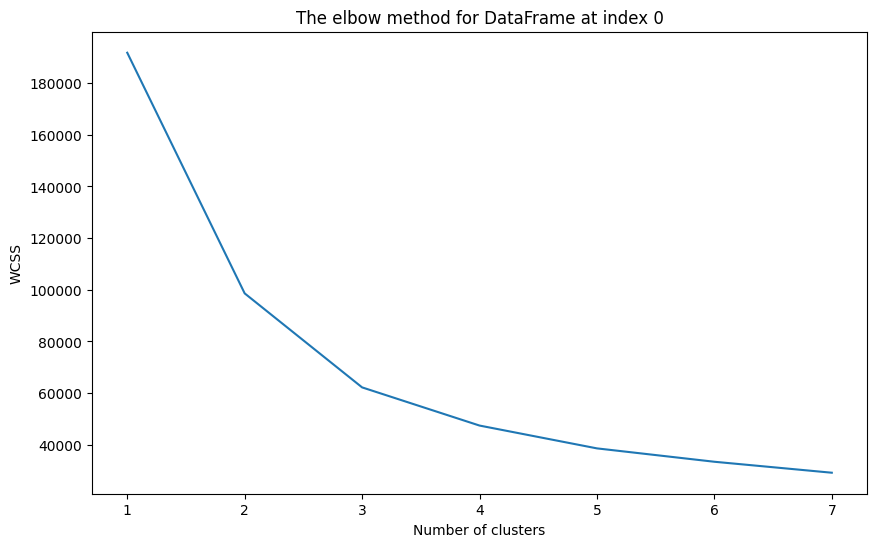

For cluster = 1, SSE/WCSS is 176832.984754282
For cluster = 2, SSE/WCSS is 90406.9308583863
For cluster = 3, SSE/WCSS is 60038.4124963353
For cluster = 4, SSE/WCSS is 42555.20778625193
For cluster = 5, SSE/WCSS is 35448.75330730698
For cluster = 6, SSE/WCSS is 29726.933922840584
For cluster = 7, SSE/WCSS is 25714.801461115083


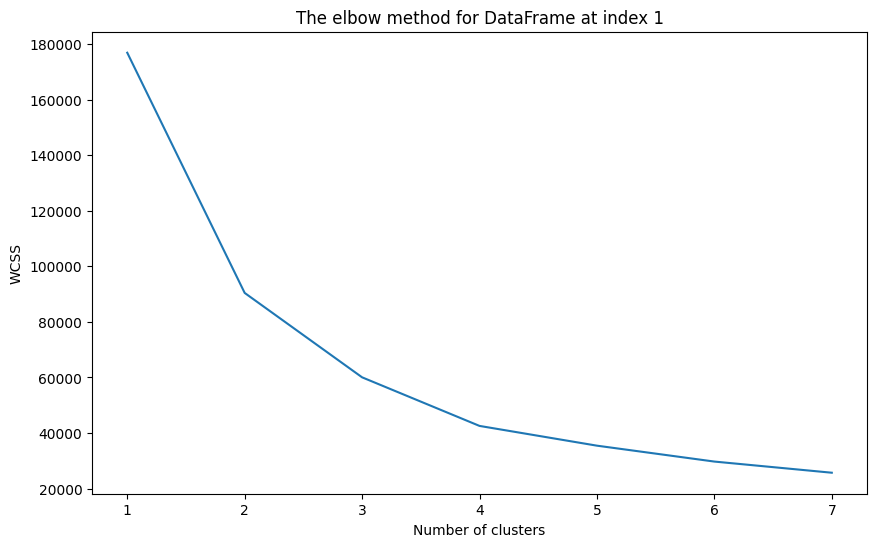

For cluster = 1, SSE/WCSS is 173854.68085296487
For cluster = 2, SSE/WCSS is 85685.85389151092
For cluster = 3, SSE/WCSS is 53596.79242204705
For cluster = 4, SSE/WCSS is 38219.320361685335
For cluster = 5, SSE/WCSS is 30689.5089579636
For cluster = 6, SSE/WCSS is 25958.167805263696
For cluster = 7, SSE/WCSS is 22640.6932429996


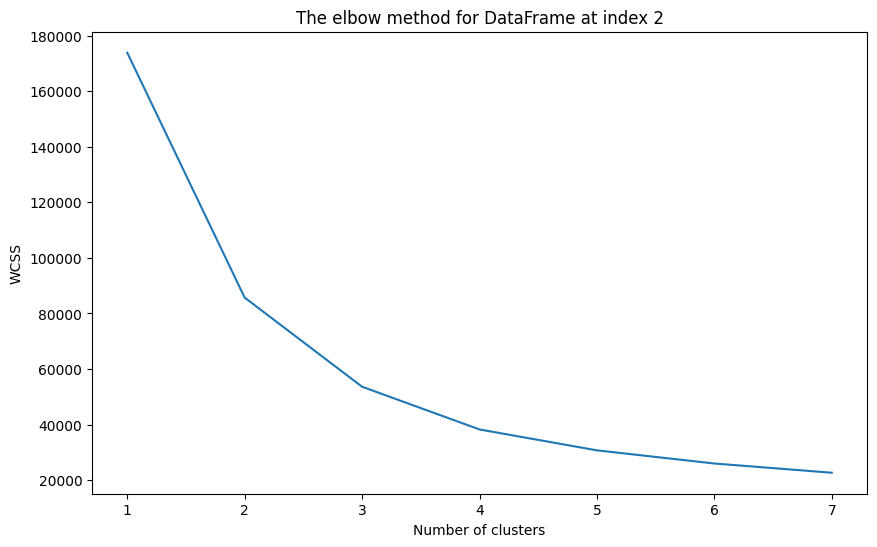

In [ ]:
# Iterate over df_with_pca list
for i in range(len(df_indices_of_2or3PCA)):
  elbow_method(df_list_with_pca[df_indices_of_2or3PCA[i]], i)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

def visualize_silhouette(cluster_lists, X_features, index_of_df):
    print(f"Silhouette Plot for DataFrame at {index_of_df}")
    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4 * n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters=n_cluster, max_iter=500, random_state=0, init='k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10

        # Correct handling of single subplot case
        if n_cols == 1:
            ax = axs
        else:
            ax = axs[ind]

        ax.set_title('Number of Cluster : ' + str(n_cluster) + '\n' +
                     'Silhouette Score :' + str(round(sil_avg, 3)))
        ax.set_xlabel("The silhouette coefficient values")
        ax.set_ylabel("Cluster label")
        ax.set_xlim([-0.1, 1])
        ax.set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        ax.set_yticks([])  # Clear the yaxis labels / ticks
        ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels == i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            ax.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values,
                             facecolor=color, edgecolor=color, alpha=0.7)
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        ax.axvline(x=sil_avg, color="red", linestyle="--")
    plt.show()

Silhouette Plot for DataFrame at 0


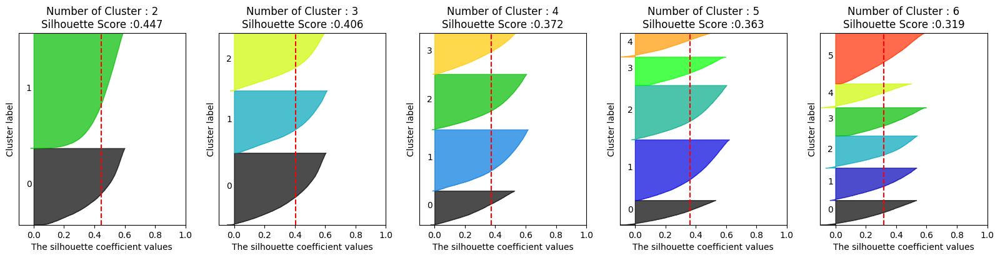

Silhouette Plot for DataFrame at 1


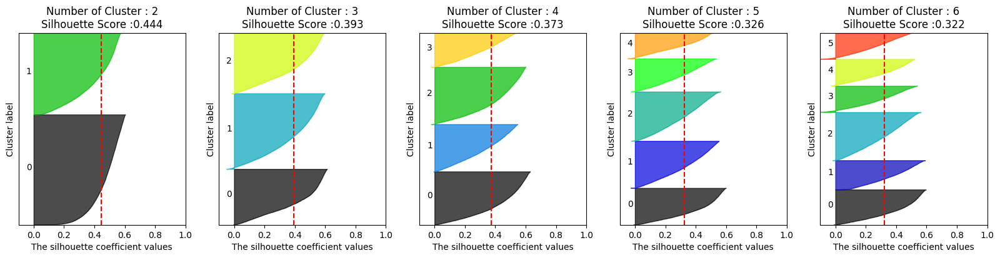

Silhouette Plot for DataFrame at 2


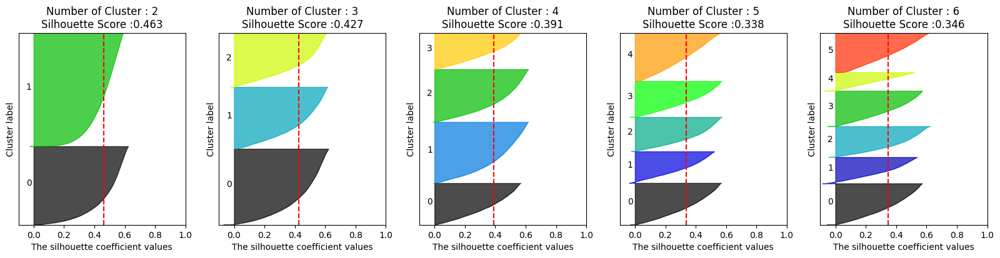

In [ ]:
for i in range(len(df_indices_of_2or3PCA)):
  visualize_silhouette([2, 3, 4, 5, 6], df_list_no_pca[df_indices_of_2or3PCA[i]], i)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [ ]:
for i in range(len(df_indices_of_2or3PCA)):
  for j in range(2, 7):
    clusterer = KMeans(n_clusters=j, max_iter=500, random_state=0, init='k-means++')
    cluster_labels = clusterer.fit_predict(df_list_no_pca[df_indices_of_2or3PCA[i]])
    print(f"Evaluation metrics for non_PCA DataFrame at {df_indices_of_2or3PCA[i]} with {j} clusters")
    silhouette = silhouette_score(df_list_no_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    calinski_harabasz = calinski_harabasz_score(df_list_no_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    davies_bouldin = davies_bouldin_score(df_list_no_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    print(f"Silhouette Score: {silhouette:.4f}")
    print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
    print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")
    print("- " * 20)

Evaluation metrics for non_PCA DataFrame at 4 with 2 clusters
Silhouette Score: 0.4470
Calinski-Harabasz Score: 34347.6750
Davies-Bouldin Score: 0.9469
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for non_PCA DataFrame at 4 with 3 clusters
Silhouette Score: 0.4062
Calinski-Harabasz Score: 34968.8701
Davies-Bouldin Score: 0.8571
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for non_PCA DataFrame at 4 with 4 clusters
Silhouette Score: 0.3721
Calinski-Harabasz Score: 32485.5279
Davies-Bouldin Score: 1.0106
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for non_PCA DataFrame at 4 with 5 clusters
Silhouette Score: 0.3630
Calinski-Harabasz Score: 28921.3000
Davies-Bouldin Score: 0.9832
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for non_PCA DataFrame at 4 with 6 clusters
Silhouette Score: 0.3189
Calinski-Harabasz Score: 29094.6956
Davies-Bouldin Score: 1.0276
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for non_PCA Data

Silhouette Plot for DataFrame at 0


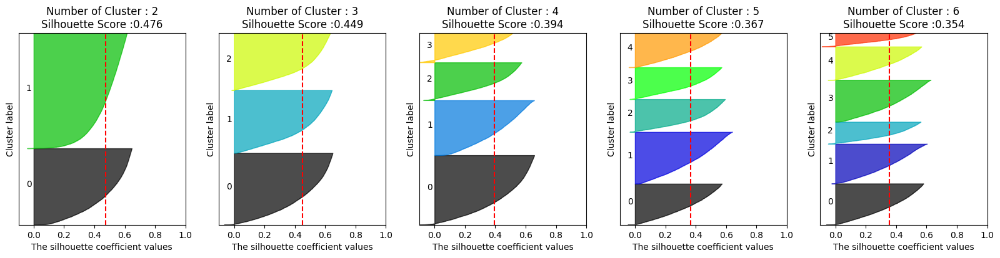

Silhouette Plot for DataFrame at 1


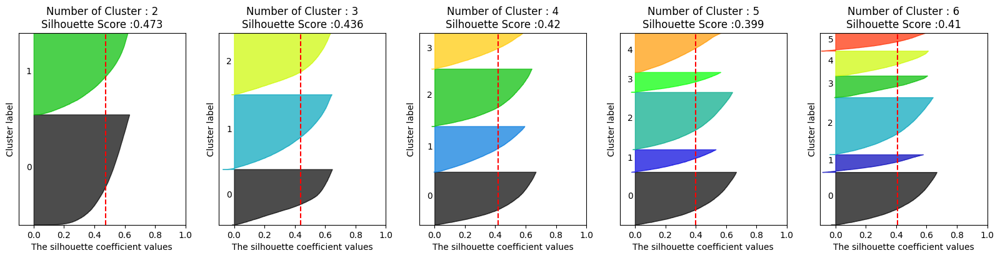

Silhouette Plot for DataFrame at 2


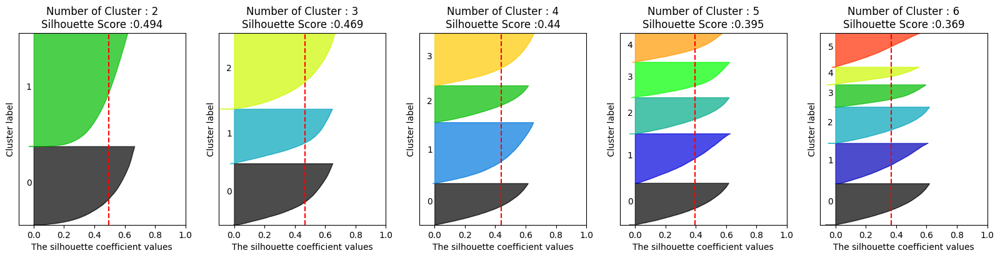

In [ ]:
for i in range(len(df_indices_of_2or3PCA)):
  visualize_silhouette([2, 3, 4, 5, 6], df_list_with_pca[df_indices_of_2or3PCA[i]], i)

In [ ]:
for i in range(len(df_indices_of_2or3PCA)):
  for j in range(2, 7):
    clusterer = KMeans(n_clusters=j, max_iter=500, random_state=0, init='k-means++')
    cluster_labels = clusterer.fit_predict(df_list_with_pca[df_indices_of_2or3PCA[i]])
    print(f"Evaluation metrics for PCA DataFrame at {df_indices_of_2or3PCA[i]} with {j} clusters")
    silhouette = silhouette_score(df_list_with_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    calinski_harabasz = calinski_harabasz_score(df_list_with_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    davies_bouldin = davies_bouldin_score(df_list_with_pca[df_indices_of_2or3PCA[i]], cluster_labels)
    print(f"Silhouette Score: {silhouette:.4f}")
    print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
    print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")
    print("- " * 20)

Evaluation metrics for PCA DataFrame at 4 with 2 clusters
Silhouette Score: 0.4757
Calinski-Harabasz Score: 39247.0726
Davies-Bouldin Score: 0.8599
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for PCA DataFrame at 4 with 3 clusters
Silhouette Score: 0.4489
Calinski-Harabasz Score: 43246.7363
Davies-Bouldin Score: 0.7525
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for PCA DataFrame at 4 with 4 clusters
Silhouette Score: 0.3942
Calinski-Harabasz Score: 36977.2366
Davies-Bouldin Score: 0.8381
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for PCA DataFrame at 4 with 5 clusters
Silhouette Score: 0.3671
Calinski-Harabasz Score: 41198.8985
Davies-Bouldin Score: 0.9049
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for PCA DataFrame at 4 with 6 clusters
Silhouette Score: 0.3539
Calinski-Harabasz Score: 38360.3176
Davies-Bouldin Score: 0.9233
- - - - - - - - - - - - - - - - - - - - 
Evaluation metrics for PCA DataFrame at 7 with 2 cluste

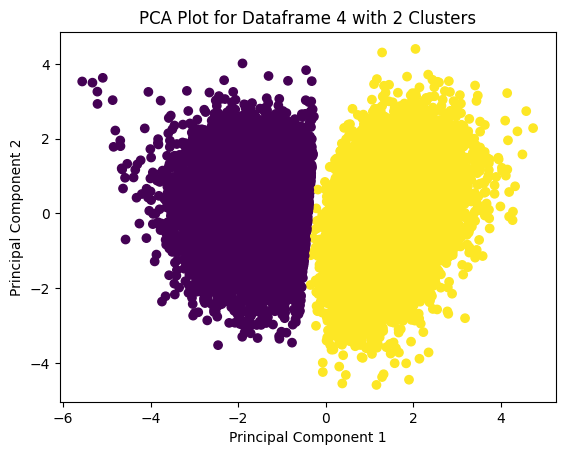

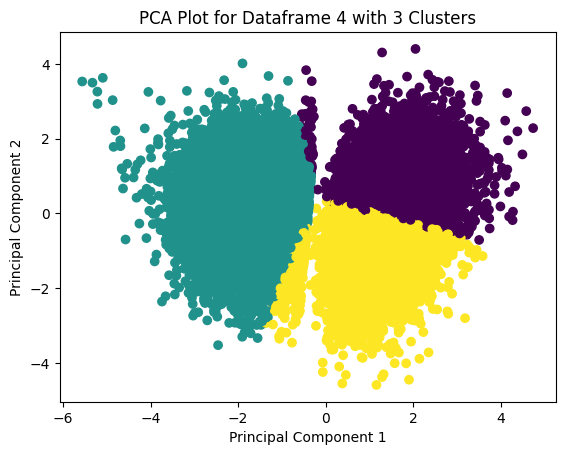

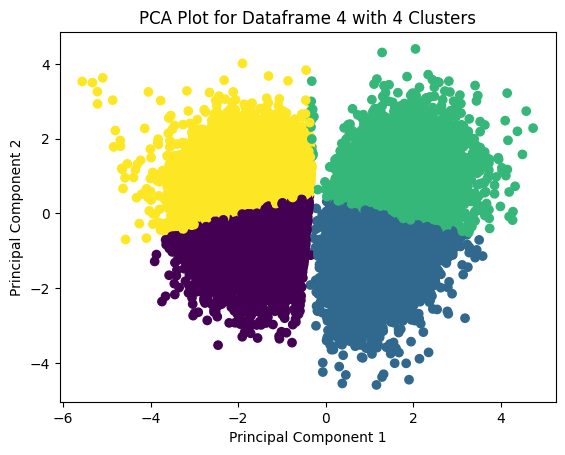

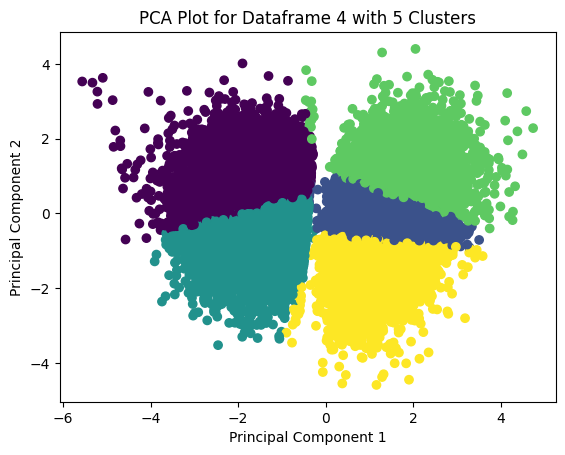

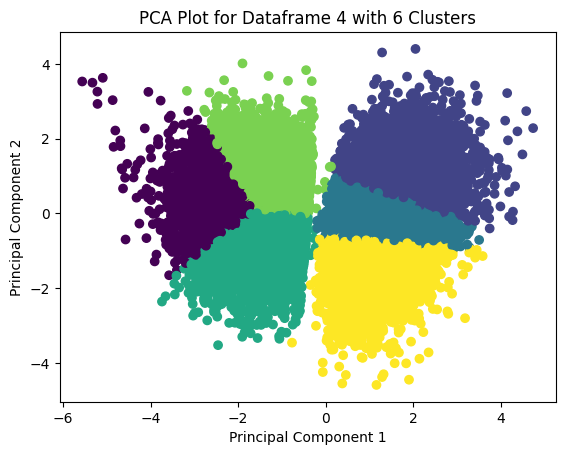

...

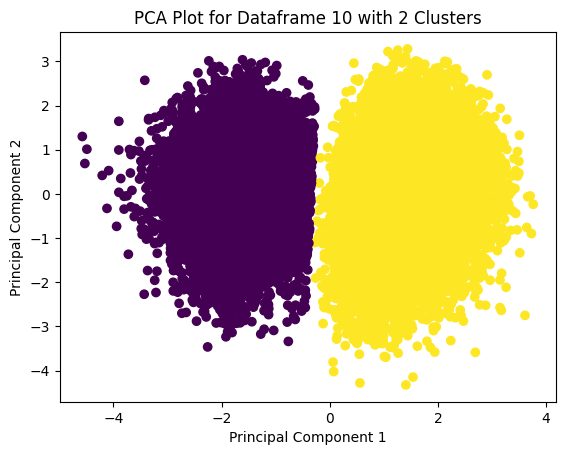

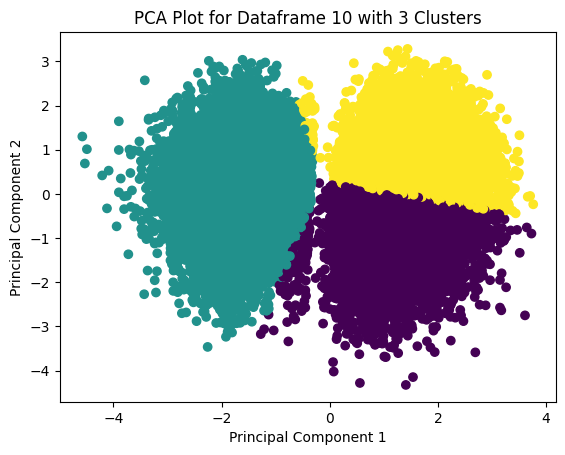

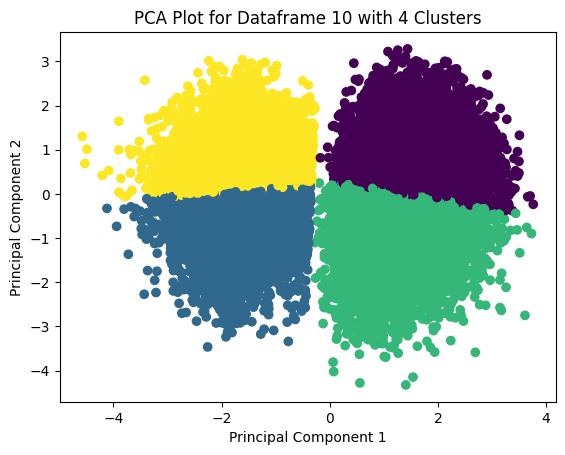

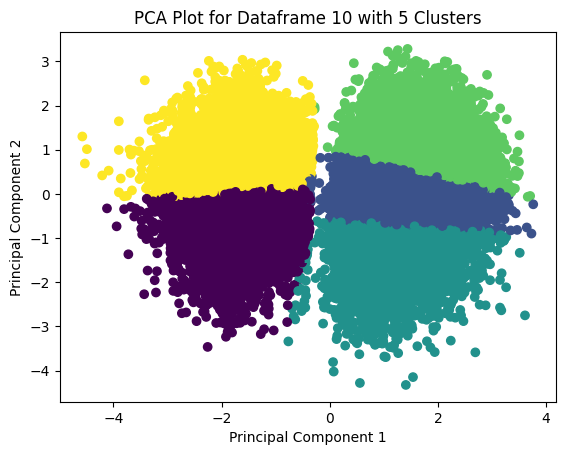

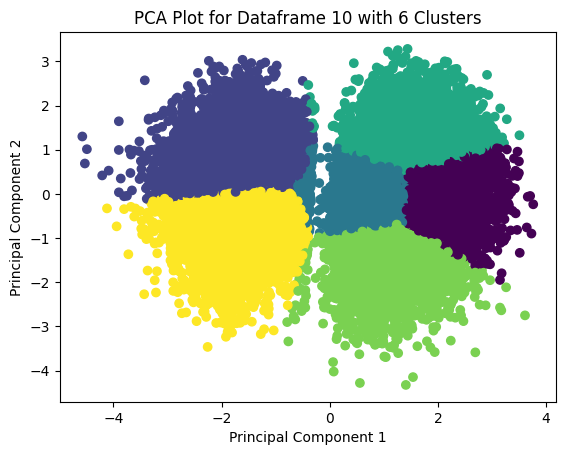

In [ ]:
# Train a KMeans Model
for i in range(len(df_indices_of_2or3PCA)):
  for j in range(2, 7):
    kmeans = KMeans(n_clusters = j, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    cluster_labels = kmeans.fit_predict(df_list_with_pca[df_indices_of_2or3PCA[i]])
    plt.scatter(df_list_with_pca[df_indices_of_2or3PCA[i]][:, 0], df_list_with_pca[df_indices_of_2or3PCA[i]][:, 1], c=kmeans.labels_)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title(f'PCA Plot for Dataframe {df_indices_of_2or3PCA[i]} with {j} Clusters')
    plt.show()

In [235]:
# Find the optimal epsilon for DBSCAN

from sklearn.neighbors import NearestNeighbors

def find_optimal_eps(data, k=3):
    nn = NearestNeighbors(n_neighbors=k)
    nn.fit(data)
    distances, _ = nn.kneighbors(data)

    k_distances = np.sort(distances[:, k-1])

    plt.figure(figsize=(8, 5))
    plt.plot(k_distances, marker='o', linestyle='-', color='b')
    plt.xlabel("Points sorted by distance")
    plt.ylabel(f"{k}-NN Distance")
    plt.title("K-distance Graph for DBSCAN Epsilon Selection")
    plt.grid(True)
    plt.show()

    eps = k_distances[int(len(k_distances) * 0.9)] 
    return eps

In [ ]:
# Find the best min_samples for DBSCAN

def find_best_min_samples(data, eps, min_range=2, max_range=20):
    best_score = -1
    best_min_samples = min_range

    for min_samples in range(min_range, max_range + 1):
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)
        labels = db.labels_
        num_clusters = len(set(labels) - {-1})

        if num_clusters > 1:
            score = silhouette_score(data, labels)
            if score > best_score:
                best_score = score
                best_min_samples = min_samples

    return best_min_samples

Evaluation Metrics for PCA DataFrame 4 (eps=0.36, min_samples=4):
  - Silhouette Score: 0.0297
  - Davies-Bouldin Score: 2.6238
  - Calinski-Harabasz Score: 5783.4540


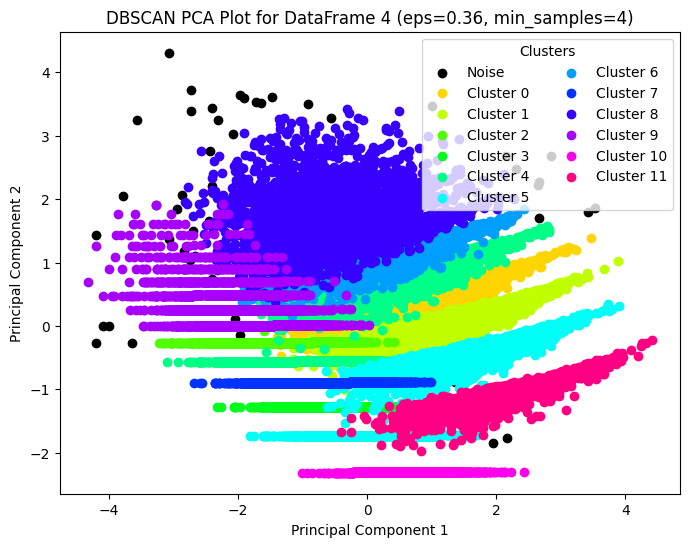

Evaluation Metrics for PCA DataFrame 7 (eps=0.36, min_samples=4):
  - Silhouette Score: 0.1087
  - Davies-Bouldin Score: 2.2657
  - Calinski-Harabasz Score: 8630.3682


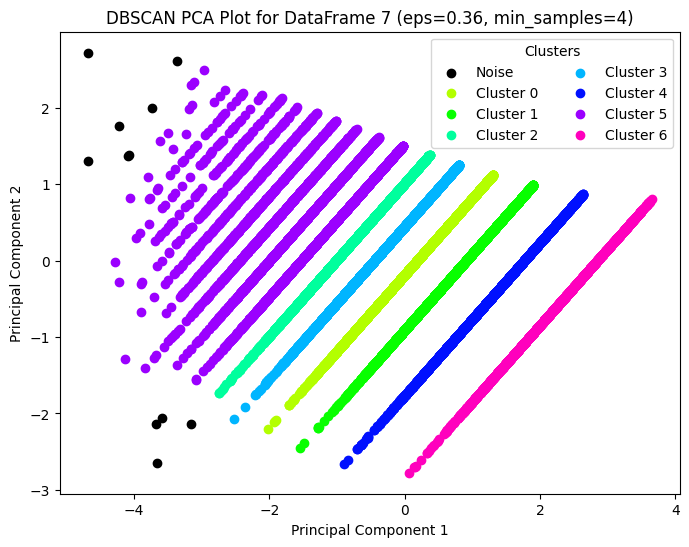

Evaluation Metrics for PCA DataFrame 10 (eps=0.36, min_samples=4):
  - Silhouette Score: -0.0755
  - Davies-Bouldin Score: 3.9896
  - Calinski-Harabasz Score: 2595.6439


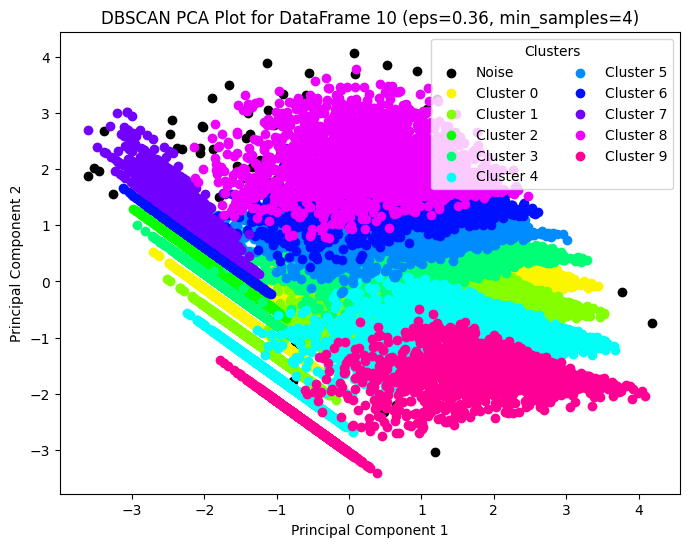

In [186]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

df_indices = [4, 7, 10]

for i in range(len(df_indices)):
    optimal_eps = 0.36  
    min_samples = 4  

    db = DBSCAN(eps=optimal_eps, min_samples=min_samples).fit(df_list_with_pca[df_indices[i]])
    labels = db.labels_

    sil_score = silhouette_score(df_list_with_pca[df_indices[i]], labels)
    dbs_score = davies_bouldin_score(df_list_with_pca[df_indices[i]], labels)
    chs_score = calinski_harabasz_score(df_list_with_pca[df_indices[i]], labels)

    print(f"Evaluation Metrics for PCA DataFrame {df_indices[i]} (eps={optimal_eps}, min_samples={min_samples}):")
    print(f"  - Silhouette Score: {sil_score:.4f}")
    print(f"  - Davies-Bouldin Score: {dbs_score:.4f}")
    print(f"  - Calinski-Harabasz Score: {chs_score:.4f}")
    
    unique_labels = np.unique(labels)
    colors = sns.color_palette("hsv", len(unique_labels))
    
    label_to_color = {-1: "black"}
    for idx, label in enumerate(unique_labels):
        if label != -1:
            label_to_color[label] = colors[idx]

    plt.figure(figsize=(8, 6))
    for label in unique_labels:
        cluster_points = df_list_with_pca[df_indices[i]][labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], 
                    c=[label_to_color[label]], label="Noise" if label == -1 else f"Cluster {label}")

    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.title(f"DBSCAN PCA Plot for DataFrame {df_indices[i]} (eps={optimal_eps}, min_samples={min_samples})")
    plt.legend(loc="best", title="Clusters", ncol=2, frameon=True)
    plt.show()

# Profiling / Describing the Clusters

    - Family Composition
    - Household Head Characteristics
    - Income Sources
    - Expenditure Priorities (essential and non-essential spending)
    - Savings and Debt Behavior
2. How do income levels influence spending habits across different household clusters?

In [398]:
df_backup = df.copy()
df_non_outliers_IQR_backup = df_IQR_copy.copy()
df_non_outliers_iso_forest_backup = df_iso_copy.copy()

## For df_orig

In [399]:
# Train a Kmeans model for df_list_with_pca 4
kmeans = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300,
                n_init = 10, random_state = 0)
df['Cluster'] = kmeans.fit_predict(df_list_with_pca[4])

In [400]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

silhouette = silhouette_score(df_list_with_pca[4], df['Cluster'])
calinski_harabasz = calinski_harabasz_score(df_list_with_pca[4], df['Cluster'])
davies_bouldin = davies_bouldin_score(df_list_with_pca[4], df['Cluster'])

print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.3453
Calinski-Harabasz Score: 25202.0254
Davies-Bouldin Score: 0.9823


In [401]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [402]:
# Locate indices from df_non_outliers and store created clusters
df['Cluster'] = cluster_labels

In [403]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed',
                       'Number of Unemployed', 'Number of Kids']

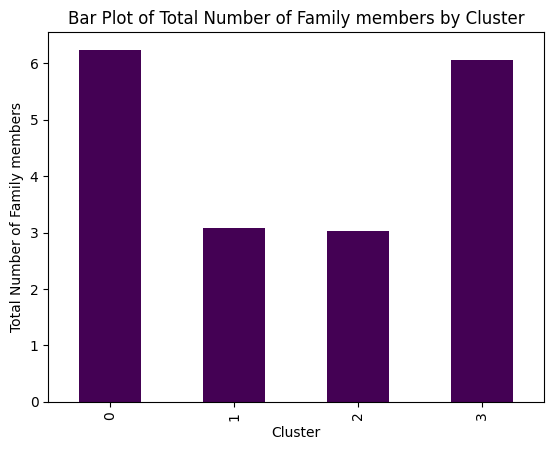

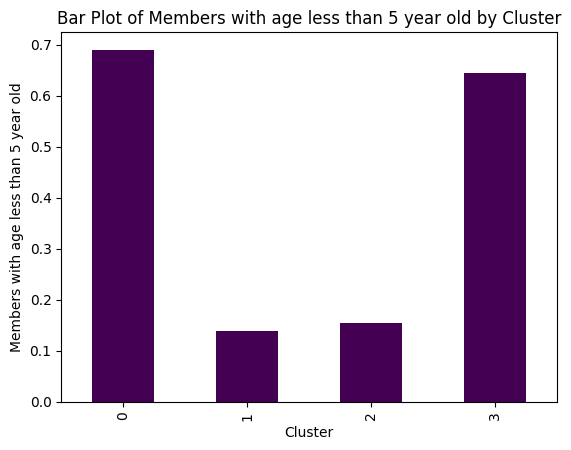

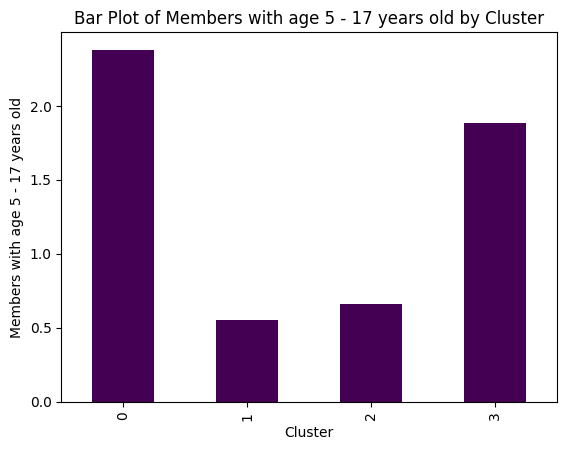

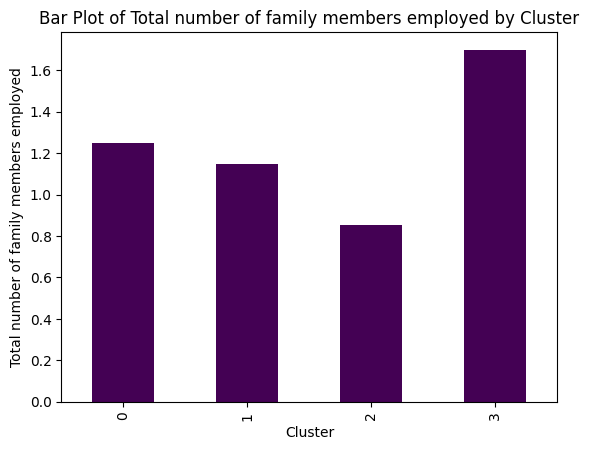

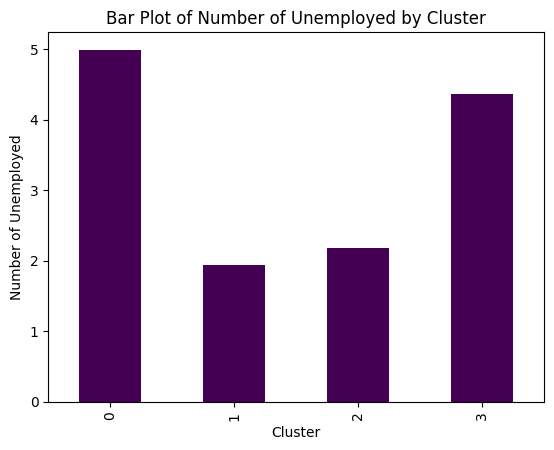

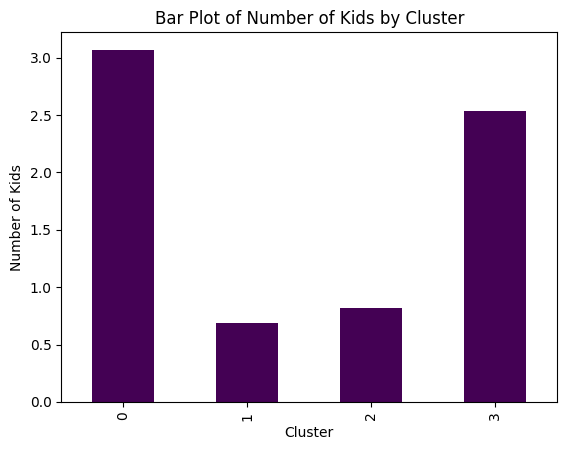

In [404]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

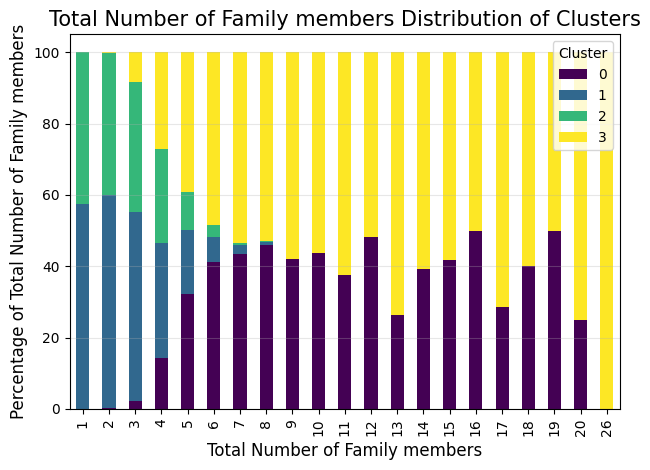

<Figure size 1400x800 with 0 Axes>

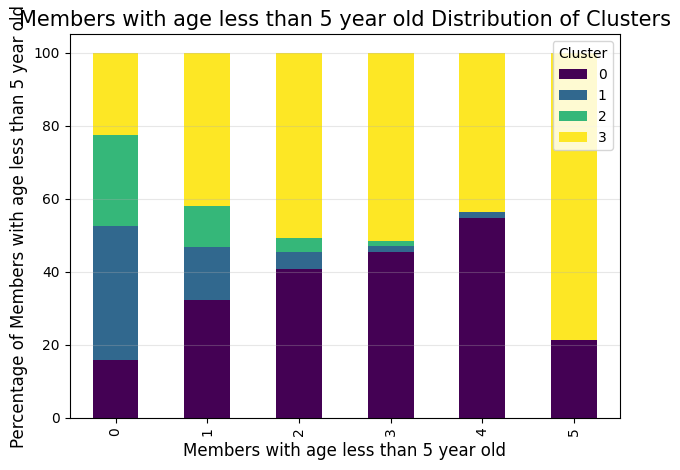

<Figure size 1400x800 with 0 Axes>

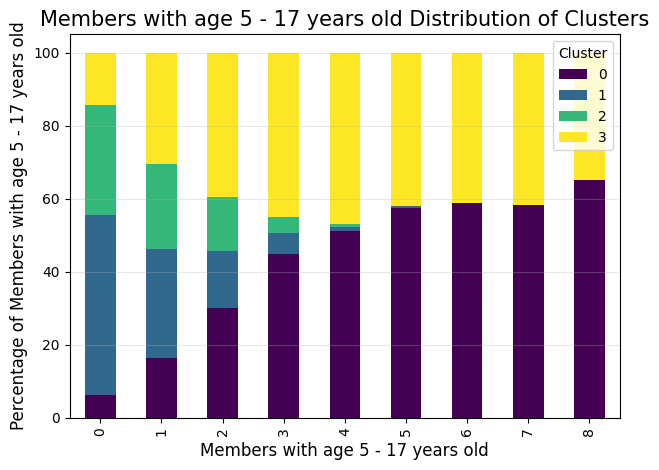

<Figure size 1400x800 with 0 Axes>

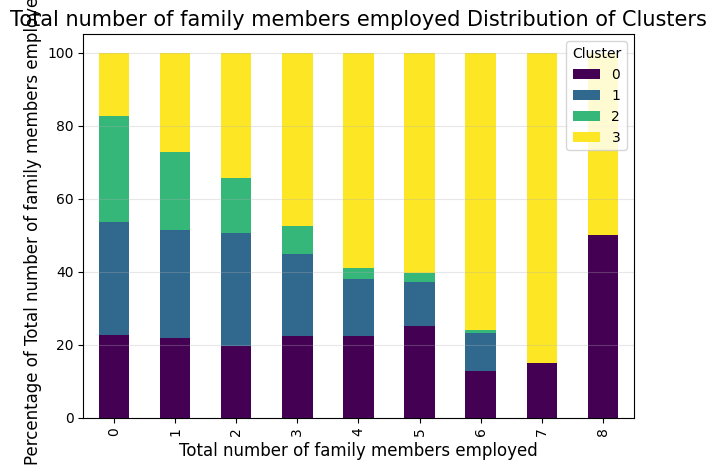

<Figure size 1400x800 with 0 Axes>

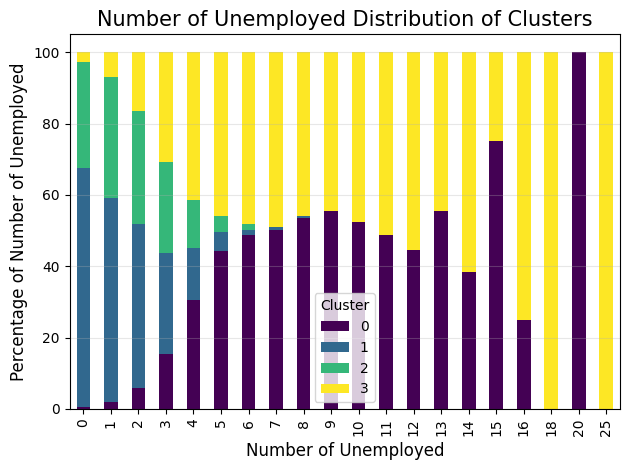

<Figure size 1400x800 with 0 Axes>

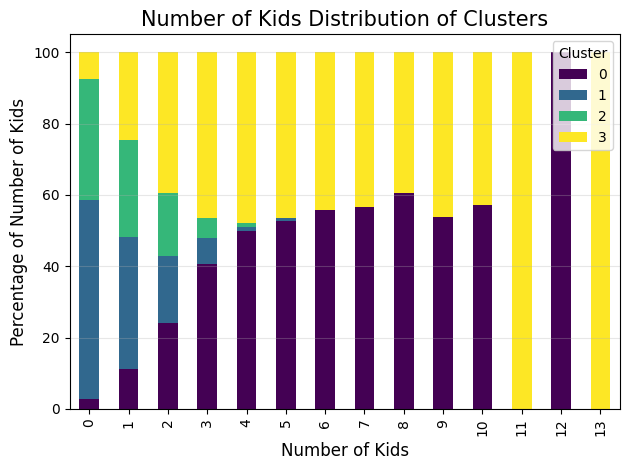

In [405]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

In [406]:
df.columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
   

In [407]:
household_head_characteristics_cat = ['Household Head Sex', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker']

household_head_characteristics_num = ['Household Head Age']

<Figure size 1400x800 with 0 Axes>

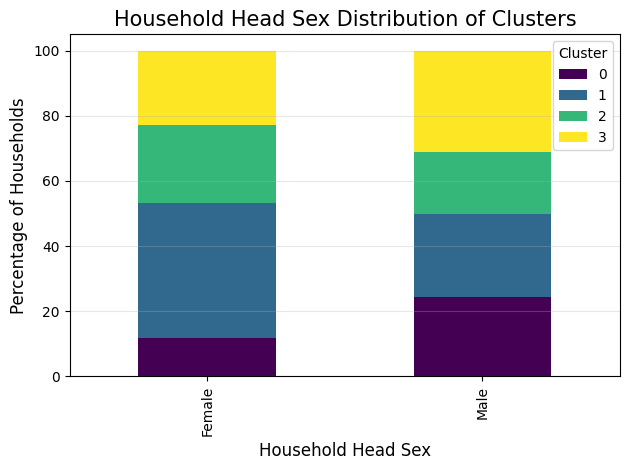

<Figure size 1400x800 with 0 Axes>

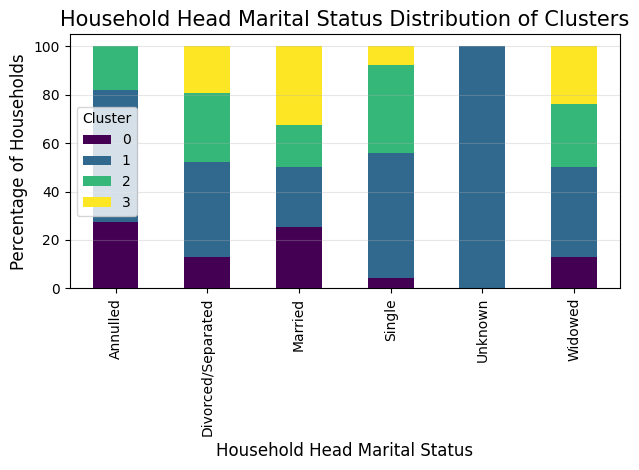

<Figure size 1400x800 with 0 Axes>

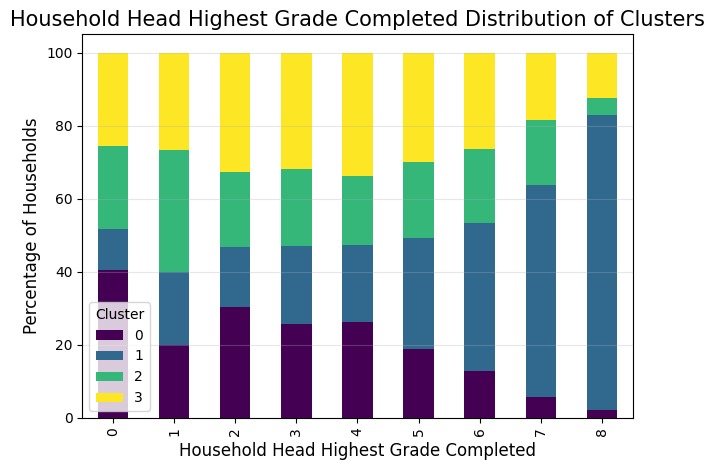

<Figure size 1400x800 with 0 Axes>

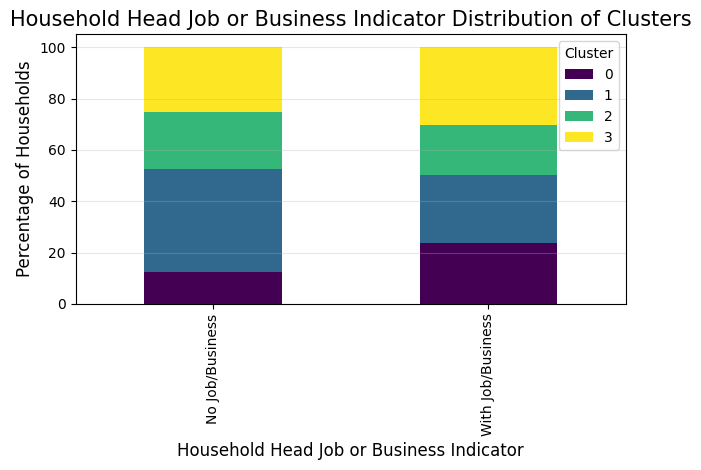

<Figure size 1400x800 with 0 Axes>

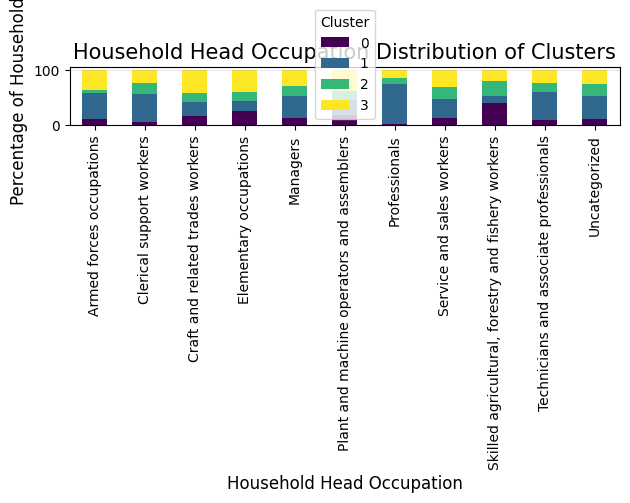

<Figure size 1400x800 with 0 Axes>

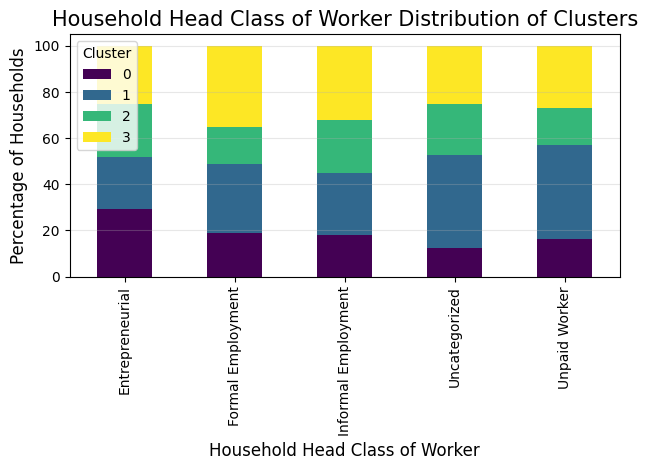

In [408]:
# Show Categorical Distribution based on Household_head_characteristics
for col in household_head_characteristics_cat:
  household_head_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  household_head_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [409]:
for cluster, group in df.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Occupation'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Occupation
Rice farmers              1169
Farmhands and laborers    1081
Corn farmers               939
Unknown                    932
Coconut farmers            563
Name: count, dtype: int64


Cluster 1:
Specific Occupation
Unknown                                                                                3036
General managers/managing proprietors in wholesale and retail trade                     977
General managers/managing proprietors in transportation, storage and communications     570
Farmhands and laborers                                                                  519
Rice farmers                                                                            341
Name: count, dtype: int64


Cluster 2:
Specific Occupation
Unknown                                                                1679
Rice farmers                                                            983
Farmhands and laborers                                                  482
Corn far

In [410]:
for cluster, group in df.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Education Level'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Education Level
Elementary Graduate     1970
High School Graduate    1827
Grade 4                  682
Grade 3                  631
Grade 5                  604
Name: count, dtype: int64


Cluster 1:
Specific Education Level
High School Graduate                                2921
Elementary Graduate                                 1621
Business and Administration Programs                 801
Teacher Training and Education Sciences Programs     603
Second Year College                                  560
Name: count, dtype: int64


Cluster 2:
Specific Education Level
High School Graduate       1983
Elementary Graduate        1612
Grade 4                     463
Grade 5                     437
Second Year High School     415
Name: count, dtype: int64


Cluster 3:
Specific Education Level
High School Graduate       2897
Elementary Graduate        2437
Grade 4                     740
Grade 5                     723
Second Year High School     708
Name: count, dtype: in

In [411]:
for cluster, group in df_IQR_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Household Head Occupation'].value_counts().head(5))
    print("\n")

KeyError: 'Cluster'

In [ ]:
# Display top 10 appearing Specific occupation and education
for col in household_head_characteristics_cat:
  print(df.groupby('Cluster')[col].value_counts())

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                          7890
         Widowed                           885
         Divorced/Separated                183
         Single                             80
         Annulled                            3
1        Married                          7876
         Widowed                          2540
         Single                           1007
         Divorced/Separated                558
         Annulled                            6
Name: count, dtype: int64
Cluster  Household Head Highest Grade Completed
0        2                                         2679
         3 

In [ ]:
for col in household_head_characteristics_cat:
  print(df.groupby('Cluster')[col].value_counts())

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                           7890
         Widowed                            885
         Divorced/Separated                 183
         Single                              80
         Annulled                             3
1        Married                           7876
         Widowed                           2540
         Single                            1007
         Divorced/Separated                 558
         Annulled                             6
         Unknown                              1
2        Married                           5443
         Widowed                   

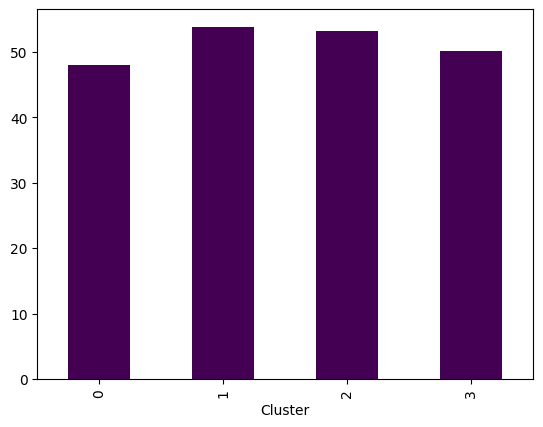

In [ ]:
# Bar Plot for Household Head Age
for column in household_head_characteristics_num:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')

In [ ]:
# Display Mean values for each income column, group by cluster
df.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,141690.585002,43285.701139,48.105851,36106.381816
1,388969.356607,75954.274274,127872.340841,0.000000
2,174346.719069,46360.105124,119.935197,32011.765391
3,237040.615580,46856.170087,52909.837219,0.000000


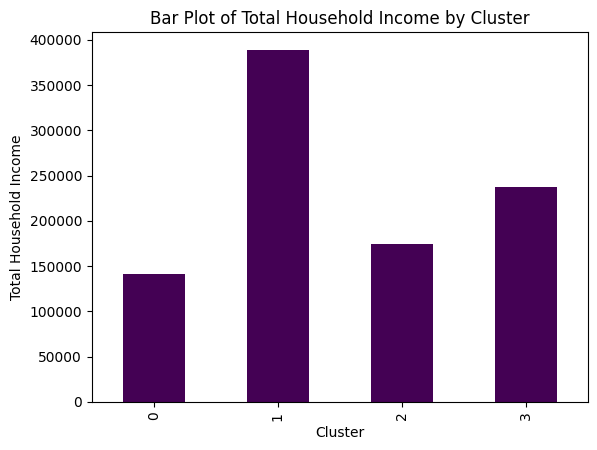

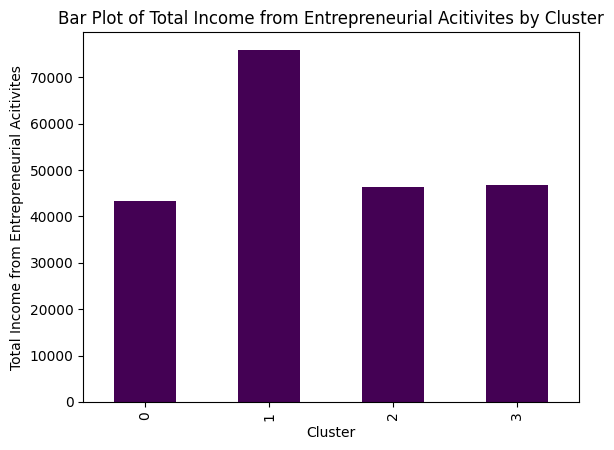

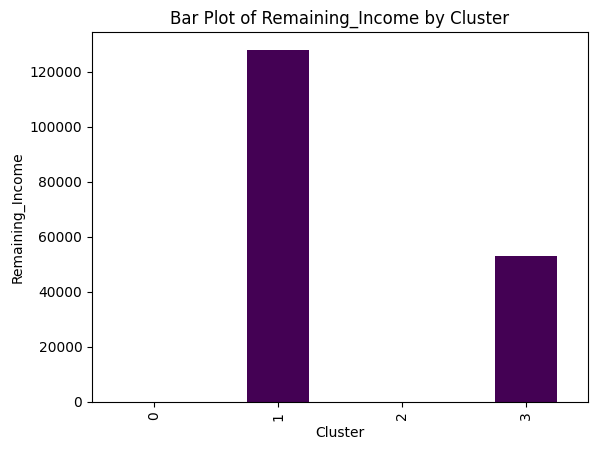

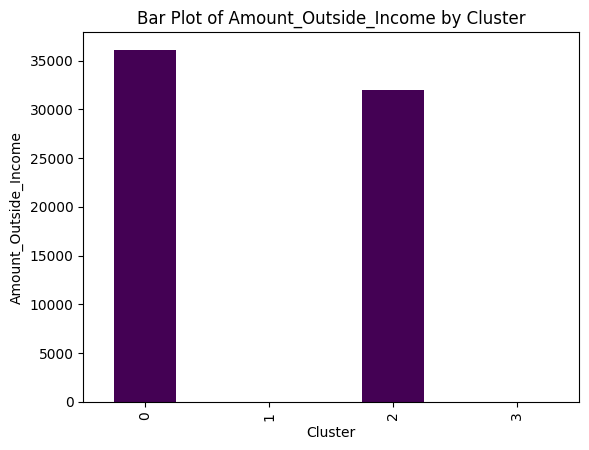

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,82007.229621,12690.179405,22597.799137,943.417874,2404.369649,3293.441323,7587.858423,2940.189470,3711.820153,4822.820595,1831.625926,7628.205287,25289.904104,110148.474837,67600.386130,177748.860967
1,90879.510594,19419.117868,59530.493493,1139.492075,2013.690274,7490.205372,19170.169670,8134.003337,11126.694278,11019.070404,7159.033534,17182.017518,6833.517351,168695.731899,92401.283867,261097.015766
2,76241.522261,17281.424217,36074.654746,1056.947078,2139.851674,3981.214569,9882.466579,4657.443298,9048.162366,7466.871955,3345.943598,10471.226209,24590.820713,124710.282971,81528.266291,206238.549262
3,87764.561402,12293.736332,30840.755048,1155.874077,2595.888278,4358.129371,11447.424725,4585.138811,4524.784108,5956.158513,3273.612707,10530.406830,4804.308160,126403.713265,57727.065096,184130.778362


In [ ]:
df.groupby('Cluster')[ratio_list].mean()

,Meat Ratio,Fish Ratio,Fruit Ratio,Vegetables Ratio,Bread and Cereals Ratio,Rice Ratio,Food Ratio,Housing and water Ratio,Alcoholic Beverages Ratio,Tobacco Ratio,...,House Rental Ratio,Expenditure to Income Ratio,Per Capita Income,Per Capita Expenditure,Essential Spending to Expenditure,NonEssential Spending to Expenditure,Essential Non Food Spending to Expenditure,NonFood Spending to Expenditure,Debt to Income Ratio,Savings to Income Ratio
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.086309,0.131297,0.028237,0.067839,0.396366,0.294069,0.492084,0.125708,0.005638,0.014787,...,0.061382,1.300845,22527.094860,28500.186004,0.643341,0.356659,0.151257,0.507916,0.301549,0.000704
1,0.134592,0.126671,0.035403,0.063245,0.267214,0.187961,0.405992,0.225256,0.006054,0.011720,...,0.128775,0.737097,126550.011127,85967.555584,0.690009,0.309991,0.284018,0.594008,0.000000,0.262903
2,0.111215,0.126866,0.032073,0.068402,0.299537,0.214336,0.423119,0.173799,0.006473,0.013589,...,0.093604,1.208485,57938.843699,68781.038321,0.640451,0.359549,0.217333,0.576881,0.211352,0.002867
3,0.108772,0.136556,0.026306,0.063626,0.364871,0.269941,0.524645,0.162224,0.006754,0.016213,...,0.082356,0.808267,37940.045194,29824.686836,0.720652,0.279348,0.196007,0.475355,0.000000,0.191733


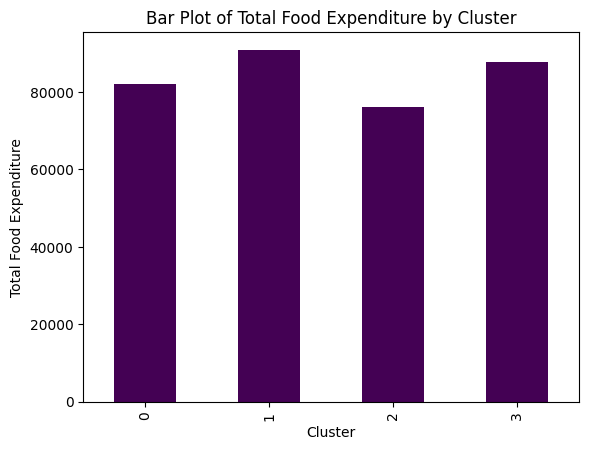

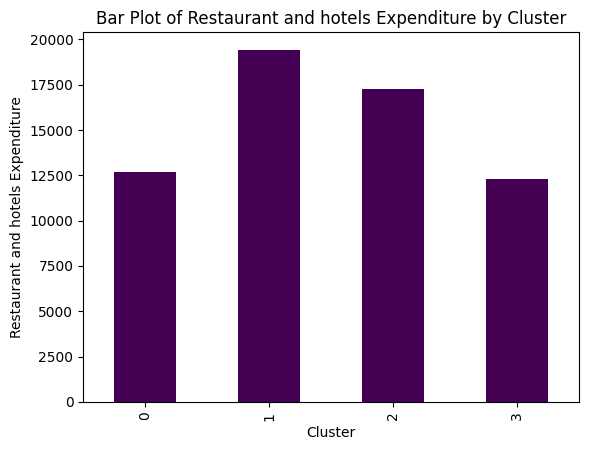

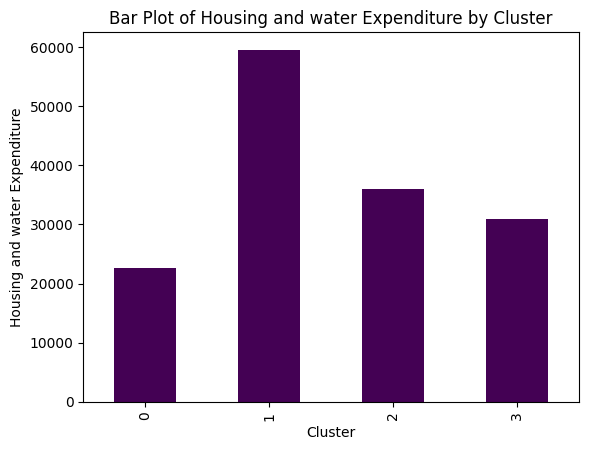

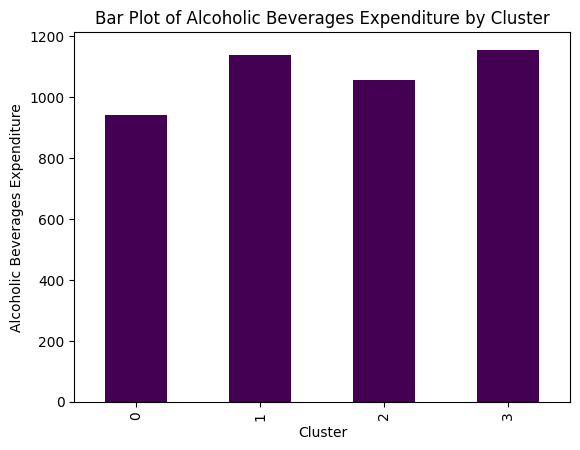

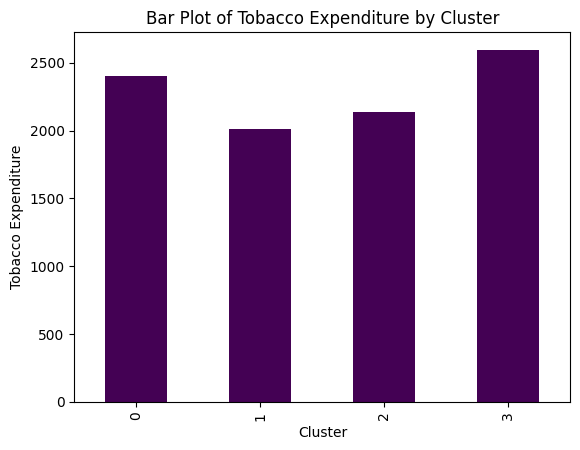

...

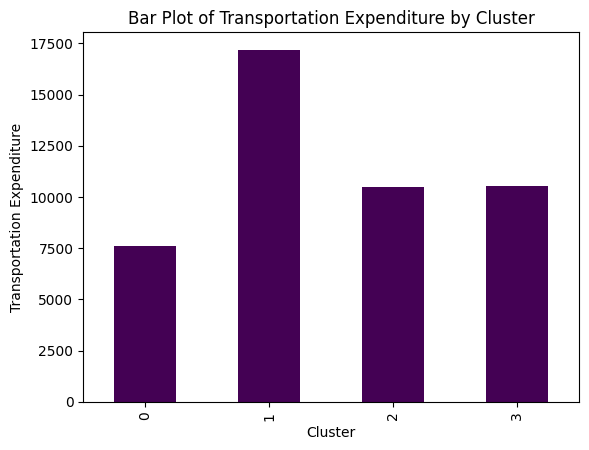

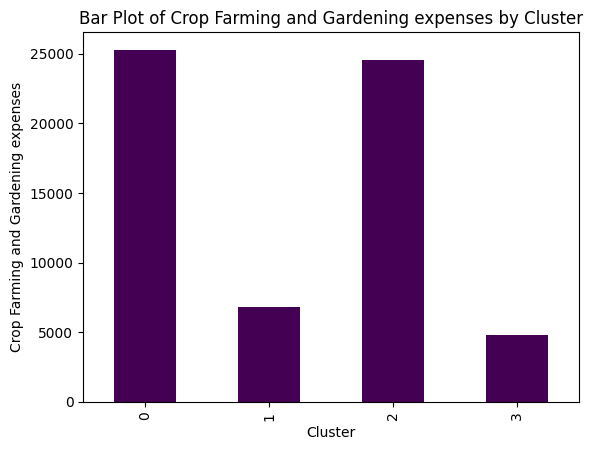

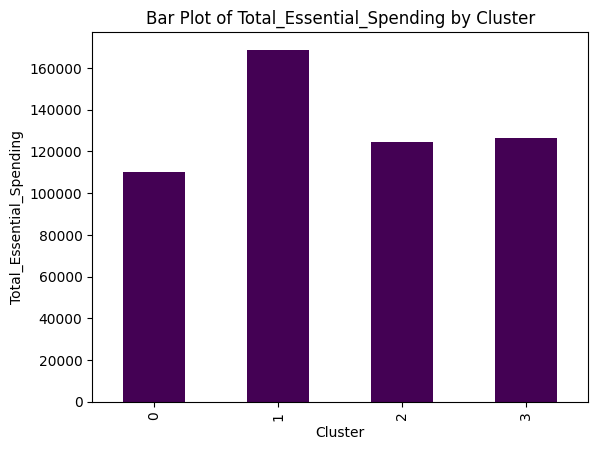

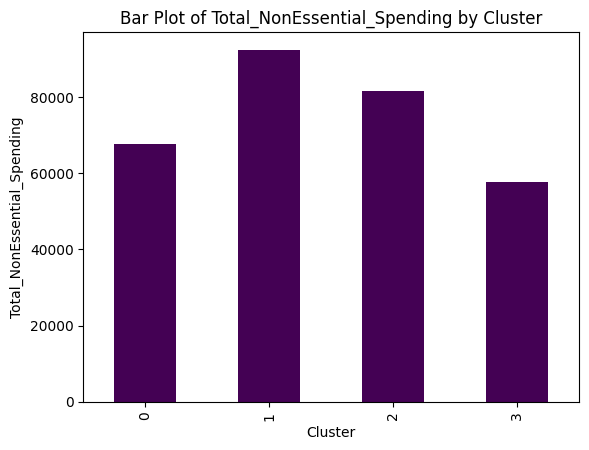

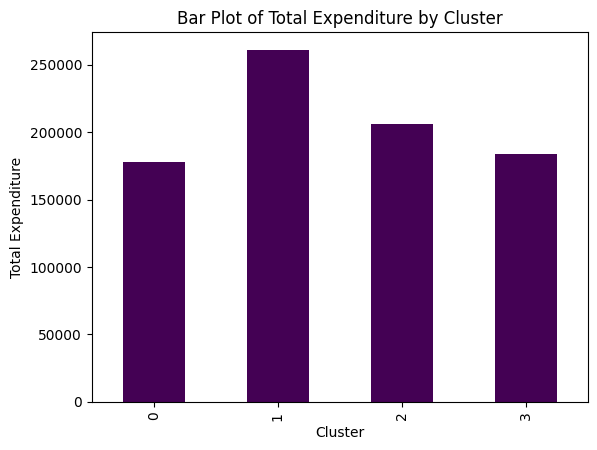

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

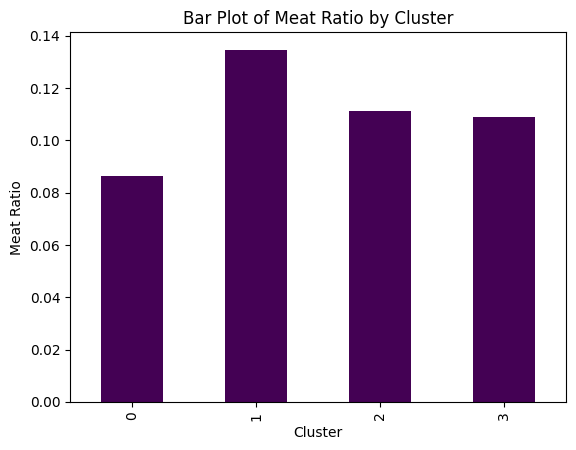

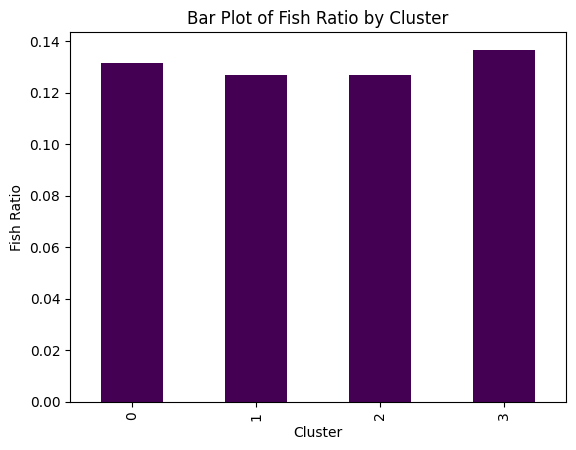

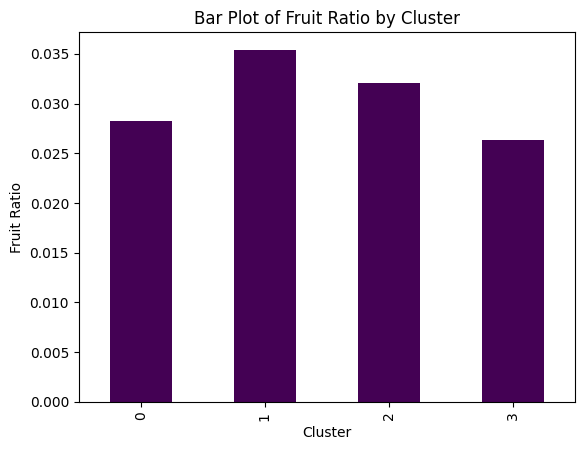

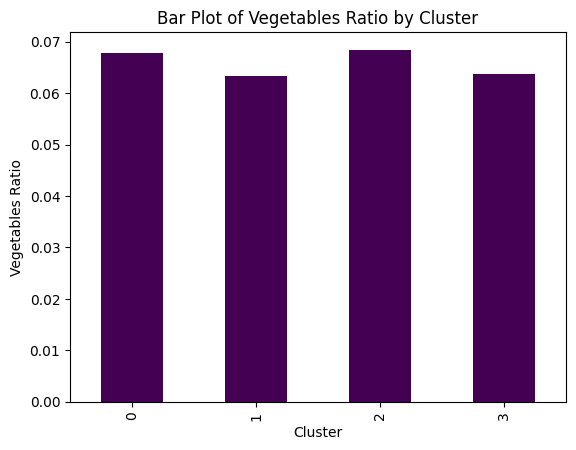

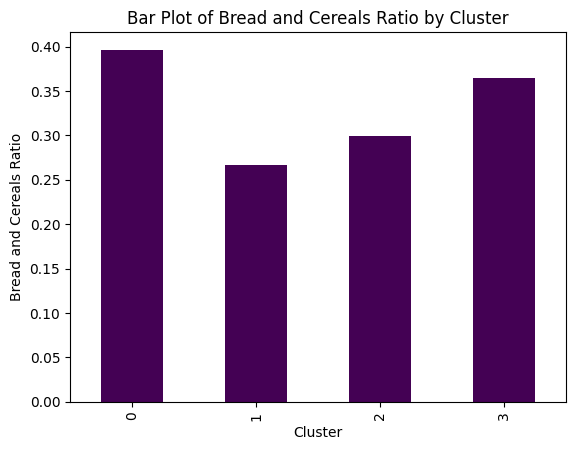

...

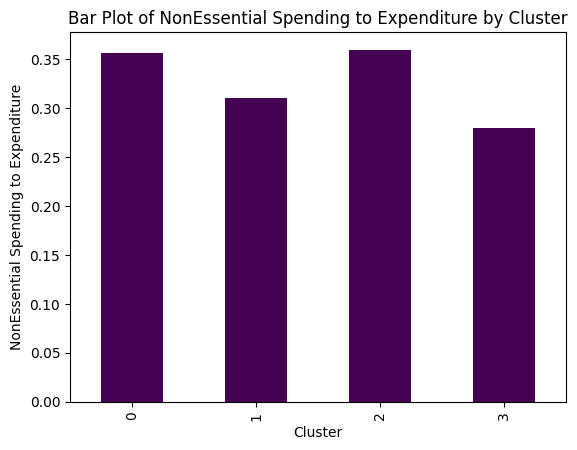

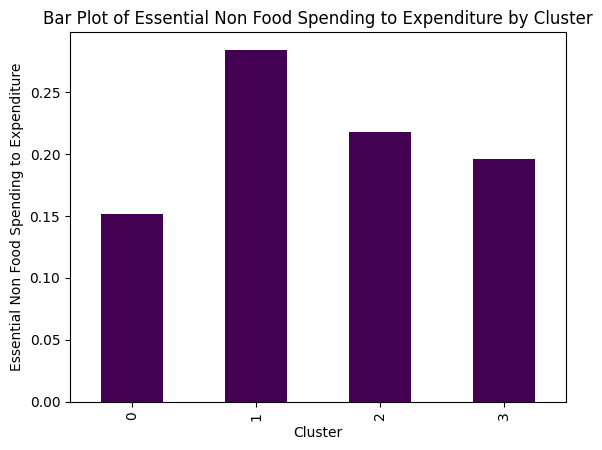

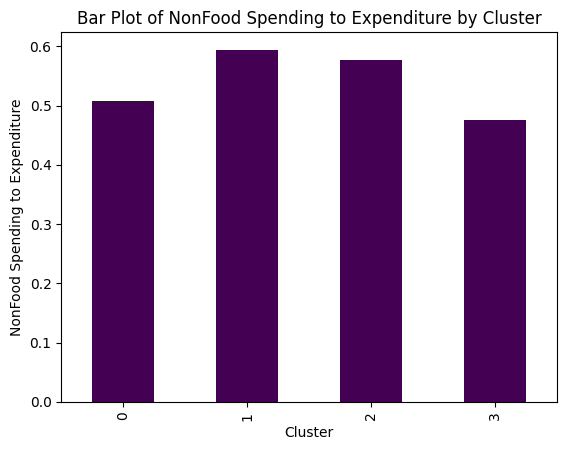

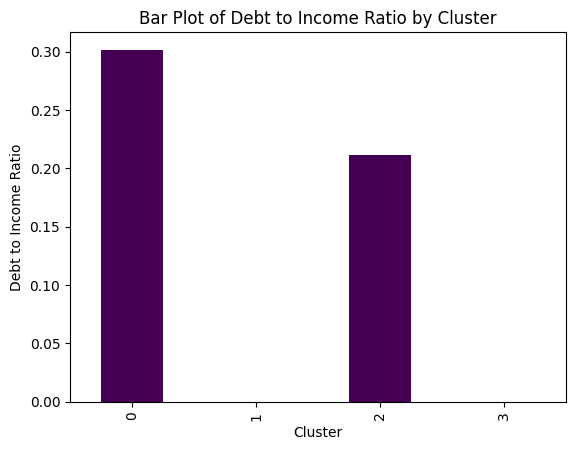

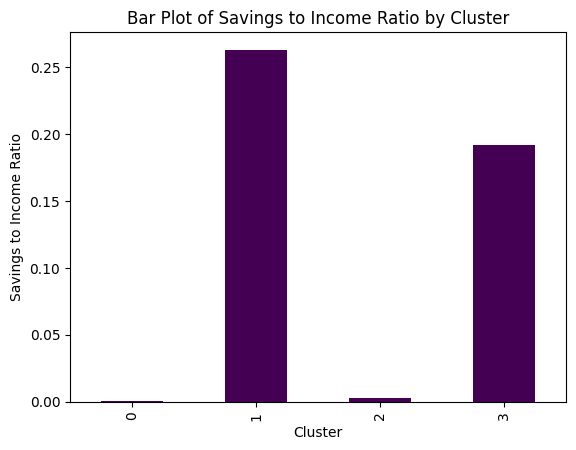

In [ ]:
# Bar Plot for Ratio Columns
for column in ratio_list:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

## For df_IQR

In [ ]:
# Train a Kmeans model for df_list_with_pca 4
kmeans = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300,
                n_init = 10, random_state = 0)
df_IQR_copy['Cluster'] = kmeans.fit_predict(df_list_with_pca[7])

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

silhouette = silhouette_score(df_list_with_pca[7], df_IQR_copy['Cluster'])
calinski_harabasz = calinski_harabasz_score(df_list_with_pca[7], df_IQR_copy['Cluster'])
davies_bouldin = davies_bouldin_score(df_list_with_pca[7], df_IQR_copy['Cluster'])

print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.3453
Calinski-Harabasz Score: 25202.0254
Davies-Bouldin Score: 0.9823


In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df_IQR_copy['Cluster'] = cluster_labels

In [ ]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed',
                       'Number of Unemployed', 'Number of Kids']

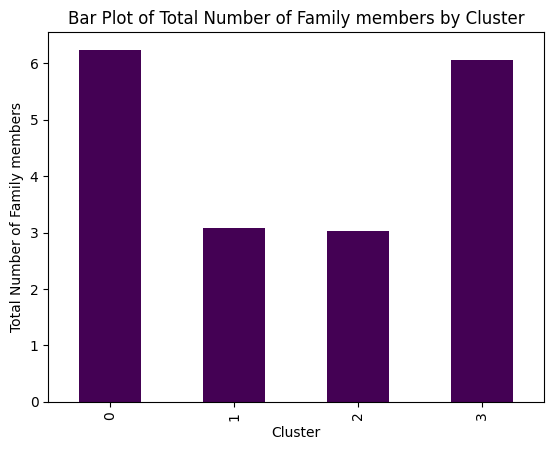

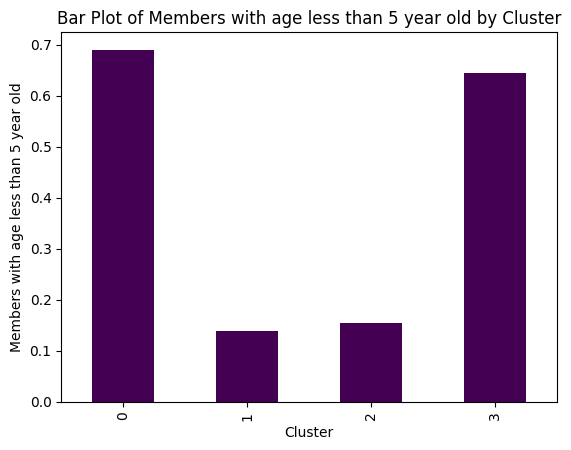

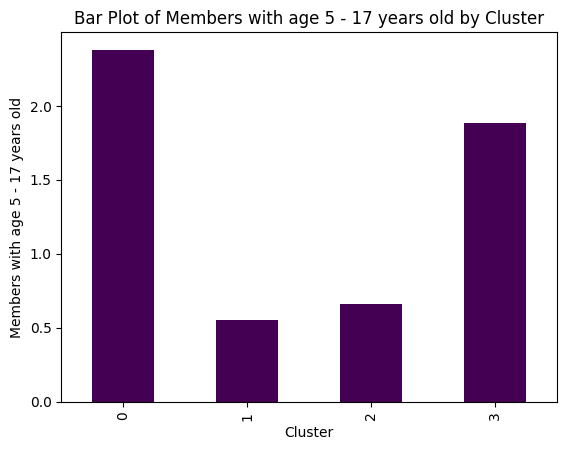

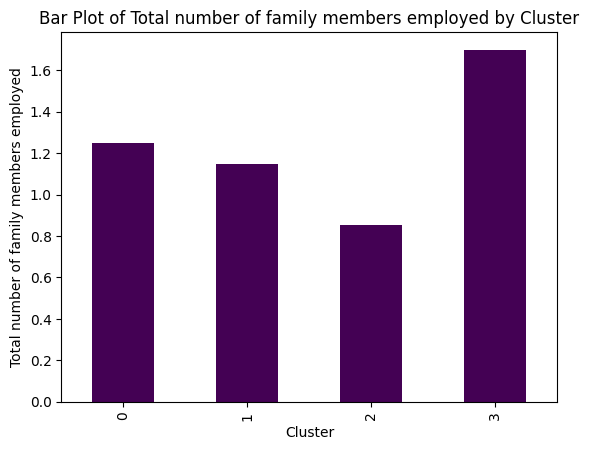

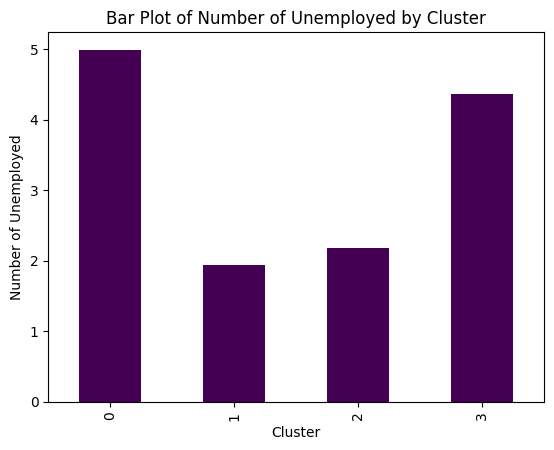

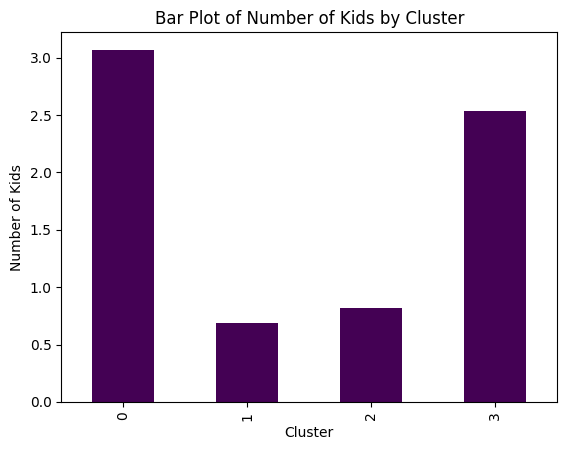

In [ ]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df_IQR_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

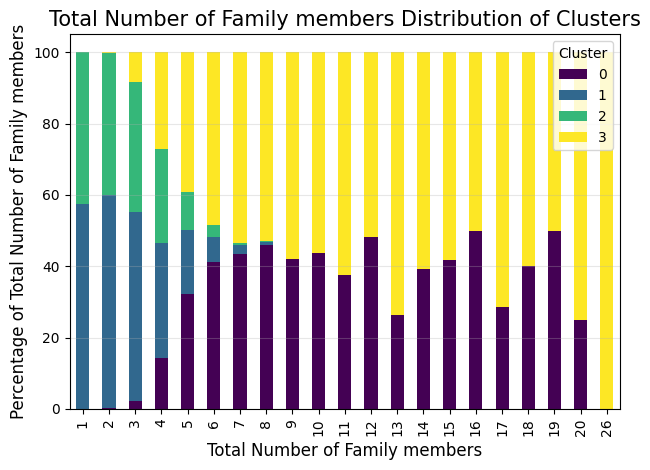

<Figure size 1400x800 with 0 Axes>

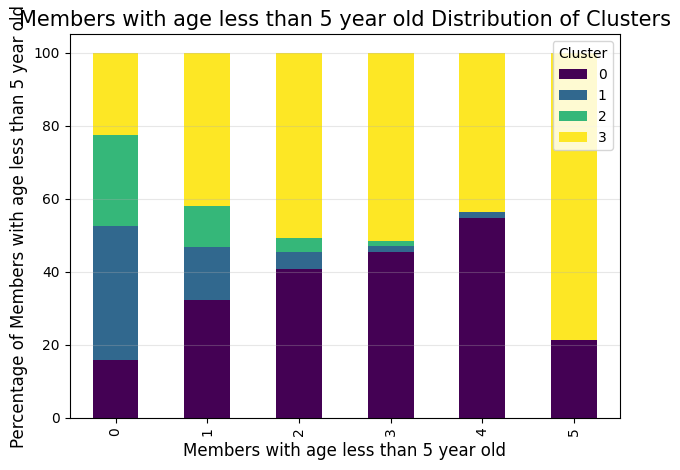

<Figure size 1400x800 with 0 Axes>

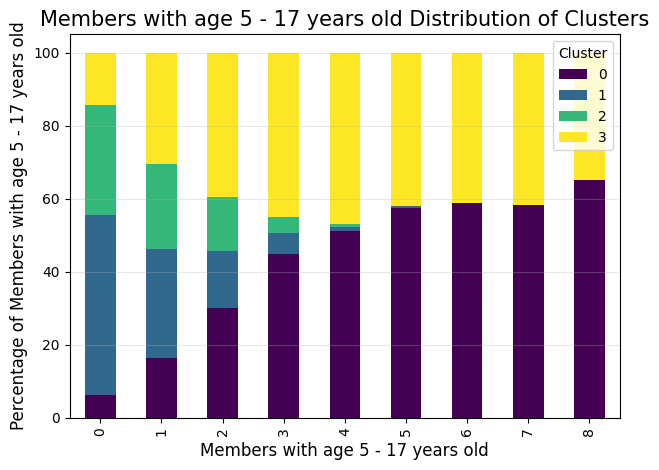

<Figure size 1400x800 with 0 Axes>

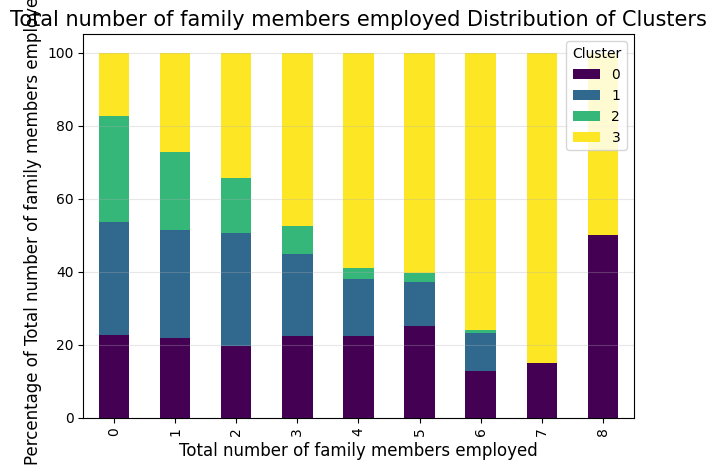

<Figure size 1400x800 with 0 Axes>

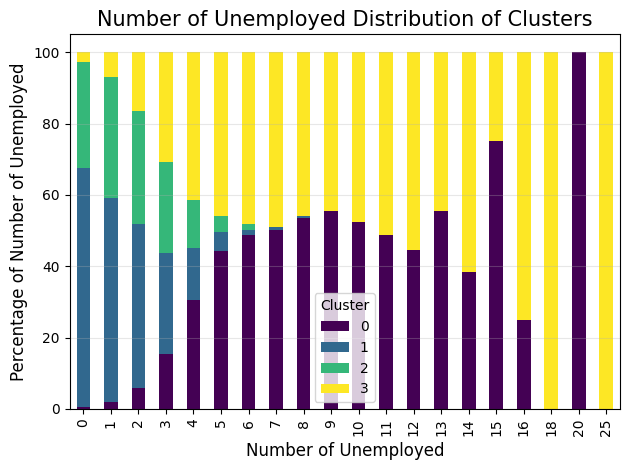

<Figure size 1400x800 with 0 Axes>

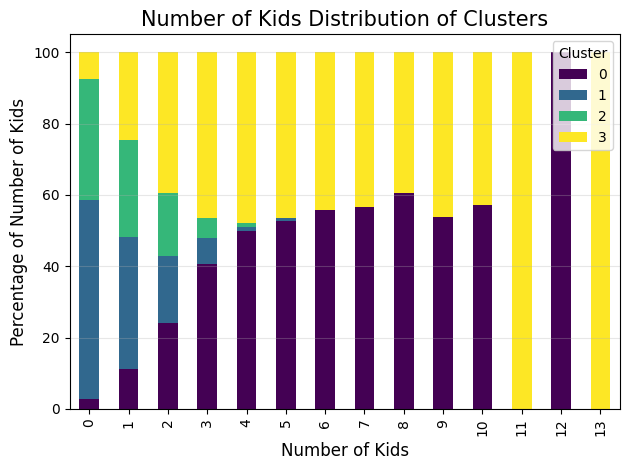

In [ ]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df_IQR_copy[col],
    df_IQR_copy['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

In [ ]:
household_head_characteristics_cat = ['Household Head Sex', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker']

household_head_characteristics_num = ['Household Head Age']

<Figure size 1400x800 with 0 Axes>

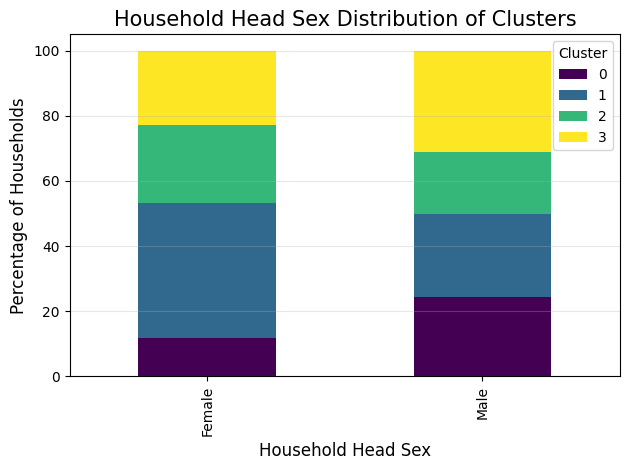

<Figure size 1400x800 with 0 Axes>

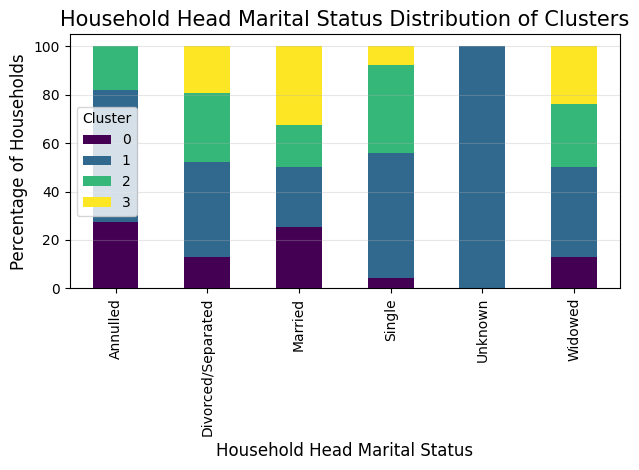

<Figure size 1400x800 with 0 Axes>

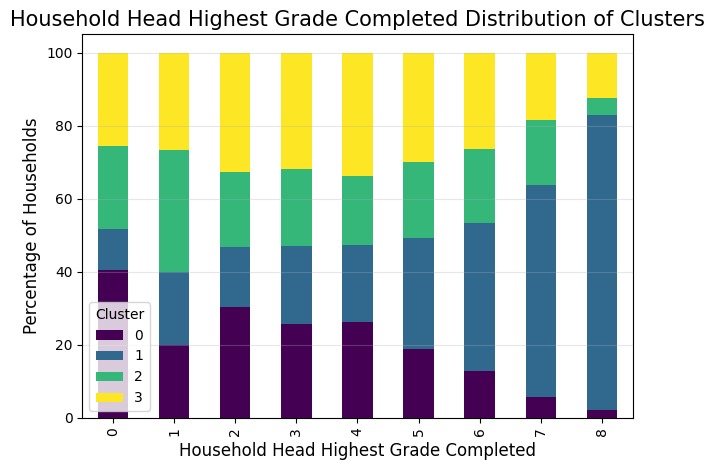

<Figure size 1400x800 with 0 Axes>

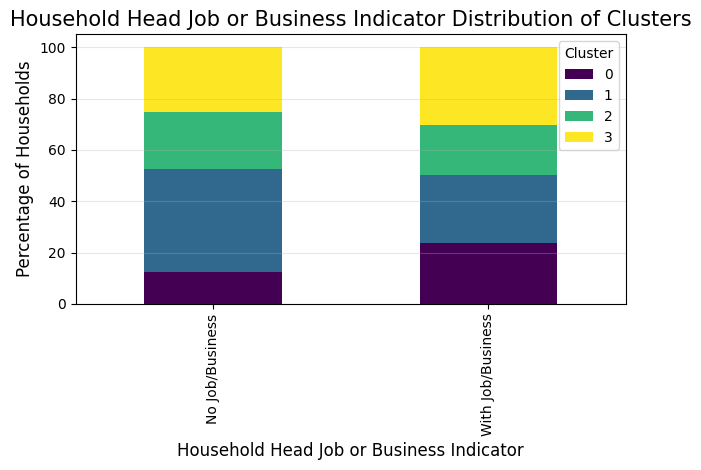

<Figure size 1400x800 with 0 Axes>

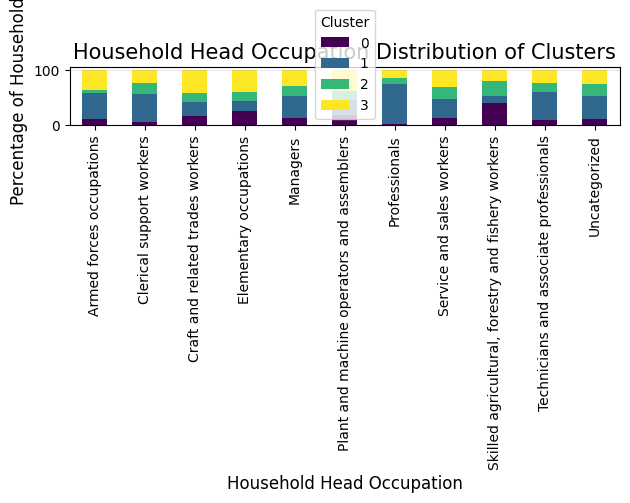

<Figure size 1400x800 with 0 Axes>

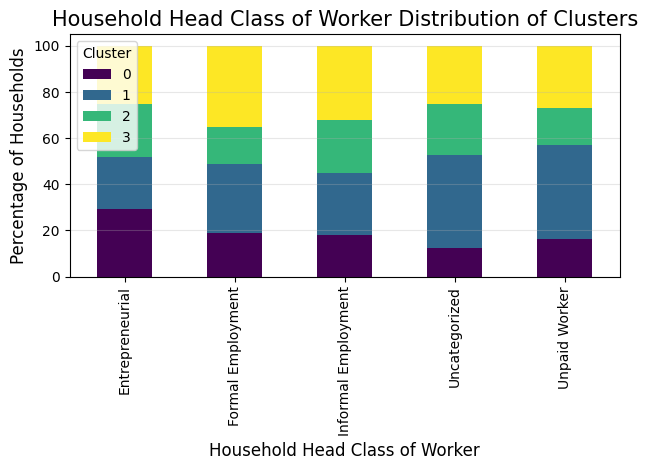

In [ ]:
# Show Categorical Distribution based on Household_head_characteristics
for col in household_head_characteristics_cat:
  household_head_distribution = pd.crosstab(
    df_IQR_copy[col],
    df_IQR_copy['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  household_head_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
for cluster, group in df_IQR_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Occupation'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Occupation
Rice farmers              1169
Farmhands and laborers    1081
Corn farmers               939
Unknown                    932
Coconut farmers            563
Name: count, dtype: int64


Cluster 1:
Specific Occupation
Unknown                                                                                3036
General managers/managing proprietors in wholesale and retail trade                     977
General managers/managing proprietors in transportation, storage and communications     570
Farmhands and laborers                                                                  519
Rice farmers                                                                            341
Name: count, dtype: int64


Cluster 2:
Specific Occupation
Unknown                                                                1679
Rice farmers                                                            983
Farmhands and laborers                                                  482
Corn far

In [ ]:
for cluster, group in df_IQR_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Education Level'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Education Level
Elementary Graduate     1970
High School Graduate    1827
Grade 4                  682
Grade 3                  631
Grade 5                  604
Name: count, dtype: int64


Cluster 1:
Specific Education Level
High School Graduate                                2921
Elementary Graduate                                 1621
Business and Administration Programs                 801
Teacher Training and Education Sciences Programs     603
Second Year College                                  560
Name: count, dtype: int64


Cluster 2:
Specific Education Level
High School Graduate       1983
Elementary Graduate        1612
Grade 4                     463
Grade 5                     437
Second Year High School     415
Name: count, dtype: int64


Cluster 3:
Specific Education Level
High School Graduate       2897
Elementary Graduate        2437
Grade 4                     740
Grade 5                     723
Second Year High School     708
Name: count, dtype: in

In [ ]:
for cluster, group in df_IQR_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Household Head Occupation'].value_counts().head(5))
    print("\n")

In [ ]:
# Display top 10 appearing Specific occupation and education
for col in household_head_characteristics_cat:
  print(df_IQR_copy.groupby('Cluster')[col].value_counts().head(10))

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                          7890
         Widowed                           885
         Divorced/Separated                183
         Single                             80
         Annulled                            3
1        Married                          7876
         Widowed                          2540
         Single                           1007
         Divorced/Separated                558
         Annulled                            6
Name: count, dtype: int64
Cluster  Household Head Highest Grade Completed
0        2                                         2679
         3 

In [ ]:
for col in household_head_characteristics_cat:
  print(df_IQR_copy.groupby('Cluster')[col].value_counts())

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                           7890
         Widowed                            885
         Divorced/Separated                 183
         Single                              80
         Annulled                             3
1        Married                           7876
         Widowed                           2540
         Single                            1007
         Divorced/Separated                 558
         Annulled                             6
         Unknown                              1
2        Married                           5443
         Widowed                   

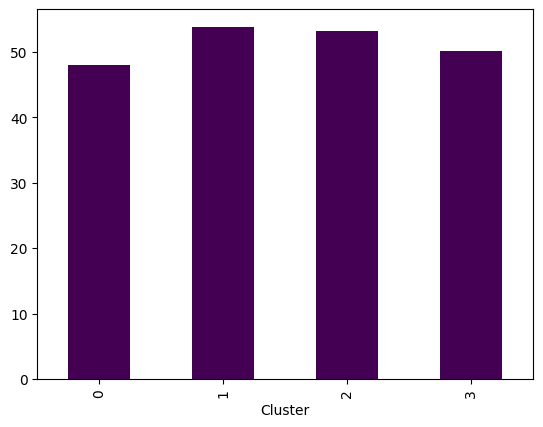

In [ ]:
# Bar Plot for Household Head Age
for column in household_head_characteristics_num:
    df_IQR_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')

In [ ]:
# Display Mean values for each income column, group by cluster
df_IQR_copy.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,141690.585002,43285.701139,48.105851,36106.381816
1,388969.356607,75954.274274,127872.340841,0.000000
2,174346.719069,46360.105124,119.935197,32011.765391
3,237040.615580,46856.170087,52909.837219,0.000000


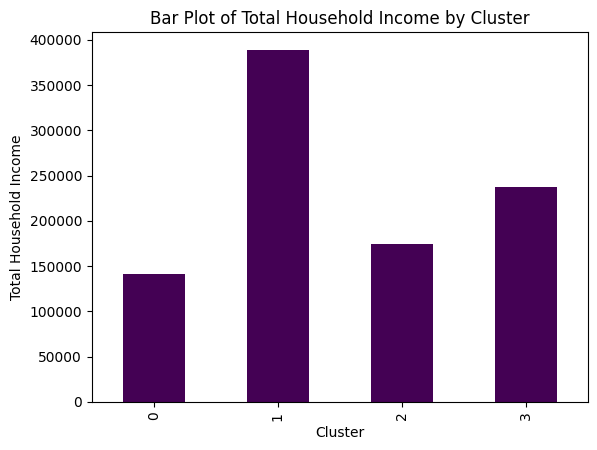

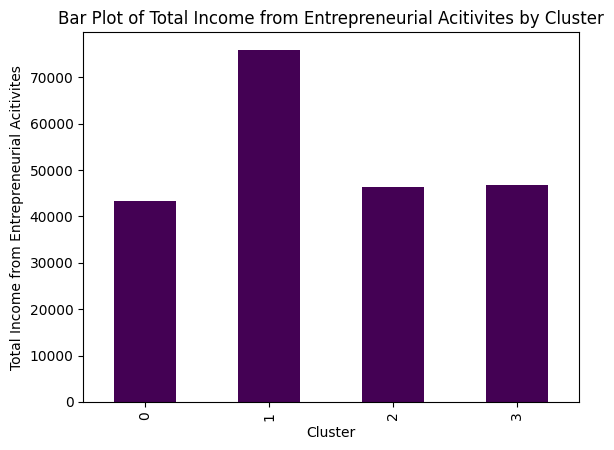

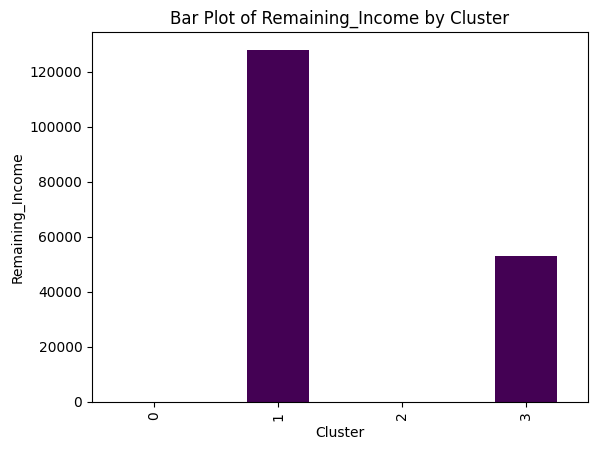

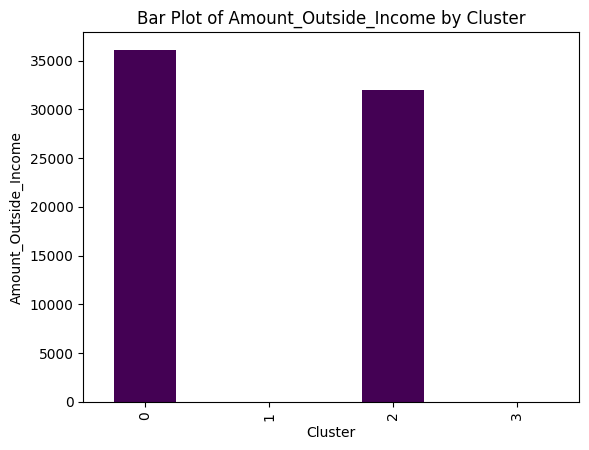

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df_IQR_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df_IQR_copy.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,82007.229621,12690.179405,22597.799137,943.417874,2404.369649,3293.441323,7587.858423,2940.189470,3711.820153,4822.820595,1831.625926,7628.205287,25289.904104,110148.474837,67600.386130,177748.860967
1,90879.510594,19419.117868,59530.493493,1139.492075,2013.690274,7490.205372,19170.169670,8134.003337,11126.694278,11019.070404,7159.033534,17182.017518,6833.517351,168695.731899,92401.283867,261097.015766
2,76241.522261,17281.424217,36074.654746,1056.947078,2139.851674,3981.214569,9882.466579,4657.443298,9048.162366,7466.871955,3345.943598,10471.226209,24590.820713,124710.282971,81528.266291,206238.549262
3,87764.561402,12293.736332,30840.755048,1155.874077,2595.888278,4358.129371,11447.424725,4585.138811,4524.784108,5956.158513,3273.612707,10530.406830,4804.308160,126403.713265,57727.065096,184130.778362


In [ ]:
df_IQR_copy.groupby('Cluster')[ratio_list].mean()

,Meat Ratio,Fish Ratio,Fruit Ratio,Vegetables Ratio,Bread and Cereals Ratio,Rice Ratio,Food Ratio,Housing and water Ratio,Alcoholic Beverages Ratio,Tobacco Ratio,...,House Rental Ratio,Expenditure to Income Ratio,Per Capita Income,Per Capita Expenditure,Essential Spending to Expenditure,NonEssential Spending to Expenditure,Essential Non Food Spending to Expenditure,NonFood Spending to Expenditure,Debt to Income Ratio,Savings to Income Ratio
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.086309,0.131297,0.028237,0.067839,0.396366,0.294069,0.492084,0.125708,0.005638,0.014787,...,0.061382,1.300845,22527.094860,28500.186004,0.643341,0.356659,0.151257,0.507916,0.301549,0.000704
1,0.134592,0.126671,0.035403,0.063245,0.267214,0.187961,0.405992,0.225256,0.006054,0.011720,...,0.128775,0.737097,126550.011127,85967.555584,0.690009,0.309991,0.284018,0.594008,0.000000,0.262903
2,0.111215,0.126866,0.032073,0.068402,0.299537,0.214336,0.423119,0.173799,0.006473,0.013589,...,0.093604,1.208485,57938.843699,68781.038321,0.640451,0.359549,0.217333,0.576881,0.211352,0.002867
3,0.108772,0.136556,0.026306,0.063626,0.364871,0.269941,0.524645,0.162224,0.006754,0.016213,...,0.082356,0.808267,37940.045194,29824.686836,0.720652,0.279348,0.196007,0.475355,0.000000,0.191733


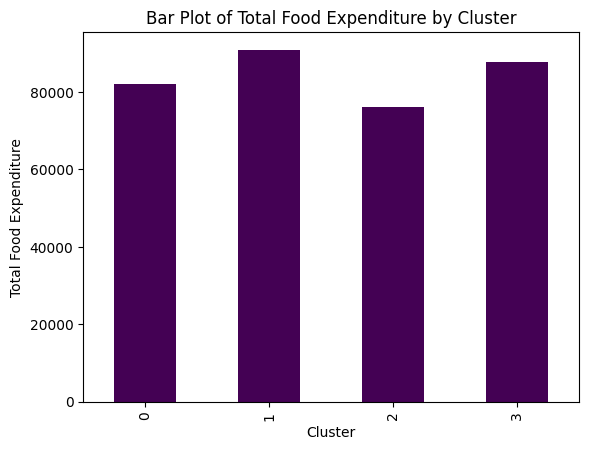

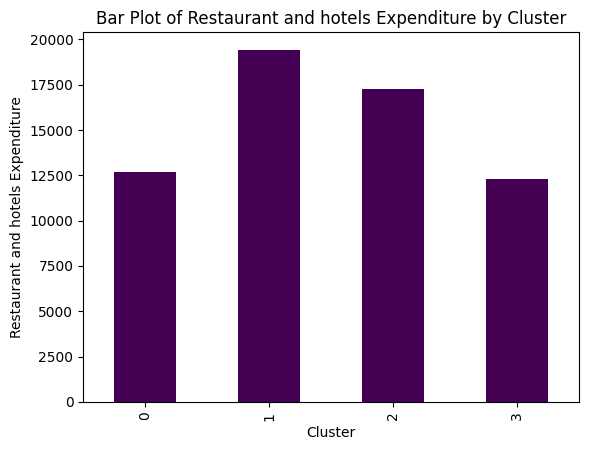

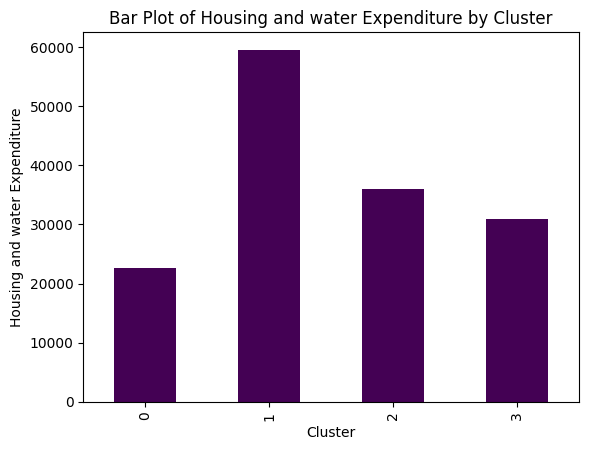

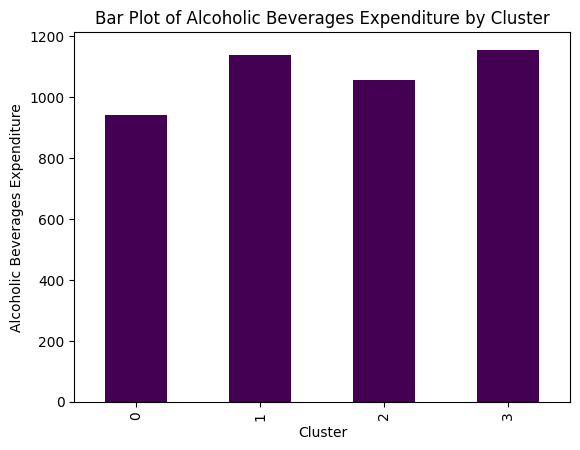

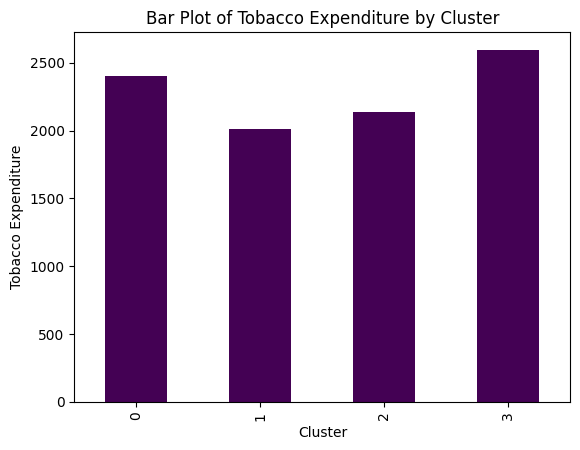

...

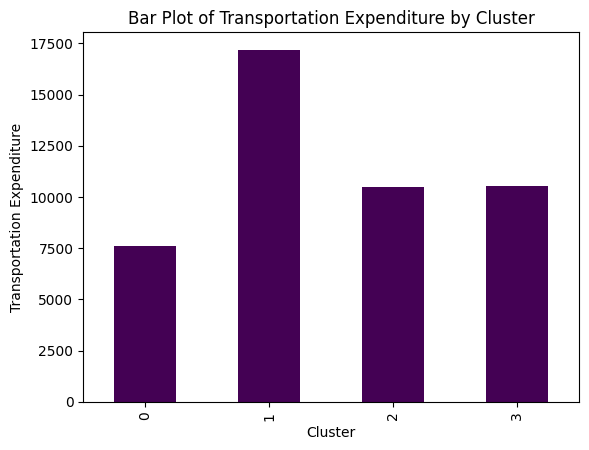

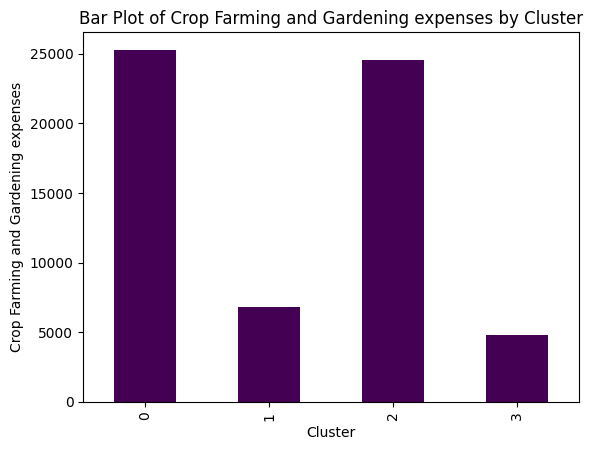

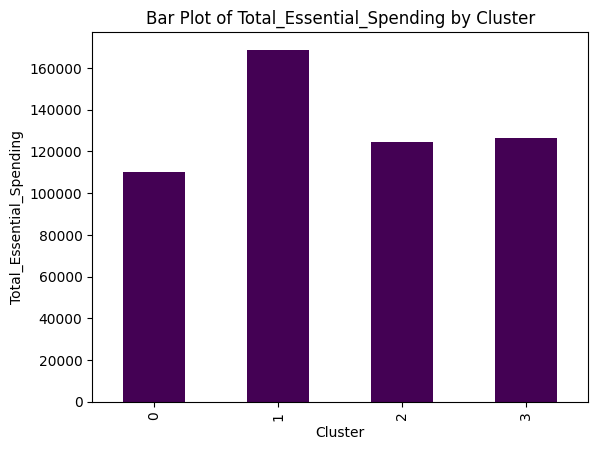

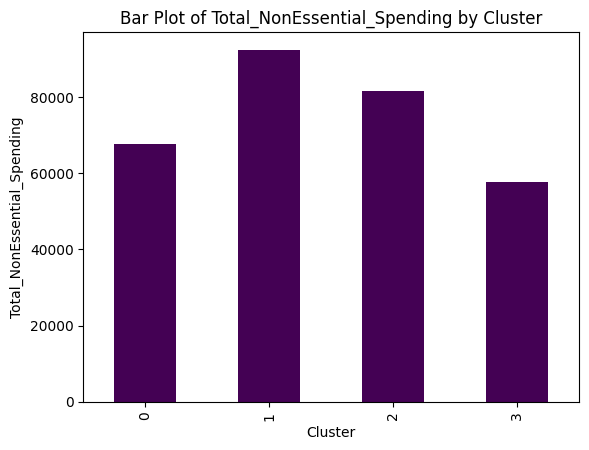

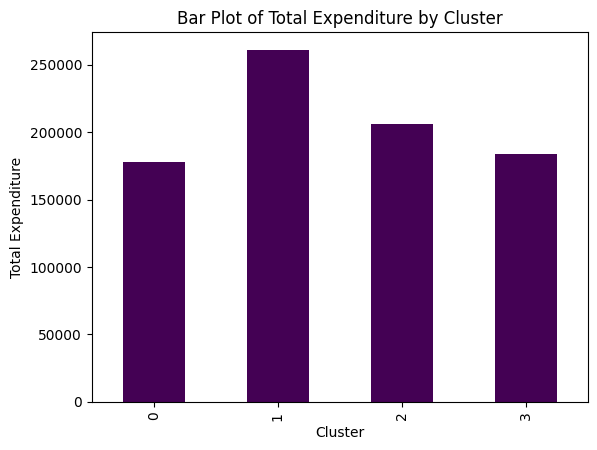

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df_IQR_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

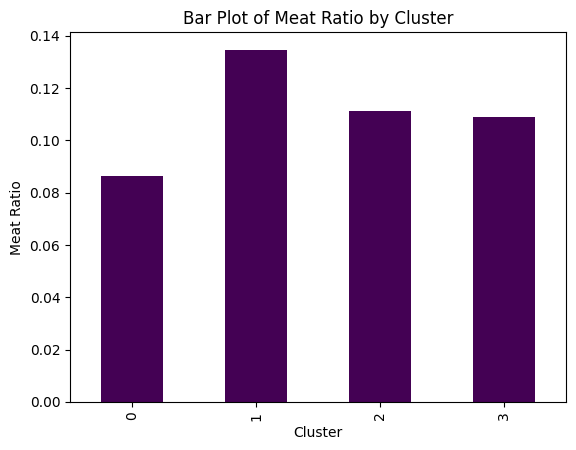

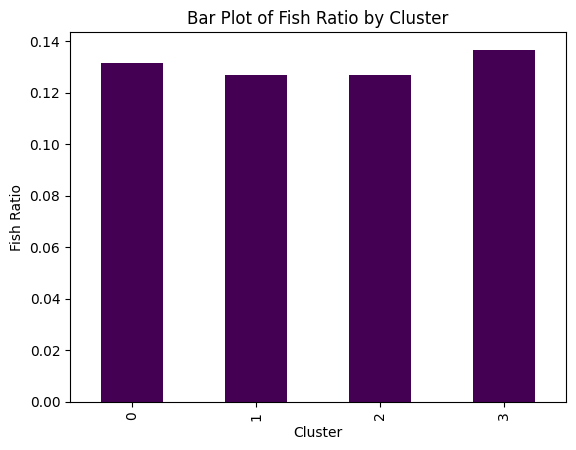

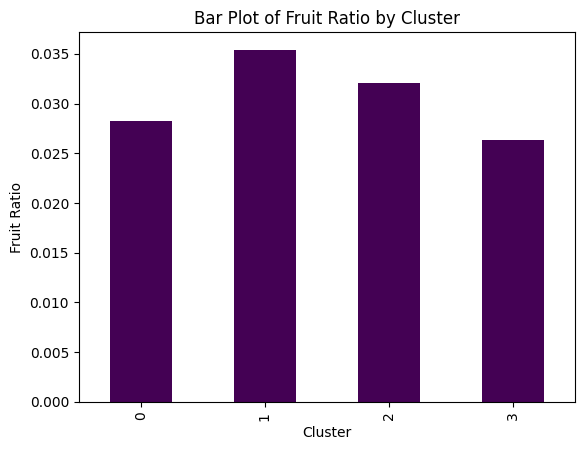

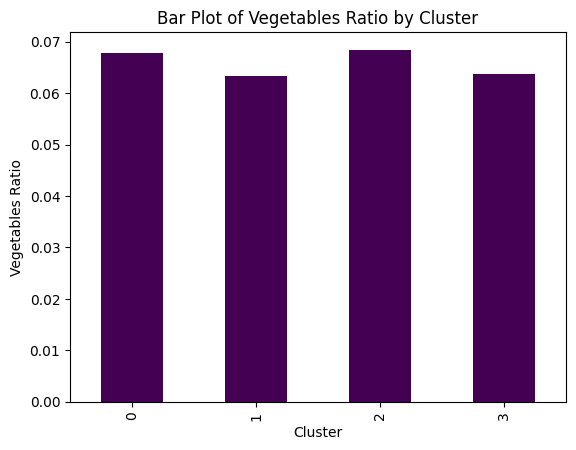

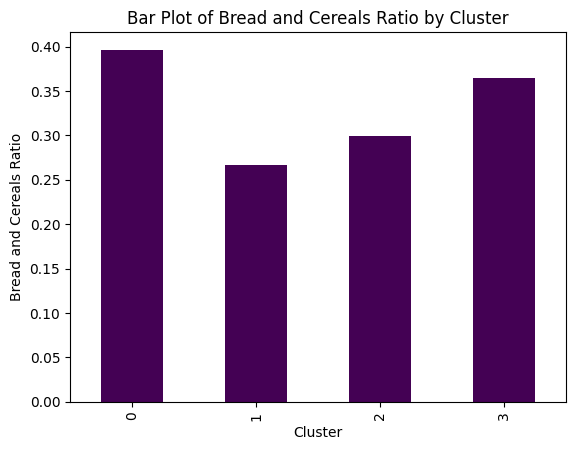

...

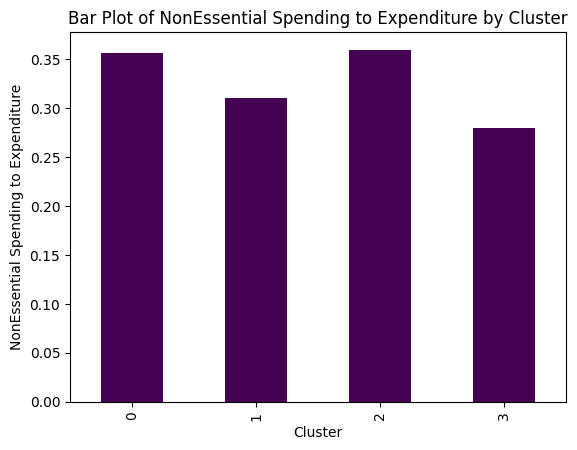

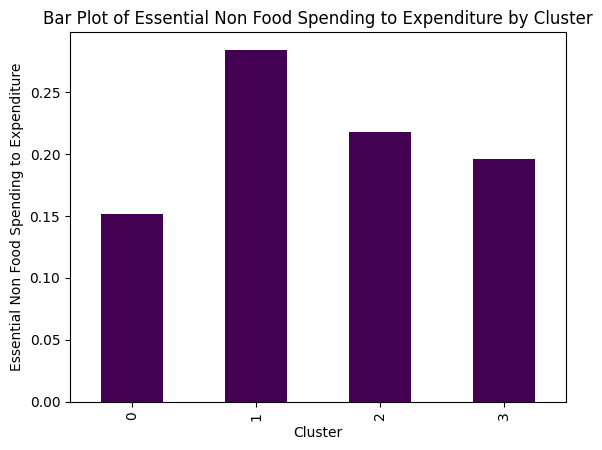

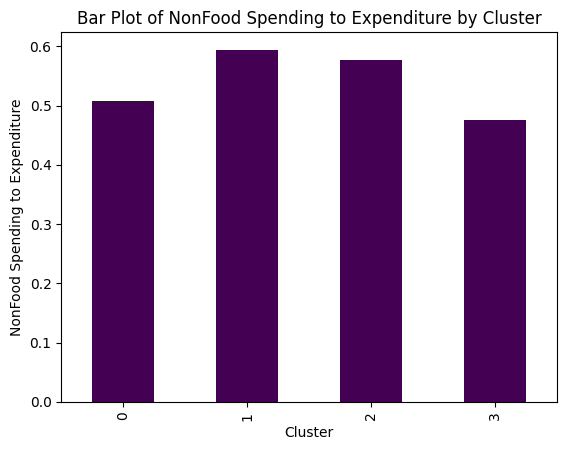

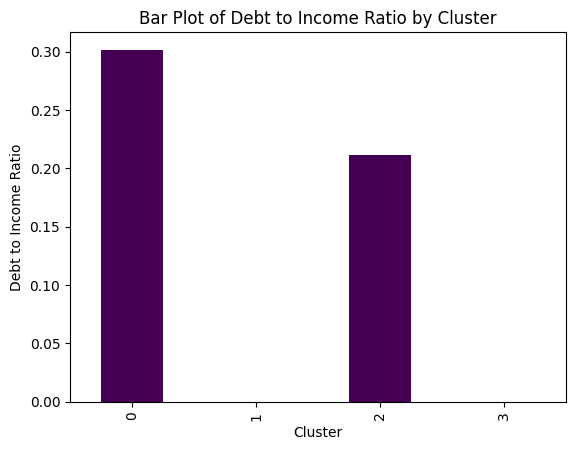

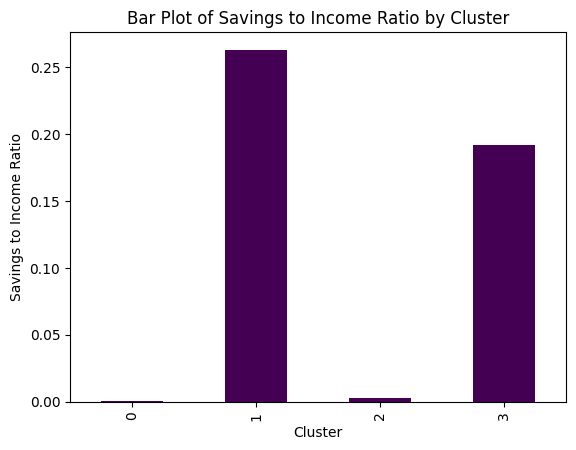

In [ ]:
# Bar Plot for Ratio Columns
for column in ratio_list:
    df_IQR_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

## For df_iso

In [ ]:
# Train a Kmeans model for df_list_with_pca 4
kmeans = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300,
                n_init = 10, random_state = 0)
df_iso_copy['Cluster'] = kmeans.fit_predict(df_list_with_pca[10])

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

silhouette = silhouette_score(df_list_with_pca[10], df_iso_copy['Cluster'])
calinski_harabasz = calinski_harabasz_score(df_list_with_pca[10], df_iso_copy['Cluster'])
davies_bouldin = davies_bouldin_score(df_list_with_pca[10], df_iso_copy['Cluster'])

print(f"Silhouette Score: {silhouette:.4f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.4f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.4f}")

Silhouette Score: 0.3453
Calinski-Harabasz Score: 25202.0254
Davies-Bouldin Score: 0.9823


In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df_iso_copy['Cluster'] = cluster_labels

In [ ]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed',
                       'Number of Unemployed', 'Number of Kids']

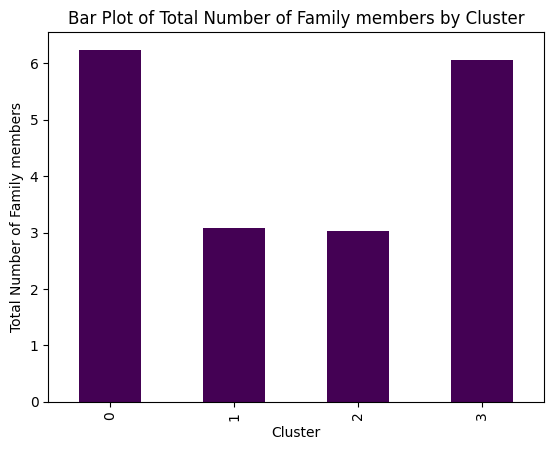

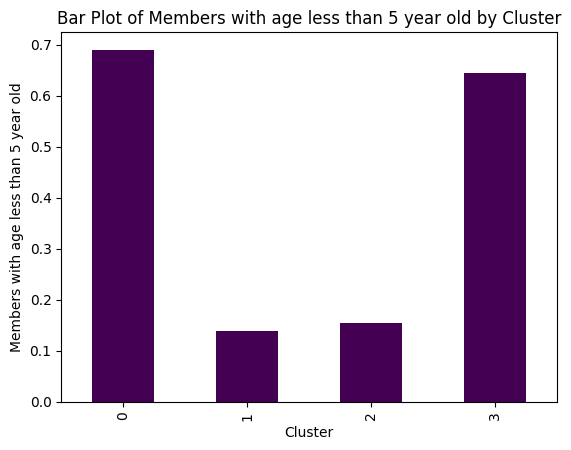

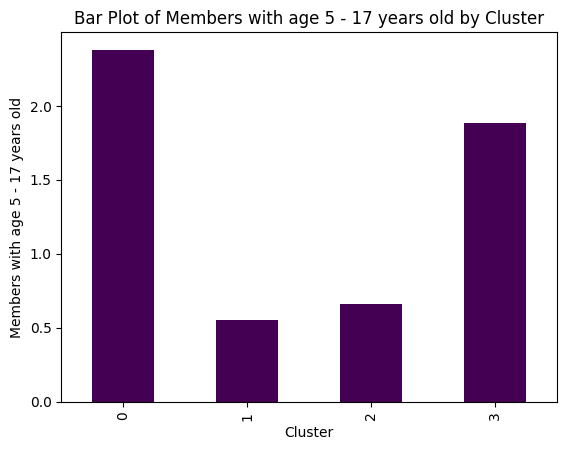

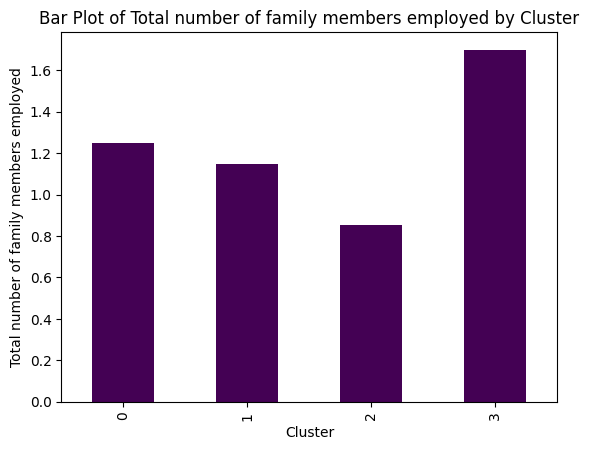

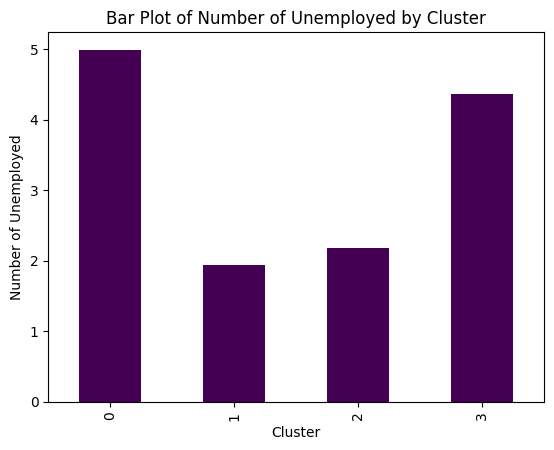

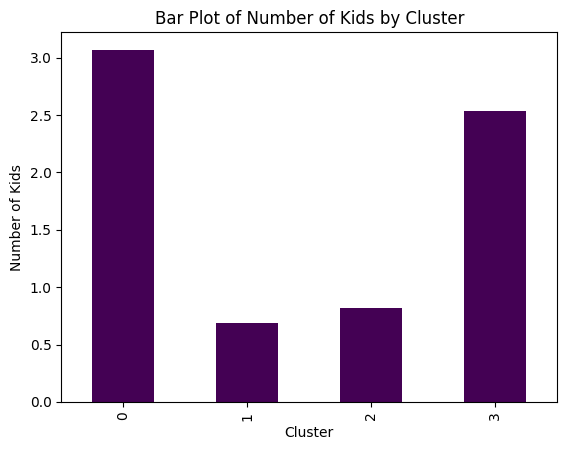

In [ ]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

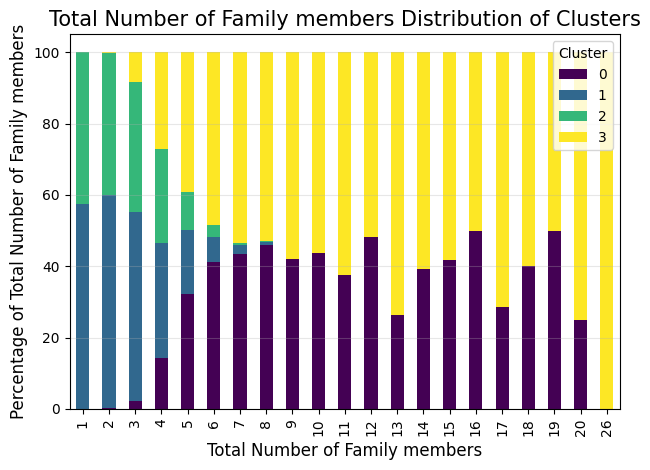

<Figure size 1400x800 with 0 Axes>

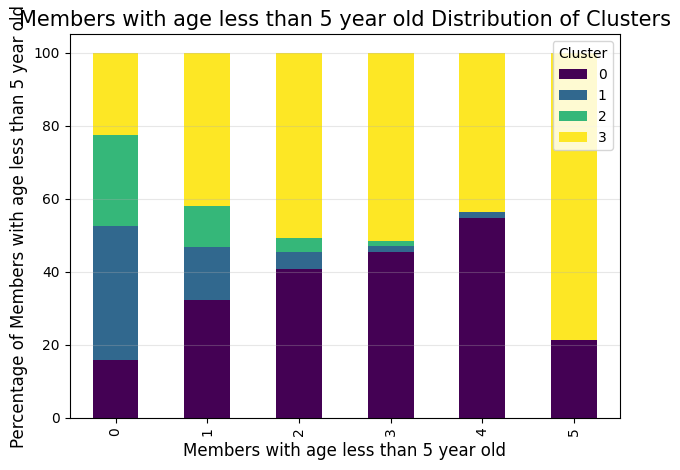

<Figure size 1400x800 with 0 Axes>

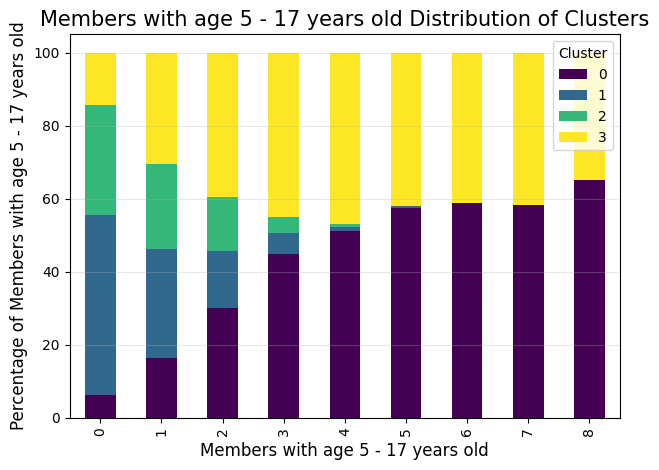

<Figure size 1400x800 with 0 Axes>

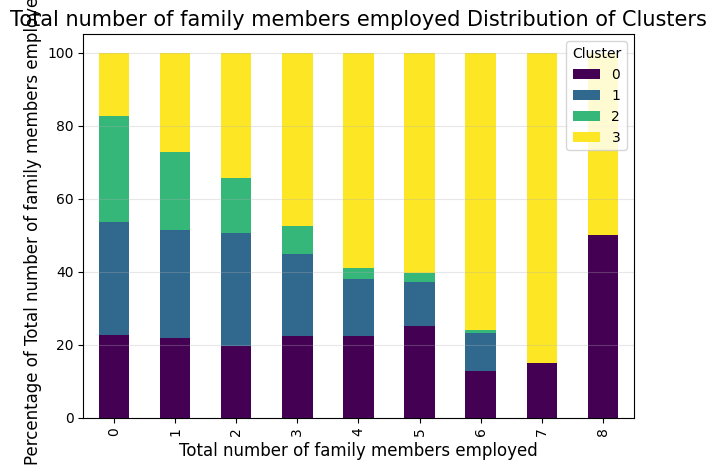

<Figure size 1400x800 with 0 Axes>

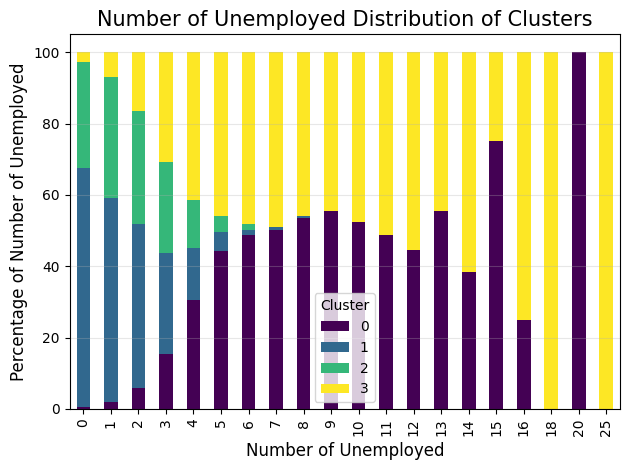

<Figure size 1400x800 with 0 Axes>

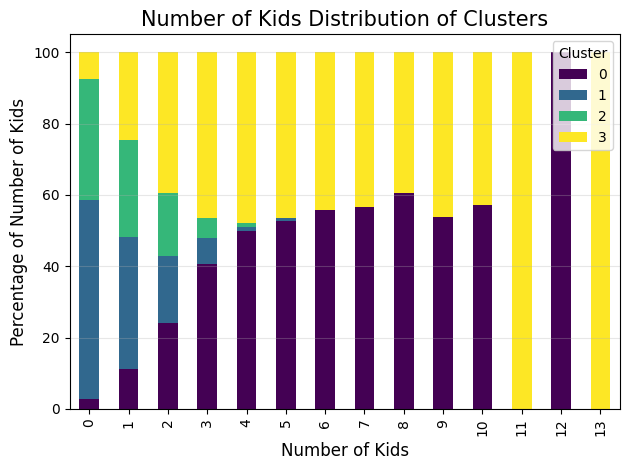

In [ ]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df_iso_copy[col],
    df_iso_copy['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

In [ ]:
household_head_characteristics_cat = ['Household Head Sex', 'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker']

household_head_characteristics_num = ['Household Head Age']

<Figure size 1400x800 with 0 Axes>

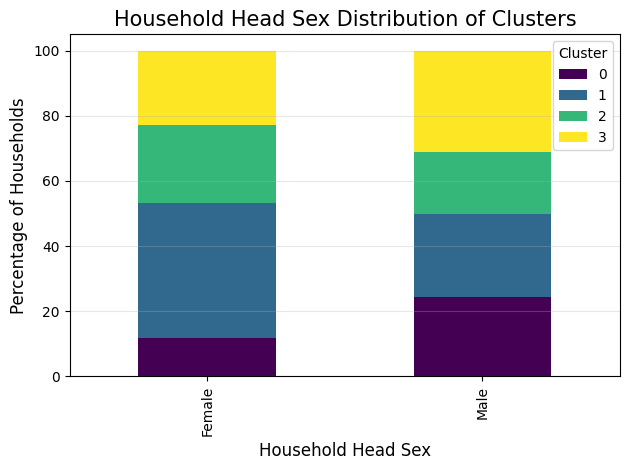

<Figure size 1400x800 with 0 Axes>

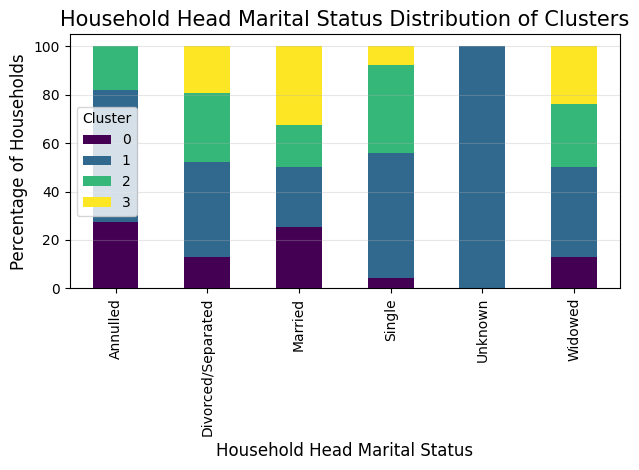

<Figure size 1400x800 with 0 Axes>

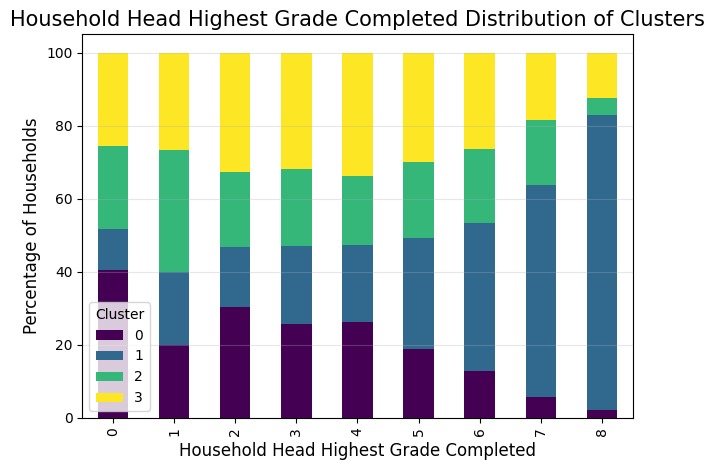

<Figure size 1400x800 with 0 Axes>

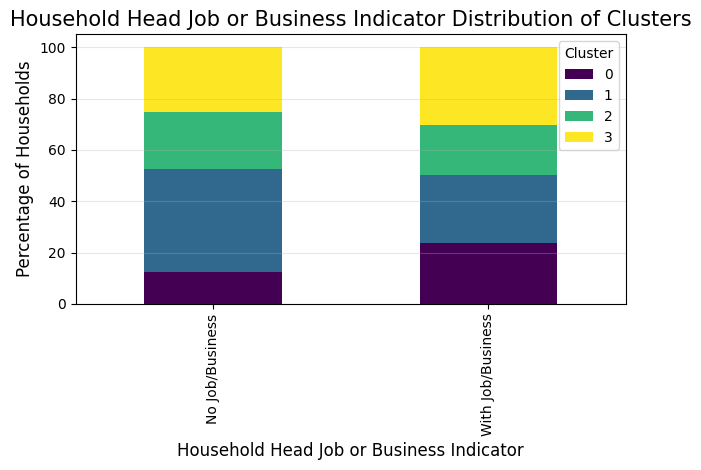

<Figure size 1400x800 with 0 Axes>

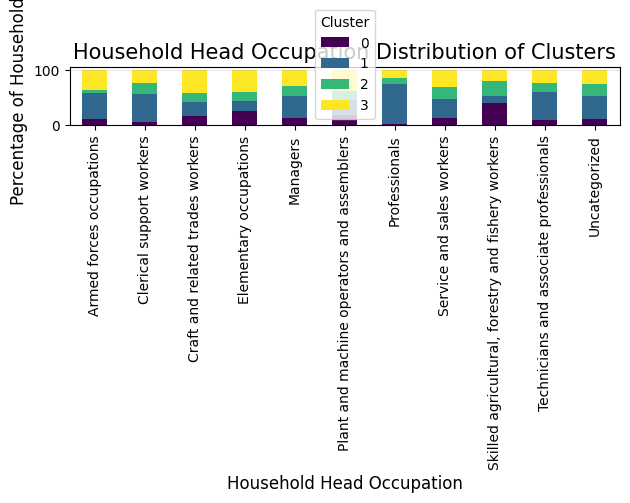

<Figure size 1400x800 with 0 Axes>

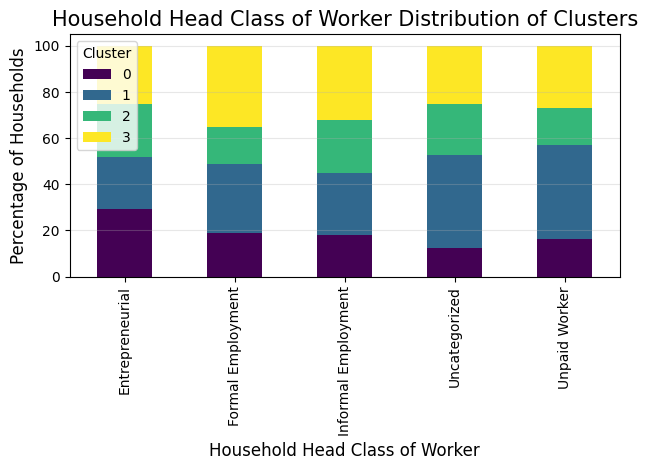

In [ ]:
# Show Categorical Distribution based on Household_head_characteristics
for col in household_head_characteristics_cat:
  household_head_distribution = pd.crosstab(
    df_iso_copy[col],
    df_iso_copy['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  household_head_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
for cluster, group in df_iso_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Occupation'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Occupation
Rice farmers              1169
Farmhands and laborers    1081
Corn farmers               939
Unknown                    932
Coconut farmers            563
Name: count, dtype: int64


Cluster 1:
Specific Occupation
Unknown                                                                                3036
General managers/managing proprietors in wholesale and retail trade                     977
General managers/managing proprietors in transportation, storage and communications     570
Farmhands and laborers                                                                  519
Rice farmers                                                                            341
Name: count, dtype: int64


Cluster 2:
Specific Occupation
Unknown                                                                1679
Rice farmers                                                            983
Farmhands and laborers                                                  482
Corn far

In [ ]:
for cluster, group in df_iso_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Specific Education Level'].value_counts().head(5))
    print("\n")

Cluster 0:
Specific Education Level
Elementary Graduate     1970
High School Graduate    1827
Grade 4                  682
Grade 3                  631
Grade 5                  604
Name: count, dtype: int64


Cluster 1:
Specific Education Level
High School Graduate                                2921
Elementary Graduate                                 1621
Business and Administration Programs                 801
Teacher Training and Education Sciences Programs     603
Second Year College                                  560
Name: count, dtype: int64


Cluster 2:
Specific Education Level
High School Graduate       1983
Elementary Graduate        1612
Grade 4                     463
Grade 5                     437
Second Year High School     415
Name: count, dtype: int64


Cluster 3:
Specific Education Level
High School Graduate       2897
Elementary Graduate        2437
Grade 4                     740
Grade 5                     723
Second Year High School     708
Name: count, dtype: in

In [ ]:
for cluster, group in df_iso_copy.groupby('Cluster'):
    print(f"Cluster {cluster}:")
    print(group['Household Head Occupation'].value_counts().head(5))
    print("\n")

In [ ]:
# Display top 10 appearing Specific occupation and education
for col in household_head_characteristics_cat:
  print(df_iso_copy.groupby('Cluster')[col].value_counts().head(10))

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                          7890
         Widowed                           885
         Divorced/Separated                183
         Single                             80
         Annulled                            3
1        Married                          7876
         Widowed                          2540
         Single                           1007
         Divorced/Separated                558
         Annulled                            6
Name: count, dtype: int64
Cluster  Household Head Highest Grade Completed
0        2                                         2679
         3 

In [ ]:
for col in household_head_characteristics_cat:
  print(df_iso_copy.groupby('Cluster')[col].value_counts())

Cluster  Household Head Sex
0        Male                   7961
         Female                 1080
1        Male                   8235
         Female                 3753
2        Male                   6160
         Female                 2173
3        Male                  10127
         Female                 2055
Name: count, dtype: int64
Cluster  Household Head Marital Status
0        Married                           7890
         Widowed                            885
         Divorced/Separated                 183
         Single                              80
         Annulled                             3
1        Married                           7876
         Widowed                           2540
         Single                            1007
         Divorced/Separated                 558
         Annulled                             6
         Unknown                              1
2        Married                           5443
         Widowed                   

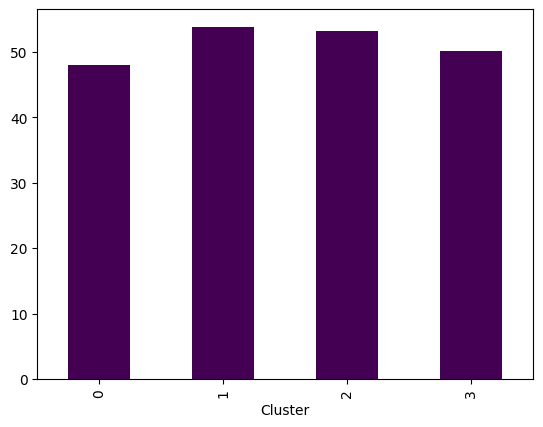

In [ ]:
# Bar Plot for Household Head Age
for column in household_head_characteristics_num:
    df_iso_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')

In [ ]:
# Display Mean values for each income column, group by cluster
df_iso_copy.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,141690.585002,43285.701139,48.105851,36106.381816
1,388969.356607,75954.274274,127872.340841,0.000000
2,174346.719069,46360.105124,119.935197,32011.765391
3,237040.615580,46856.170087,52909.837219,0.000000


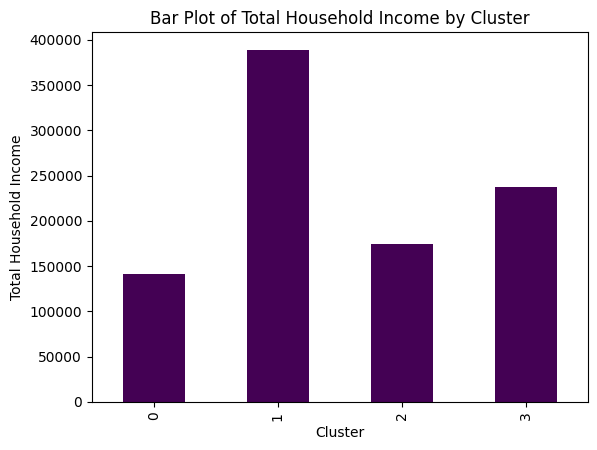

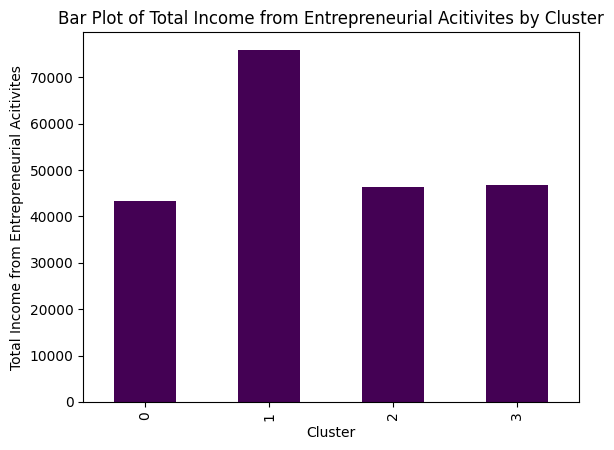

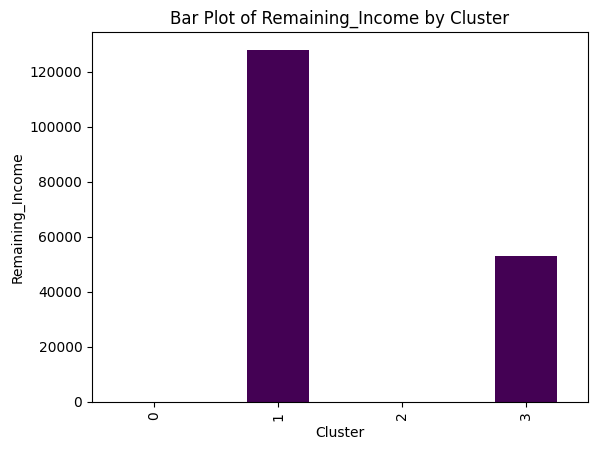

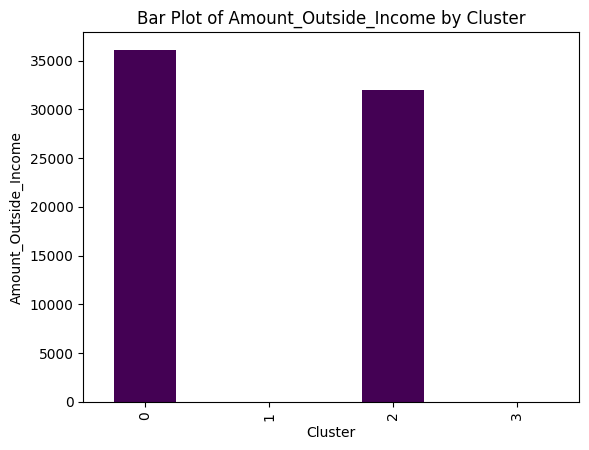

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df_iso_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df_iso_copy.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,82007.229621,12690.179405,22597.799137,943.417874,2404.369649,3293.441323,7587.858423,2940.189470,3711.820153,4822.820595,1831.625926,7628.205287,25289.904104,110148.474837,67600.386130,177748.860967
1,90879.510594,19419.117868,59530.493493,1139.492075,2013.690274,7490.205372,19170.169670,8134.003337,11126.694278,11019.070404,7159.033534,17182.017518,6833.517351,168695.731899,92401.283867,261097.015766
2,76241.522261,17281.424217,36074.654746,1056.947078,2139.851674,3981.214569,9882.466579,4657.443298,9048.162366,7466.871955,3345.943598,10471.226209,24590.820713,124710.282971,81528.266291,206238.549262
3,87764.561402,12293.736332,30840.755048,1155.874077,2595.888278,4358.129371,11447.424725,4585.138811,4524.784108,5956.158513,3273.612707,10530.406830,4804.308160,126403.713265,57727.065096,184130.778362


In [ ]:
df_iso_copy.groupby('Cluster')[ratio_list].mean()

,Meat Ratio,Fish Ratio,Fruit Ratio,Vegetables Ratio,Bread and Cereals Ratio,Rice Ratio,Food Ratio,Housing and water Ratio,Alcoholic Beverages Ratio,Tobacco Ratio,...,House Rental Ratio,Expenditure to Income Ratio,Per Capita Income,Per Capita Expenditure,Essential Spending to Expenditure,NonEssential Spending to Expenditure,Essential Non Food Spending to Expenditure,NonFood Spending to Expenditure,Debt to Income Ratio,Savings to Income Ratio
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.086309,0.131297,0.028237,0.067839,0.396366,0.294069,0.492084,0.125708,0.005638,0.014787,...,0.061382,1.300845,22527.094860,28500.186004,0.643341,0.356659,0.151257,0.507916,0.301549,0.000704
1,0.134592,0.126671,0.035403,0.063245,0.267214,0.187961,0.405992,0.225256,0.006054,0.011720,...,0.128775,0.737097,126550.011127,85967.555584,0.690009,0.309991,0.284018,0.594008,0.000000,0.262903
2,0.111215,0.126866,0.032073,0.068402,0.299537,0.214336,0.423119,0.173799,0.006473,0.013589,...,0.093604,1.208485,57938.843699,68781.038321,0.640451,0.359549,0.217333,0.576881,0.211352,0.002867
3,0.108772,0.136556,0.026306,0.063626,0.364871,0.269941,0.524645,0.162224,0.006754,0.016213,...,0.082356,0.808267,37940.045194,29824.686836,0.720652,0.279348,0.196007,0.475355,0.000000,0.191733


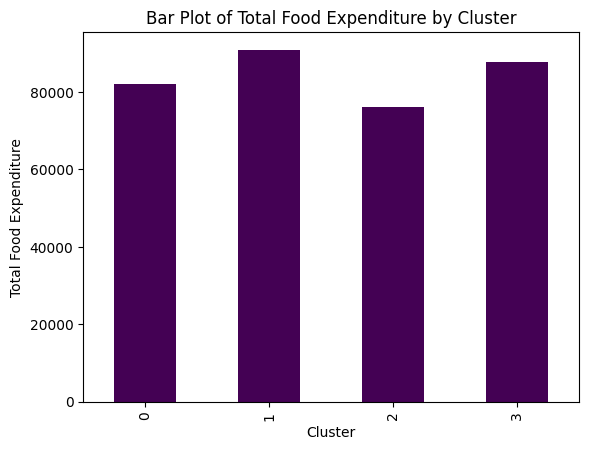

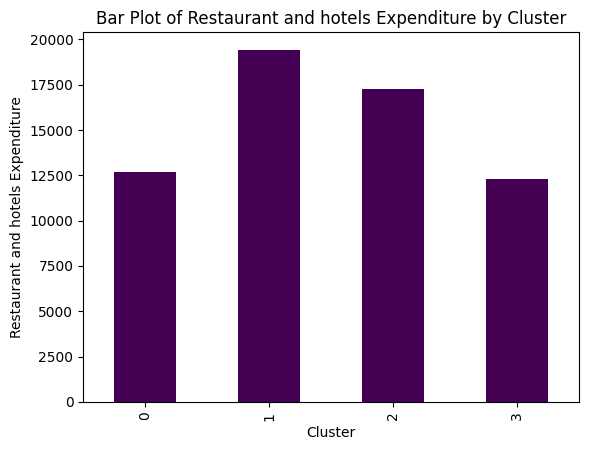

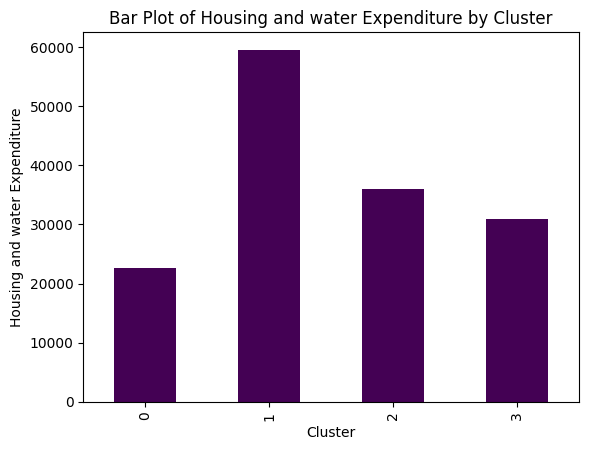

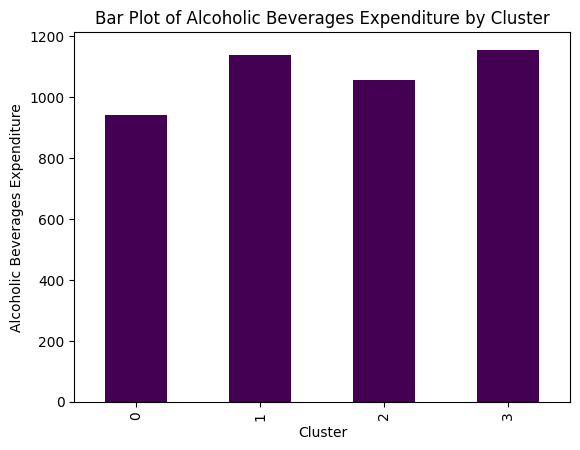

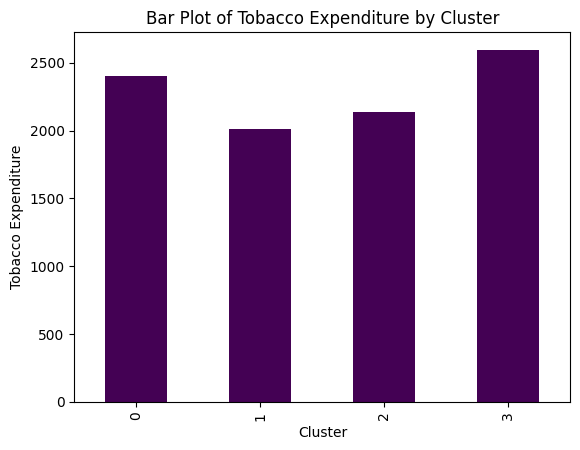

...

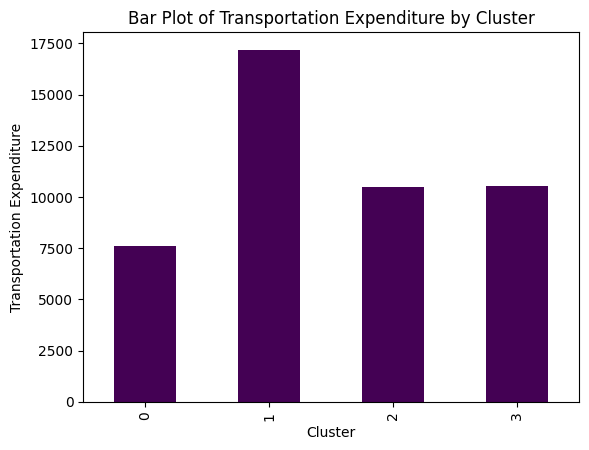

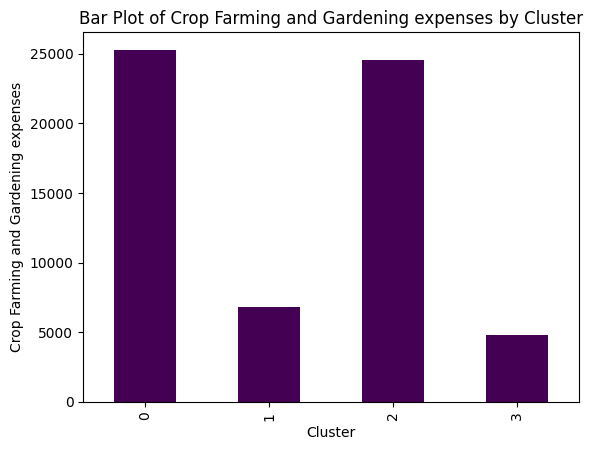

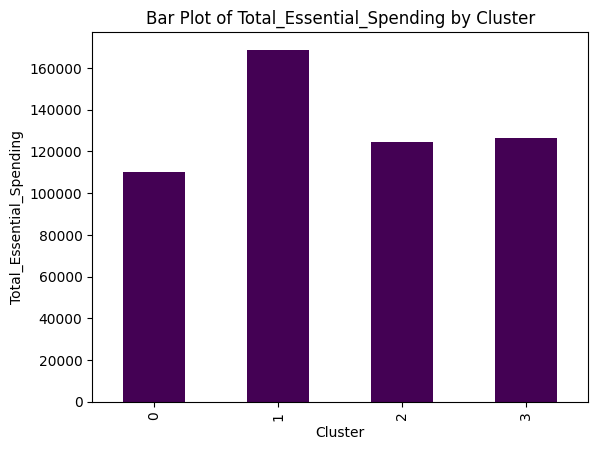

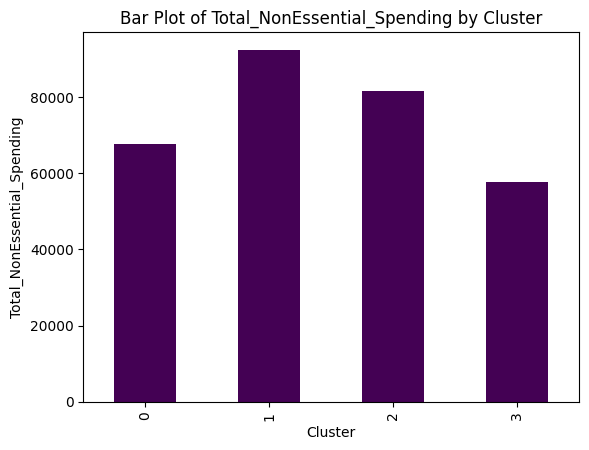

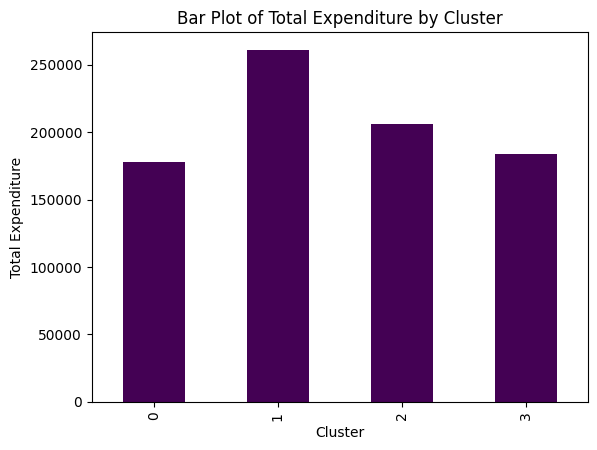

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df_iso_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

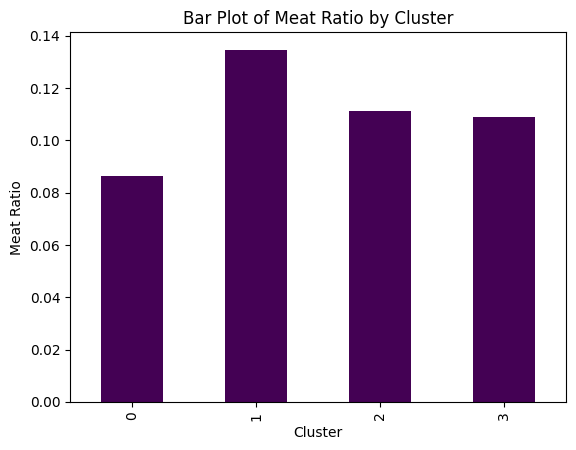

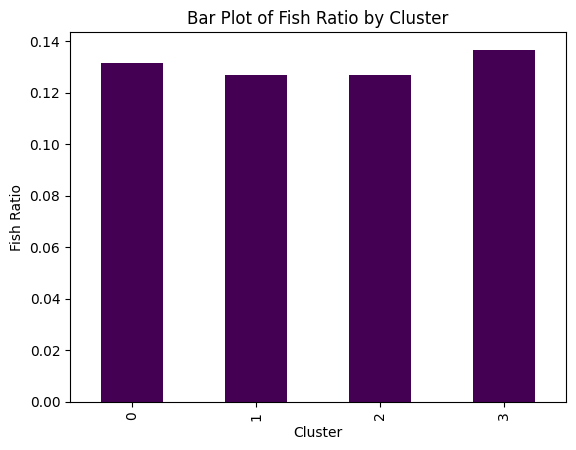

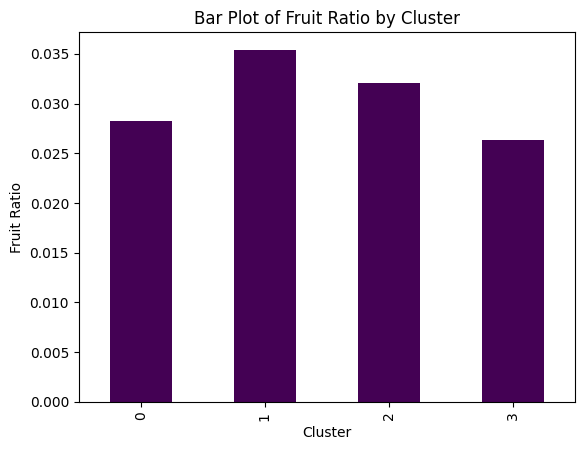

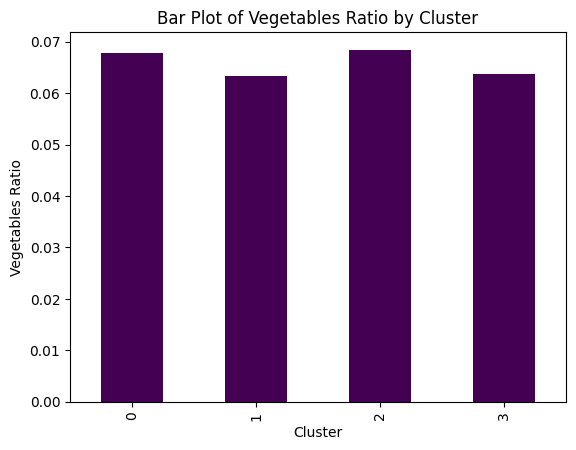

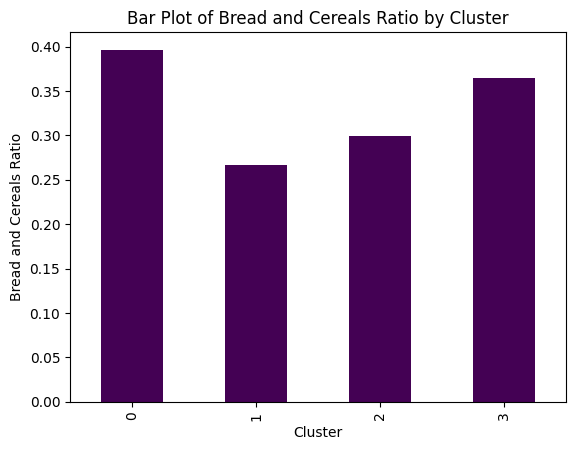

...

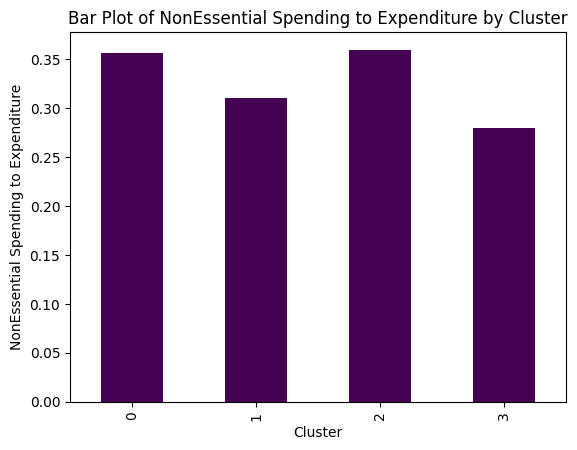

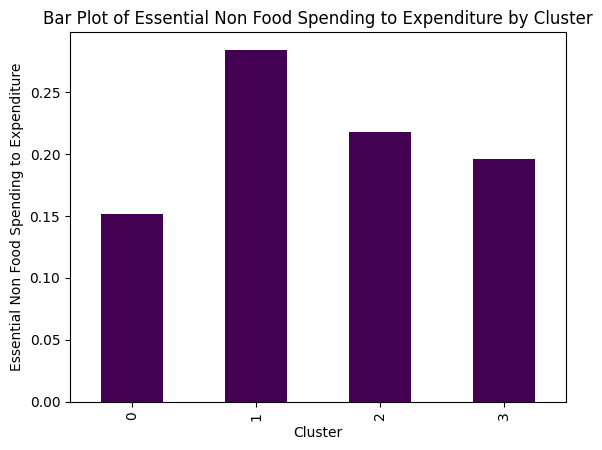

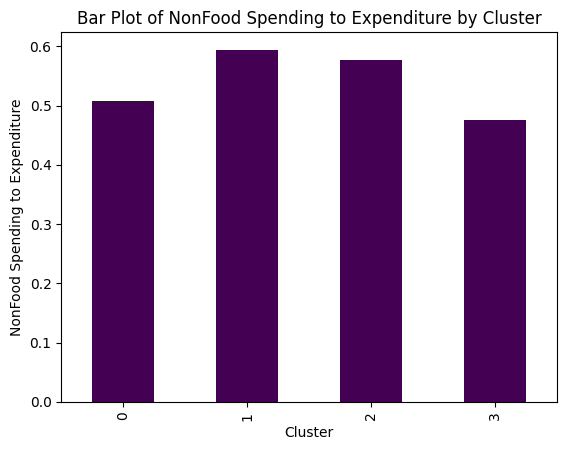

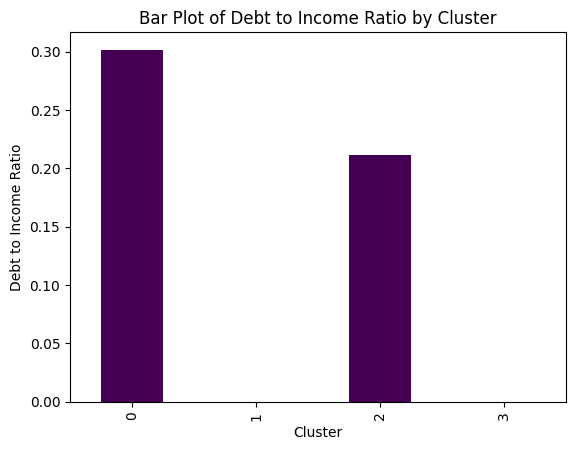

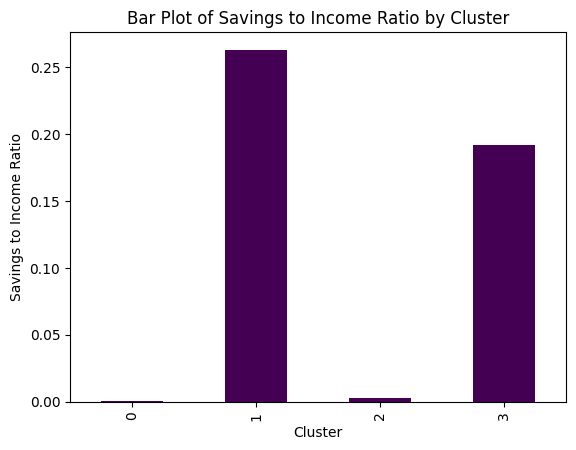

In [ ]:
# Bar Plot for Ratio Columns
for column in ratio_list:
    df_iso_copy.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()